# Imports

In [ ]:
% pip install shap

In [ ]:
#@title
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, HistGradientBoostingClassifier, VotingClassifier, StackingClassifier
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, RocCurveDisplay, precision_recall_curve, PrecisionRecallDisplay,plot_precision_recall_curve
# from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer
from sklearn.feature_selection import SelectKBest, VarianceThreshold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import StackingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegressionCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from imblearn.under_sampling import RandomUnderSampler, TomekLinks, ClusterCentroids, EditedNearestNeighbours
from imblearn.over_sampling import RandomOverSampler, SMOTE, KMeansSMOTE, SVMSMOTE
from imblearn.pipeline import Pipeline
from imblearn.ensemble import BalancedRandomForestClassifier
from matplotlib.ticker import PercentFormatter
from sklearn.model_selection import GridSearchCV
from sklearn.naive_bayes import GaussianNB, MultinomialNB, ComplementNB, BernoulliNB, CategoricalNB
from xgboost import XGBClassifier
from xgboost import plot_importance
import shap
import os
%matplotlib inline

#Display all rows and columns of dataframe
pd.pandas.set_option('display.max_columns', None)
pd.pandas.set_option('display.max_rows', None)

# Data Input

Data source: https://zindi.africa/competitions/busara-mental-health-prediction-challenge/data

In [ ]:
#@title
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# change directory
os.chdir("/content/drive/MyDrive/depression-data")

Mounted at /content/drive


In [ ]:
#@title
train = pd.read_csv("train.csv")
info = pd.read_csv("Variable_explanations.csv")

print(f'training dataset shape: {train.shape}')

training dataset shape: (1143, 75)


To note: feature headings that end in (dummy) are yes/no columns that have been coded as 1/0 (1 for yes, 0 for no)

In [ ]:
#@title
# view description of the features
info

,name,detail
0,surveyid,Individual Identifier
1,village,Village Identifier
2,survey_date,Date of Interview (days since Jan1 of first year)
3,femaleres,Female respondent
4,age,Age (respondent)
5,married,Marital status (respondent)
6,children,Number of children
7,hhsize,Household size
8,edu,Years of education completed (respondent)
9,hh_children,Number of children <=18 or younger in Household


# EDA

## Dropping irrelevant/unused features

In [ ]:
#@title
train.drop('surveyid', axis=1, inplace=True)

In [ ]:
#@title
train.head()

,village,survey_date,femaleres,age,married,children,hhsize,edu,hh_children,hh_totalmembers,cons_nondurable,asset_livestock,asset_durable,asset_phone,asset_savings,asset_land_owned_total,asset_niceroof,cons_allfood,cons_ownfood,cons_alcohol,cons_tobacco,cons_med_total,cons_med_children,cons_ed,cons_social,cons_other,ent_wagelabor,ent_ownfarm,ent_business,ent_nonagbusiness,ent_employees,ent_nonag_revenue,ent_nonag_flowcost,ent_farmrevenue,ent_farmexpenses,ent_animalstockrev,ent_total_cost,fs_adskipm_often,fs_adwholed_often,fs_chskipm_often,fs_chwholed_often,fs_meat,fs_enoughtom,fs_sleephun,med_expenses_hh_ep,med_expenses_sp_ep,med_expenses_child_ep,med_portion_sickinjured,med_port_sick_child,med_afford_port,med_sickdays_hhave,med_healthconsult,med_vacc_newborns,med_child_check,med_u5_deaths,ed_expenses,ed_expenses_perkid,ed_schoolattend,ed_sch_missedpc,ed_work_act_pc,labor_primary,wage_expenditures,durable_investment,nondurable_investment,given_mpesa,amount_given_mpesa,received_mpesa,amount_received_mpesa,net_mpesa,saved_mpesa,amount_saved_mpesa,early_survey,depressed,day_of_week
0,91,23-Nov-61,1,28.0,1,4,6,10,0,NaN,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,0,0.000000,0.000000,1,0.000000,0,0,5
1,57,24-Oct-61,1,23.0,1,3,5,8,0,NaN,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,1,4.804611,4.804611,0,0.000000,0,1,3
2,115,05-Oct-61,1,22.0,1,3,5,9,0,NaN,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,0,8.007685,8.007685,1,0.000000,0,0,5
3,97,23-Sep-61,1,27.0,1,2,4,10,2,4.0,378.83292,526.671080,196.98904,24.023054,49.647648,0.0,0,289.17352,36.434967,0.0,0.0,4.163996,0.960922,1.681614,39.771500,44.042267,0,1,0,1,0,32.030739,0.0,22.288055,1.875133,16.282293,17.890503,0.0,0.0,0.0,0.0,3.0,1.0,1.0,NaN,NaN,NaN,0.000000,0.00,NaN,0.000000,NaN,1,1,NaN,20.179367,10.089684,0.50,1.50,0.00,0,0,778.11230,69.219765,0,0.0,0,0.000000,0.000000,1,1.249199,0,0,0
4,42,12-Sep-61,0,59.0,0,4,6,10,4,6.0,258.67188,8.260629,173.52654,19.218445,0.000000,0.5,0,173.01099,0.870168,0.0,0.0,0.800768,0.800768,2.268844,8.087762,74.503502,1,0,0,0,0,0.000000,0.0,0.533846,2.073101,0.000000,2.073101,0.0,0.0,0.0,0.0,2.0,0.0,0.0,NaN,NaN,1.233183,0.333333,0.25,0.5,1.166667,1.0,1,1,NaN,27.226130,6.806532,0.75,1.75,1.25,1,0,201.00562,4.341945,0,0.0,0,0.000000,0.000000,0,0.000000,0,0,3


## Data types

In [ ]:
#@title
# All except survey_date feature is numerical
print("Type of variables: ", "\n", train.dtypes)


Type of variables:  
 village                      int64
survey_date                 object
femaleres                    int64
age                        float64
married                      int64
children                     int64
hhsize                       int64
edu                          int64
hh_children                  int64
hh_totalmembers            float64
cons_nondurable            float64
asset_livestock            float64
asset_durable              float64
asset_phone                float64
asset_savings              float64
asset_land_owned_total     float64
asset_niceroof               int64
cons_allfood               float64
cons_ownfood               float64
cons_alcohol               float64
cons_tobacco               float64
cons_med_total             float64
cons_med_children          float64
cons_ed                    float64
cons_social                float64
cons_other                 float64
ent_wagelabor                int64
ent_ownfarm                  int6

All except one feature i.e. survey_date is numerical. Since this is the only non-numerical feature, we should take a deeper look at the survey_date feature to see if we can convert this feature into numerical representation.

In [ ]:
#@title
train["survey_date"].head()

0    23-Nov-61
1    24-Oct-61
2    05-Oct-61
3    23-Sep-61
4    12-Sep-61
Name: survey_date, dtype: object

We can see that the survey_date feature consists of day, month and year. We can break the survey_date feature into 3 new features survey_day, survey_month, survey_year. This will allow us to perform deeper analysis related to survey date during EDA, as well as more suited for various machine learning models.

In [ ]:
#@title
# transform month from name to numeric
def monthToNum(month):
    return {
            'Jan': 1,
            'Feb': 2,
            'Mar': 3,
            'Apr': 4,
            'May': 5,
            'Jun': 6,
            'Jul': 7,
            'Aug': 8,
            'Sep': 9, 
            'Oct': 10,
            'Nov': 11,
            'Dec': 12
    }[month]

In [ ]:
#@title
train[["survey_day", "survey_month", "survey_year"]] = train["survey_date"].str.split("-", expand = True)

train["survey_day"] = train["survey_day"].astype(int)
train["survey_month"] = train["survey_month"].apply(lambda x: monthToNum(x))
train["survey_year"] = train["survey_year"].astype(int)

# drop the original survey_date feature
train.drop('survey_date', axis=1, inplace=True)

In [ ]:
#@title
train.head()

,village,femaleres,age,married,children,hhsize,edu,hh_children,hh_totalmembers,cons_nondurable,asset_livestock,asset_durable,asset_phone,asset_savings,asset_land_owned_total,asset_niceroof,cons_allfood,cons_ownfood,cons_alcohol,cons_tobacco,cons_med_total,cons_med_children,cons_ed,cons_social,cons_other,ent_wagelabor,ent_ownfarm,ent_business,ent_nonagbusiness,ent_employees,ent_nonag_revenue,ent_nonag_flowcost,ent_farmrevenue,ent_farmexpenses,ent_animalstockrev,ent_total_cost,fs_adskipm_often,fs_adwholed_often,fs_chskipm_often,fs_chwholed_often,fs_meat,fs_enoughtom,fs_sleephun,med_expenses_hh_ep,med_expenses_sp_ep,med_expenses_child_ep,med_portion_sickinjured,med_port_sick_child,med_afford_port,med_sickdays_hhave,med_healthconsult,med_vacc_newborns,med_child_check,med_u5_deaths,ed_expenses,ed_expenses_perkid,ed_schoolattend,ed_sch_missedpc,ed_work_act_pc,labor_primary,wage_expenditures,durable_investment,nondurable_investment,given_mpesa,amount_given_mpesa,received_mpesa,amount_received_mpesa,net_mpesa,saved_mpesa,amount_saved_mpesa,early_survey,depressed,day_of_week,survey_day,survey_month,survey_year
0,91,1,28.0,1,4,6,10,0,NaN,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,0,0.000000,0.000000,1,0.000000,0,0,5,23,11,61
1,57,1,23.0,1,3,5,8,0,NaN,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,1,4.804611,4.804611,0,0.000000,0,1,3,24,10,61
2,115,1,22.0,1,3,5,9,0,NaN,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,0,8.007685,8.007685,1,0.000000,0,0,5,5,10,61
3,97,1,27.0,1,2,4,10,2,4.0,378.83292,526.671080,196.98904,24.023054,49.647648,0.0,0,289.17352,36.434967,0.0,0.0,4.163996,0.960922,1.681614,39.771500,44.042267,0,1,0,1,0,32.030739,0.0,22.288055,1.875133,16.282293,17.890503,0.0,0.0,0.0,0.0,3.0,1.0,1.0,NaN,NaN,NaN,0.000000,0.00,NaN,0.000000,NaN,1,1,NaN,20.179367,10.089684,0.50,1.50,0.00,0,0,778.11230,69.219765,0,0.0,0,0.000000,0.000000,1,1.249199,0,0,0,23,9,61
4,42,0,59.0,0,4,6,10,4,6.0,258.67188,8.260629,173.52654,19.218445,0.000000,0.5,0,173.01099,0.870168,0.0,0.0,0.800768,0.800768,2.268844,8.087762,74.503502,1,0,0,0,0,0.000000,0.0,0.533846,2.073101,0.000000,2.073101,0.0,0.0,0.0,0.0,2.0,0.0,0.0,NaN,NaN,1.233183,0.333333,0.25,0.5,1.166667,1.0,1,1,NaN,27.226130,6.806532,0.75,1.75,1.25,1,0,201.00562,4.341945,0,0.0,0,0.000000,0.000000,0,0.000000,0,0,3,12,9,61


As the year is represented in YY format, we can convert it into YYYY format for greater readability

In [ ]:
#@title
train["survey_year"].unique()

array([61, 60])

In [ ]:
#@title
train['survey_year'] = train['survey_year'].apply(lambda x: 1900 + x)

train.head()

,village,femaleres,age,married,children,hhsize,edu,hh_children,hh_totalmembers,cons_nondurable,asset_livestock,asset_durable,asset_phone,asset_savings,asset_land_owned_total,asset_niceroof,cons_allfood,cons_ownfood,cons_alcohol,cons_tobacco,cons_med_total,cons_med_children,cons_ed,cons_social,cons_other,ent_wagelabor,ent_ownfarm,ent_business,ent_nonagbusiness,ent_employees,ent_nonag_revenue,ent_nonag_flowcost,ent_farmrevenue,ent_farmexpenses,ent_animalstockrev,ent_total_cost,fs_adskipm_often,fs_adwholed_often,fs_chskipm_often,fs_chwholed_often,fs_meat,fs_enoughtom,fs_sleephun,med_expenses_hh_ep,med_expenses_sp_ep,med_expenses_child_ep,med_portion_sickinjured,med_port_sick_child,med_afford_port,med_sickdays_hhave,med_healthconsult,med_vacc_newborns,med_child_check,med_u5_deaths,ed_expenses,ed_expenses_perkid,ed_schoolattend,ed_sch_missedpc,ed_work_act_pc,labor_primary,wage_expenditures,durable_investment,nondurable_investment,given_mpesa,amount_given_mpesa,received_mpesa,amount_received_mpesa,net_mpesa,saved_mpesa,amount_saved_mpesa,early_survey,depressed,day_of_week,survey_day,survey_month,survey_year
0,91,1,28.0,1,4,6,10,0,NaN,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,0,0.000000,0.000000,1,0.000000,0,0,5,23,11,1961
1,57,1,23.0,1,3,5,8,0,NaN,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,1,4.804611,4.804611,0,0.000000,0,1,3,24,10,1961
2,115,1,22.0,1,3,5,9,0,NaN,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,0,8.007685,8.007685,1,0.000000,0,0,5,5,10,1961
3,97,1,27.0,1,2,4,10,2,4.0,378.83292,526.671080,196.98904,24.023054,49.647648,0.0,0,289.17352,36.434967,0.0,0.0,4.163996,0.960922,1.681614,39.771500,44.042267,0,1,0,1,0,32.030739,0.0,22.288055,1.875133,16.282293,17.890503,0.0,0.0,0.0,0.0,3.0,1.0,1.0,NaN,NaN,NaN,0.000000,0.00,NaN,0.000000,NaN,1,1,NaN,20.179367,10.089684,0.50,1.50,0.00,0,0,778.11230,69.219765,0,0.0,0,0.000000,0.000000,1,1.249199,0,0,0,23,9,1961
4,42,0,59.0,0,4,6,10,4,6.0,258.67188,8.260629,173.52654,19.218445,0.000000,0.5,0,173.01099,0.870168,0.0,0.0,0.800768,0.800768,2.268844,8.087762,74.503502,1,0,0,0,0,0.000000,0.0,0.533846,2.073101,0.000000,2.073101,0.0,0.0,0.0,0.0,2.0,0.0,0.0,NaN,NaN,1.233183,0.333333,0.25,0.5,1.166667,1.0,1,1,NaN,27.226130,6.806532,0.75,1.75,1.25,1,0,201.00562,4.341945,0,0.0,0,0.000000,0.000000,0,0.000000,0,0,3,12,9,1961


In [ ]:
#@title
# Check the type again to ensure all features are numeric
print("Type of variables: ", "\n", train.dtypes)

Type of variables:  
 village                      int64
femaleres                    int64
age                        float64
married                      int64
children                     int64
hhsize                       int64
edu                          int64
hh_children                  int64
hh_totalmembers            float64
cons_nondurable            float64
asset_livestock            float64
asset_durable              float64
asset_phone                float64
asset_savings              float64
asset_land_owned_total     float64
asset_niceroof               int64
cons_allfood               float64
cons_ownfood               float64
cons_alcohol               float64
cons_tobacco               float64
cons_med_total             float64
cons_med_children          float64
cons_ed                    float64
cons_social                float64
cons_other                 float64
ent_wagelabor                int64
ent_ownfarm                  int64
ent_business                 int6

## Duplicated rows

In [ ]:
#@title
duplicate_rows = train[train.duplicated()]
print(duplicate_rows)

# drop duplicated
train.drop_duplicates(keep=False, inplace=True)

# print duplicated rows
print(duplicate_rows)

Empty DataFrame
Columns: [village, femaleres, age, married, children, hhsize, edu, hh_children, hh_totalmembers, cons_nondurable, asset_livestock, asset_durable, asset_phone, asset_savings, asset_land_owned_total, asset_niceroof, cons_allfood, cons_ownfood, cons_alcohol, cons_tobacco, cons_med_total, cons_med_children, cons_ed, cons_social, cons_other, ent_wagelabor, ent_ownfarm, ent_business, ent_nonagbusiness, ent_employees, ent_nonag_revenue, ent_nonag_flowcost, ent_farmrevenue, ent_farmexpenses, ent_animalstockrev, ent_total_cost, fs_adskipm_often, fs_adwholed_often, fs_chskipm_often, fs_chwholed_often, fs_meat, fs_enoughtom, fs_sleephun, med_expenses_hh_ep, med_expenses_sp_ep, med_expenses_child_ep, med_portion_sickinjured, med_port_sick_child, med_afford_port, med_sickdays_hhave, med_healthconsult, med_vacc_newborns, med_child_check, med_u5_deaths, ed_expenses, ed_expenses_perkid, ed_schoolattend, ed_sch_missedpc, ed_work_act_pc, labor_primary, wage_expenditures, durable_investme

No duplicated data is present in the training dataset.

## Data statistics

In [ ]:
#@title
# We can quickly identify features that may require data cleaning
train.describe()

,village,femaleres,age,married,children,hhsize,edu,hh_children,hh_totalmembers,cons_nondurable,asset_livestock,asset_durable,asset_phone,asset_savings,asset_land_owned_total,asset_niceroof,cons_allfood,cons_ownfood,cons_alcohol,cons_tobacco,cons_med_total,cons_med_children,cons_ed,cons_social,cons_other,ent_wagelabor,ent_ownfarm,ent_business,ent_nonagbusiness,ent_employees,ent_nonag_revenue,ent_nonag_flowcost,ent_farmrevenue,ent_farmexpenses,ent_animalstockrev,ent_total_cost,fs_adskipm_often,fs_adwholed_often,fs_chskipm_often,fs_chwholed_often,fs_meat,fs_enoughtom,fs_sleephun,med_expenses_hh_ep,med_expenses_sp_ep,med_expenses_child_ep,med_portion_sickinjured,med_port_sick_child,med_afford_port,med_sickdays_hhave,med_healthconsult,med_vacc_newborns,med_child_check,med_u5_deaths,ed_expenses,ed_expenses_perkid,ed_schoolattend,ed_sch_missedpc,ed_work_act_pc,labor_primary,wage_expenditures,durable_investment,nondurable_investment,given_mpesa,amount_given_mpesa,received_mpesa,amount_received_mpesa,net_mpesa,saved_mpesa,amount_saved_mpesa,early_survey,depressed,day_of_week,survey_day,survey_month,survey_year
count,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,809.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1100.000000,1123.000000,1143.000000,724.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,727.000000,727.000000,809.000000,809.000000,809.000000,450.000000,265.000000,543.000000,809.000000,727.000000,720.000000,809.000000,720.000000,1143.0,1143.0,59.000000,680.000000,680.000000,680.000000,676.000000,572.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000,1143.000000
mean,76.409449,0.916885,34.537270,0.772528,2.860017,4.869641,8.735783,2.018373,4.906057,128.407607,113.703653,148.571309,19.656758,10.254082,0.926868,0.000875,95.806020,8.323766,1.177717,0.634804,2.690428,1.829645,2.794807,3.647826,21.706431,0.186352,0.247594,0.107612,0.269466,0.032371,34.848492,17.321227,4.516265,1.866727,3.932084,21.414848,4.042870,0.910324,2.899587,0.440853,3.070457,0.274413,0.367120,5.626042,8.051863,3.722442,0.519817,0.496440,0.797353,1.955721,0.695412,1.0,1.0,0.510452,52.934778,18.611665,0.704684,1.355635,0.745047,0.221347,24.356955,288.501084,34.463737,0.015748,0.553462,0.066492,3.564576,3.011114,0.188976,2.269096,0.097988,0.168854,3.295713,15.751531,9.903762,1960.902012
std,66.788138,0.276176,13.742107,0.419383,1.846946,2.121852,2.867202,2.016702,2.099287,140.159957,239.698375,198.422016,28.053082,79.808523,1.663766,0.029579,114.487290,15.148661,6.740545,2.746150,12.141003,10.923501,8.331795,7.574917,28.397228,0.389561,0.431804,0.310025,0.443877,0.392355,257.963415,100.532226,8.626985,3.506706,12.199986,101.386778,6.246393,2.594545,5.274774,1.678111,2.205131,0.446494,0.482318,10.942463,17.940287,14.641253,0.321305,0.374030,0.330447,3.359077,0.375157,0.0,0.0,0.222380,117.267036,31.555958,0.341665,2.688571,0.837033,0.415336,798.985512,385.345212,134.058379,0.124554,6.489140,0.249249,24.950902,25.840639,0.391661,19.676268,0.297428,0.374787,1.684910,8.695543,1.301156,0.297428
min,1.000000,0.000000,17.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00

We can see that all data points contain positive values, which make sense given our features.

However, certain features have values that appear to be suspicious. For example, the maximum value for wage_expenditures is 27000, while the maximum values for revenue related features are in the low thousands and do not appear to sum up to 27000. Analysis such as outlier detection will be required for these features.

For some features, the standard deviation is extreme. For example, durable_investment has a std of 385, with wage_expenditures have std of 798. This indicates that these features are likely to be imbalanced. 

For many numerical features concerning assests, the range is from tens to thousands or tens of thousands. This indicates that feature scaling and standardisation is required.

Interestingly, despite the respondents located in rural areas, everyone (except respondents that did not indicate) has at least one year of education. 

In [ ]:
#@title
# Compute the type of each feature, number of data points for each feature, number of unique values for each feature, number of null data points and percentage of missing value
def print_evaluation(df):
  print('%25s' % 'Feature ', '%8s |' % 'Type',
                '%8s |' % 'Values',
                '%8s |' % 'Unique',
                '%8s |' % 'Null',
                '%10s |' % '% missing')
  print('=' * 90)
  for i in df.columns:
    col = df[i]
    print('%23s: ' % i,
          '%8s |' % col.dtypes,
          '%8s |' % col.count(),
          '%8s |' % col.nunique(),
          '%8s |' % np.sum(col.isnull()),
          '%8s %% |' % ('%.2f' % (np.sum(col.isnull())/len(col)*100)))      

In [ ]:
#@title
#print for train set
print_evaluation(train)

                 Feature      Type |   Values |   Unique |     Null |  % missing |
                village:     int64 |     1143 |      241 |        0 |     0.00 % |
              femaleres:     int64 |     1143 |        2 |        0 |     0.00 % |
                    age:   float64 |     1143 |       99 |        0 |     0.00 % |
                married:     int64 |     1143 |        2 |        0 |     0.00 % |
               children:     int64 |     1143 |       11 |        0 |     0.00 % |
                 hhsize:     int64 |     1143 |       12 |        0 |     0.00 % |
                    edu:     int64 |     1143 |       18 |        0 |     0.00 % |
            hh_children:     int64 |     1143 |       11 |        0 |     0.00 % |
        hh_totalmembers:   float64 |      809 |       12 |      334 |    29.22 % |
        cons_nondurable:   float64 |     1143 |      808 |        0 |     0.00 % |
        asset_livestock:   float64 |     1143 |      274 |        0 |     0.00 % |
    

We can observe that a number of the numerical features have few unique values, e.g. femaleres and married, indicating that these features are discrete in nature. Differnt analysis will be required for these discrete numerical features vs continuous numerical features.

We can also see that there are features with missing values. Further analysis will be required for these features.

## Missing values

In [ ]:
#@title
# extract features with NA values
features_with_na = [features for features in train.columns if train[features].isnull().sum() > 1]

# print feature name and percentage of missing values
for feature in features_with_na:
    print('%23s: ' % feature, '%5.2f %% missing values' % np.round(train[feature].isnull().mean() * 100, 2))

        hh_totalmembers:  29.22 % missing values
           cons_alcohol:   3.76 % missing values
           cons_tobacco:   1.75 % missing values
      cons_med_children:  36.66 % missing values
       fs_chskipm_often:  36.40 % missing values
      fs_chwholed_often:  36.40 % missing values
                fs_meat:  29.22 % missing values
           fs_enoughtom:  29.22 % missing values
            fs_sleephun:  29.22 % missing values
     med_expenses_hh_ep:  60.63 % missing values
     med_expenses_sp_ep:  76.82 % missing values
  med_expenses_child_ep:  52.49 % missing values
med_portion_sickinjured:  29.22 % missing values
    med_port_sick_child:  36.40 % missing values
        med_afford_port:  37.01 % missing values
     med_sickdays_hhave:  29.22 % missing values
      med_healthconsult:  37.01 % missing values
          med_u5_deaths:  94.84 % missing values
            ed_expenses:  40.51 % missing values
     ed_expenses_perkid:  40.51 % missing values
        ed_schoolatt

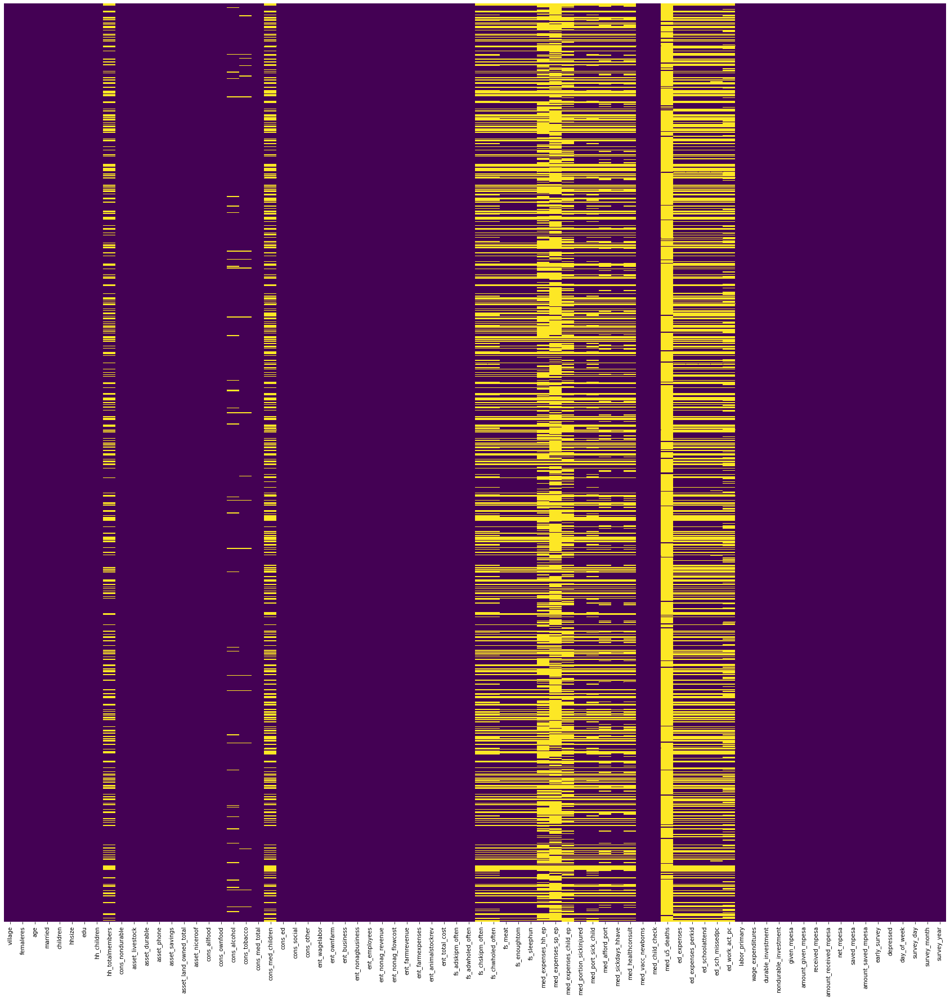

In [ ]:
#@title
# Use sns heatmap to check for missing values
plt.figure(figsize = (30,30))

sns.heatmap(train.isnull(),cbar=False,yticklabels=False,cmap = 'viridis')

A number of features have missing values. Some features such as cons_tobacco and cons_alcohol have less than 5% of missing values, while other features such as med_u5_deaths have more than 90% of missing values. Depending on the percentage of missing values, different strategies will be required for specific features.

### Correlation analysis for features with missing values

Determine whether these features have any significant correlation with each other or the target variable

In [ ]:
#@title
train[features_with_na].apply(lambda x: x.corr(train['depressed'], method="pearson"))

hh_totalmembers            0.069460
cons_alcohol               0.043226
cons_tobacco               0.007829
cons_med_children          0.026768
fs_chskipm_often           0.048661
fs_chwholed_often          0.099581
fs_meat                    0.024562
fs_enoughtom              -0.008538
fs_sleephun                0.042222
med_expenses_hh_ep         0.039251
med_expenses_sp_ep         0.135494
med_expenses_child_ep      0.018366
med_portion_sickinjured    0.071078
med_port_sick_child        0.004345
med_afford_port            0.008411
med_sickdays_hhave         0.055150
med_healthconsult          0.048544
med_u5_deaths             -0.158007
ed_expenses                0.025630
ed_expenses_perkid         0.064281
ed_schoolattend            0.056387
ed_sch_missedpc            0.024739
ed_work_act_pc            -0.056744
dtype: float64

Since the target feature is categorical while the independent features are continuous, pearson correlation is used. None of the features with missing values have a high correlation with the target feature.

This is the expected outcome given the percentage of missing data points.

## Temporal features

In [ ]:
#@title
temporal_features = [feature for feature in train if 'day' in feature or 'month' in feature or 'year' in feature or 'week' in feature]

temporal_features

['med_sickdays_hhave',
 'day_of_week',
 'survey_day',
 'survey_month',
 'survey_year']

In [ ]:
#@title
temporal_features.remove('med_sickdays_hhave')

med_sickdays_hhave is not a temporal feature, so we can remove it

In [ ]:
#@title
train[temporal_features].head()

,day_of_week,survey_day,survey_month,survey_year
0,5,23,11,1961
1,3,24,10,1961
2,5,5,10,1961
3,0,23,9,1961
4,3,12,9,1961


### Check pattern of each temporal feature through histogram

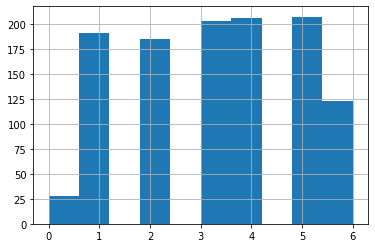

In [ ]:
#@title
train['day_of_week'].hist()

Most of the interviews are conducted on weekdays, with few conducted on Sunday (0 = Sunday). This could be because most of the interviewers do not work on Sunday.

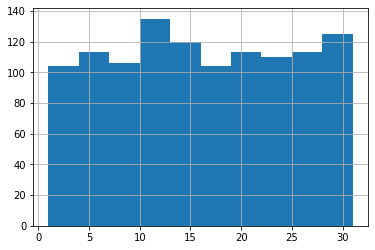

In [ ]:
#@title
train['survey_day'].hist()

The interviews are spread evenly across each day of the month. Although this may seem to contradict the conclusion for day_of_weak feature as Sundays should have less surveys hence the distribution should not be as even. However, Sunday for each month falls on a different date, which is why the distribution can still be consistent across different days of different months

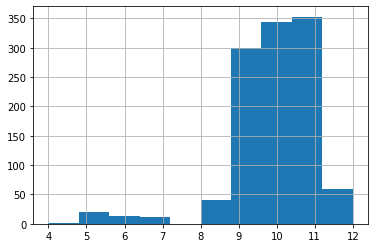

In [ ]:
#@title
train['survey_month'].hist()

Majority of the interviews are conducted in the second half of the year.

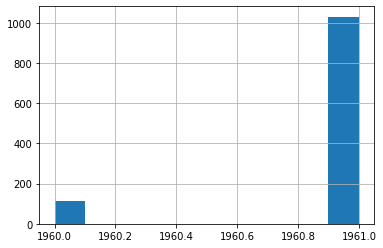

In [ ]:
#@title
train['survey_year'].hist()

Majority of the interviews are conducted in 1961

### Check each temporal feature against target variable

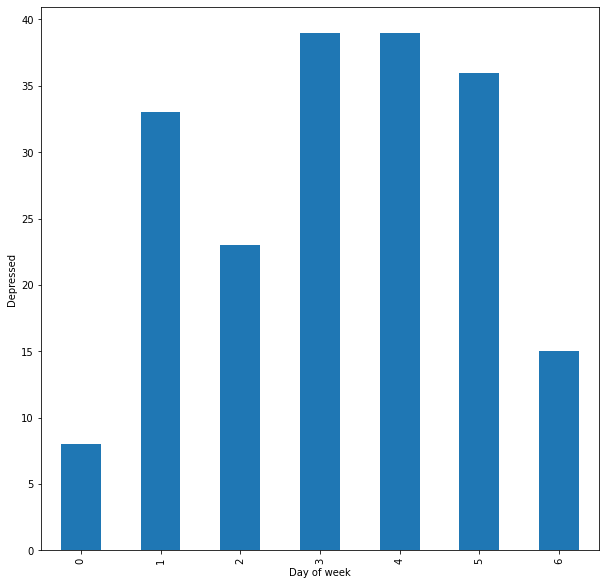

In [ ]:
#@title
day_week_group = train.groupby(['day_of_week'])['depressed'].sum()

day_week_group.plot(kind='bar', ylabel='Depressed',
         xlabel='Day of week', figsize=(10,10))

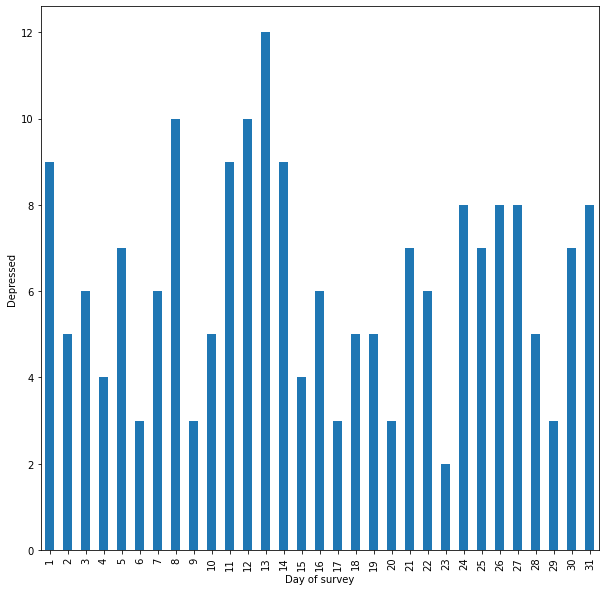

In [ ]:
#@title
# group number of positive depressed cases against day of survey

day_group = train.groupby(['survey_day'])['depressed'].sum()

day_group.plot(kind='bar', ylabel='Depressed',
         xlabel='Day of survey', figsize=(10,10))

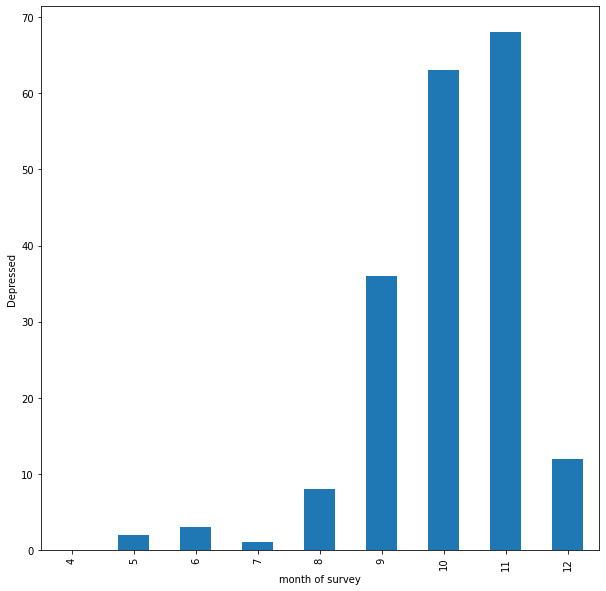

In [ ]:
#@title
month_group = train.groupby(['survey_month'])['depressed'].sum()

month_group.plot(kind='bar', ylabel='Depressed',
         xlabel='month of survey', figsize=(10,10))

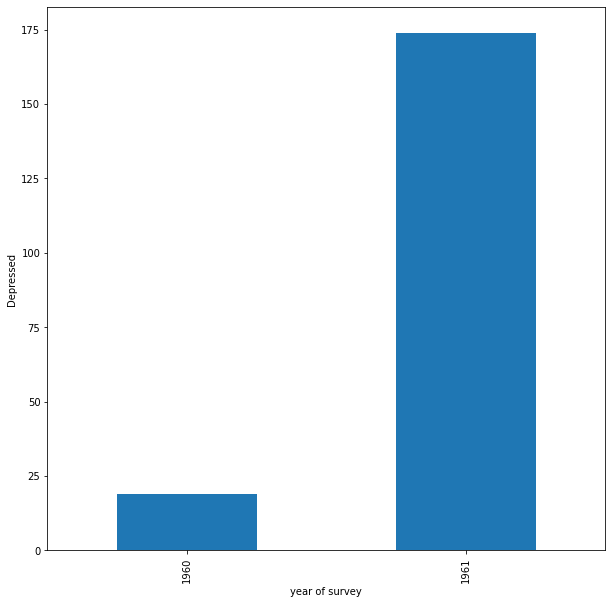

In [ ]:
#@title
year_group = train.groupby(['survey_year'])['depressed'].sum()

year_group.plot(kind='bar', ylabel='Depressed',
         xlabel='year of survey', figsize=(10,10))

Based on the analysis, there is no pattern observed between the temporal features and the target variable. The number of depressed counts vs each temporal feature matches the histogram of each temporal feature. Hence the fact that certain day of week, day, month or year have higher depressed counts than the rest could simply be due to the fact that more interviews are conducted on those time. 

## Discrete numerical features

In [ ]:
#@title
# Consider a feature is discrete feature if there are less than 25 unique values, excluding DV
discrete_features = [feature for feature in train if (len(train[feature].unique()) < 25 and feature not in ['depressed'] + temporal_features) or feature in ['village', 'age']]

print("Discrete Variables Count: {}".format(len(discrete_features)))

Discrete Variables Count: 36


In [ ]:
#@title
train[discrete_features].head()

,village,femaleres,age,married,children,hhsize,edu,hh_children,hh_totalmembers,asset_niceroof,ent_wagelabor,ent_ownfarm,ent_business,ent_nonagbusiness,ent_employees,fs_adskipm_often,fs_adwholed_often,fs_chskipm_often,fs_chwholed_often,fs_meat,fs_enoughtom,fs_sleephun,med_port_sick_child,med_afford_port,med_healthconsult,med_vacc_newborns,med_child_check,med_u5_deaths,ed_schoolattend,labor_primary,wage_expenditures,given_mpesa,amount_given_mpesa,received_mpesa,saved_mpesa,early_survey
0,91,1,28.0,1,4,6,10,0,NaN,0,0,0,0,0,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,0,0,0,0.0,0,1,0
1,57,1,23.0,1,3,5,8,0,NaN,0,0,0,0,0,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,0,0,0,0.0,1,0,0
2,115,1,22.0,1,3,5,9,0,NaN,0,0,0,0,0,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,0,0,0,0.0,0,1,0
3,97,1,27.0,1,2,4,10,2,4.0,0,0,1,0,1,0,0.0,0.0,0.0,0.0,3.0,1.0,1.0,0.00,NaN,NaN,1,1,NaN,0.50,0,0,0,0.0,0,1,0
4,42,0,59.0,0,4,6,10,4,6.0,0,1,0,0,0,0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.25,0.5,1.0,1,1,NaN,0.75,1,0,0,0.0,0,0,0


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open

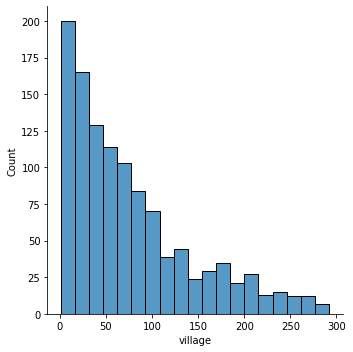

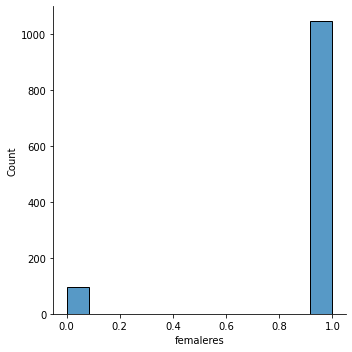

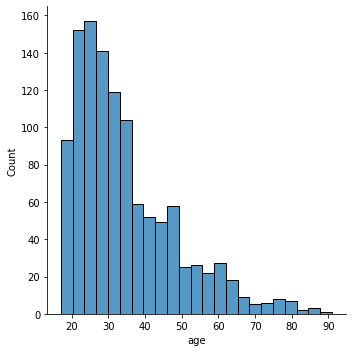

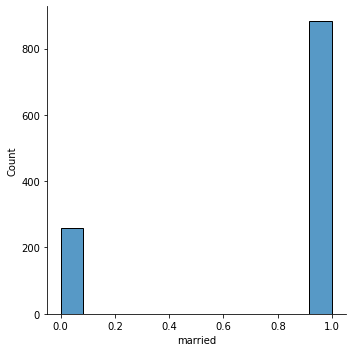

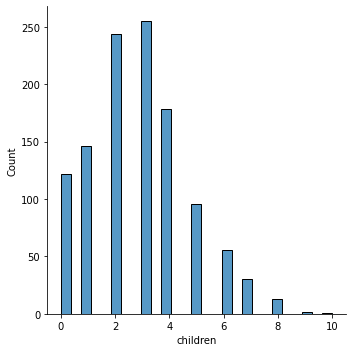

...

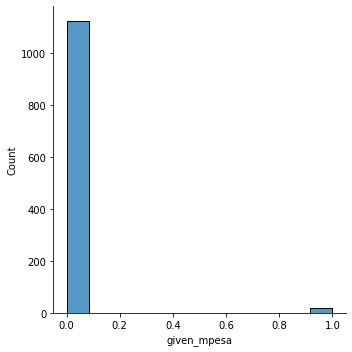

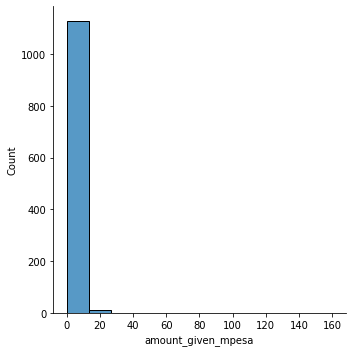

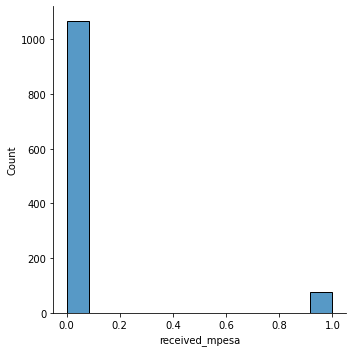

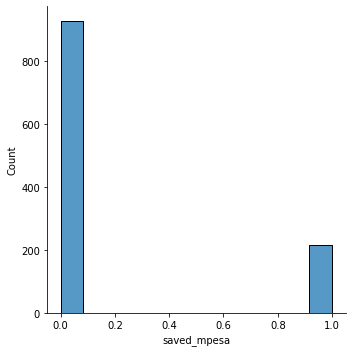

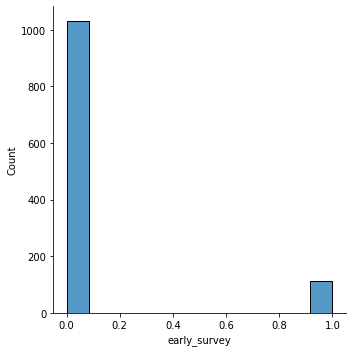

In [ ]:
#@title
# Plot bar graph for discrete numerical features?
for feature in discrete_features:
  sns.displot(train[feature])

Based on the graphs,

- children, hhsize, hh_children, hh_totalmembers, ent_wagelabour, ent_ownfarm, ent_business, ent_nonagbusiness, ent_employees, fs_adskipm_often, fs_adwholed_often, fs_chwholed_often, fs_meat, fs_enoughtom, fs_sleephun, med_u5_deaths, labour_primary, given_mpesa, amount_given_mpesa, received_mpesa, saved_mpesa, early_survey are positively skewed

- femaleres, married, med_afford_port, med_healthconsult, ed_schoolattend are negatively skewed

- edu is evenly distributed



Some additional results obtained:
- for all the observations, med_vacc_newborns and med_child_check have the same data (1.0). For both of these features, there are no missing data. 

- for wage_expenditures feature, most of the observations (1141 out of 1143) have a value of 0, while the last 2 have values of 840 and 27000, and can be considered outliers.

- for asset_niceroof feature, most of the observations (1142 out of 1143 features) have a value of 0 while the last one has a value of 1.

## Continuous numerical features

In [ ]:
#@title
continuous_features = [feature for feature in train if feature not in discrete_features + ['depressed'] + temporal_features]

print("Continuous feature Count {}".format(len(continuous_features)))

Continuous feature Count 35


In [ ]:
#@title
train[continuous_features].head()

,cons_nondurable,asset_livestock,asset_durable,asset_phone,asset_savings,asset_land_owned_total,cons_allfood,cons_ownfood,cons_alcohol,cons_tobacco,cons_med_total,cons_med_children,cons_ed,cons_social,cons_other,ent_nonag_revenue,ent_nonag_flowcost,ent_farmrevenue,ent_farmexpenses,ent_animalstockrev,ent_total_cost,med_expenses_hh_ep,med_expenses_sp_ep,med_expenses_child_ep,med_portion_sickinjured,med_sickdays_hhave,ed_expenses,ed_expenses_perkid,ed_sch_missedpc,ed_work_act_pc,durable_investment,nondurable_investment,amount_received_mpesa,net_mpesa,amount_saved_mpesa
0,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000,0.000000,0.000000,0.000000,0.000000
1,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000,0.000000,4.804611,4.804611,0.000000
2,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0.00000,0.000000,0.0,0.0,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.00000,0.000000,8.007685,8.007685,0.000000
3,378.83292,526.671080,196.98904,24.023054,49.647648,0.0,289.17352,36.434967,0.0,0.0,4.163996,0.960922,1.681614,39.771500,44.042267,32.030739,0.0,22.288055,1.875133,16.282293,17.890503,NaN,NaN,NaN,0.000000,0.000000,20.179367,10.089684,1.50,0.00,778.11230,69.219765,0.000000,0.000000,1.249199
4,258.67188,8.260629,173.52654,19.218445,0.000000,0.5,173.01099,0.870168,0.0,0.0,0.800768,0.800768,2.268844,8.087762,74.503502,0.000000,0.0,0.533846,2.073101,0.000000,2.073101,NaN,NaN,1.233183,0.333333,1.166667,27.226130,6.806532,1.75,1.25,201.00562,4.341945,0.000000,0.000000,0.000000


More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open

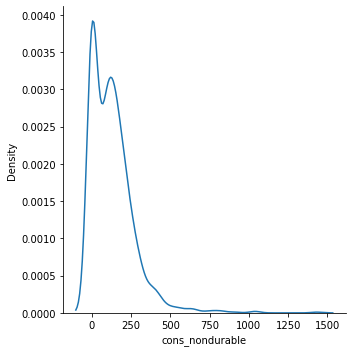

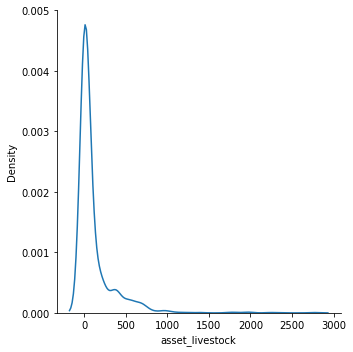

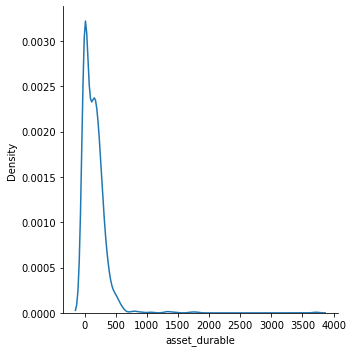

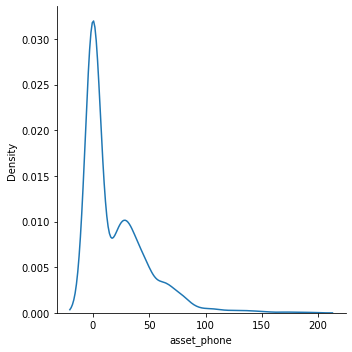

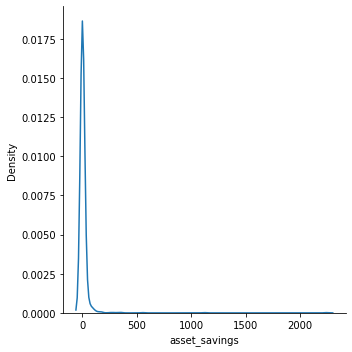

...

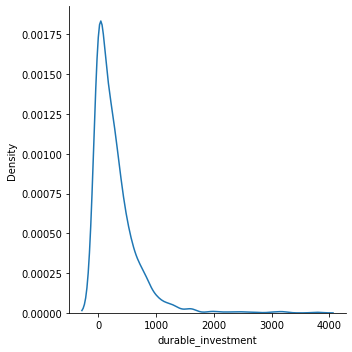

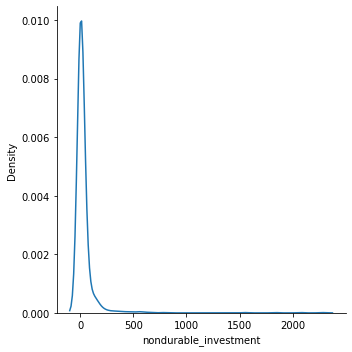

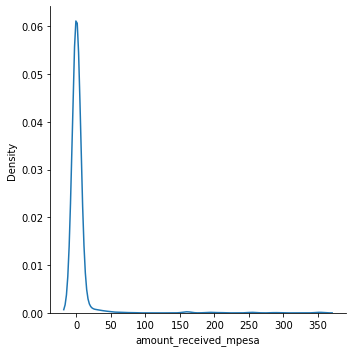

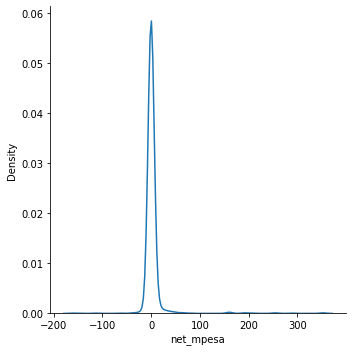

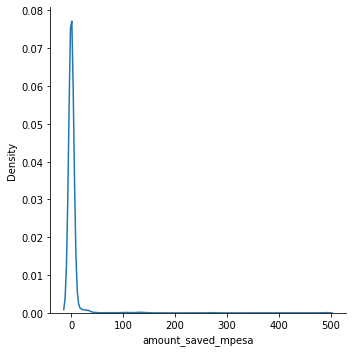

In [ ]:
#@title
# plot distribution graph for each continuous feature
for feature in continuous_features:
  sns.displot(train[feature], kind="kde")

Based on the graphs, all of the features are positively skewed. 

## Outliers

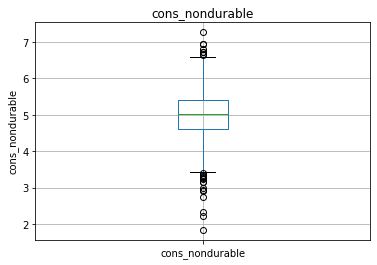

cons_nondurable
number of outliers: 23


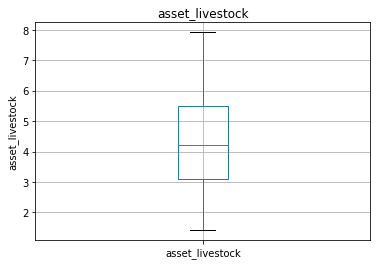

asset_livestock
number of outliers: 0


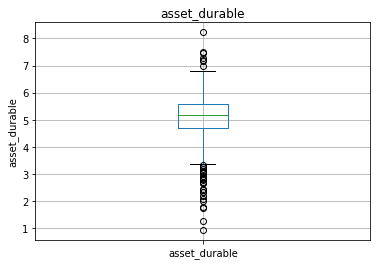

asset_durable
number of outliers: 33


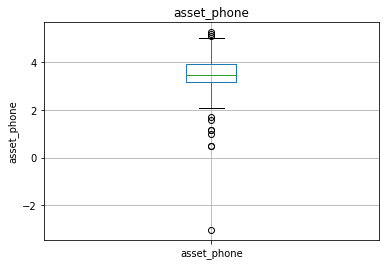

asset_phone
number of outliers: 11


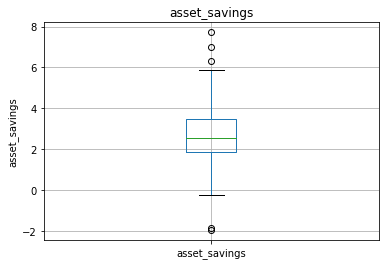

asset_savings
number of outliers: 5


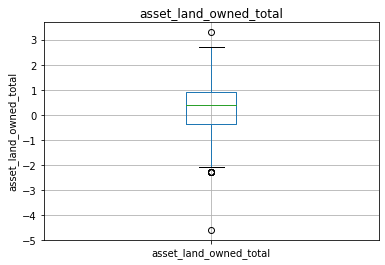

asset_land_owned_total
number of outliers: 8


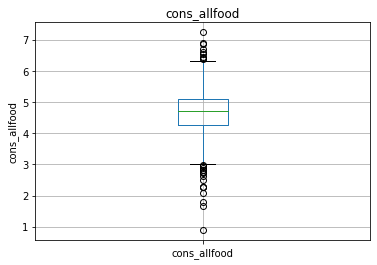

cons_allfood
number of outliers: 26


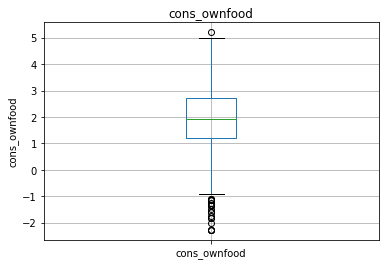

cons_ownfood
number of outliers: 26


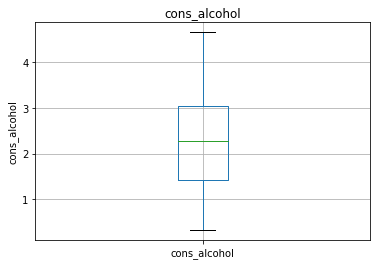

cons_alcohol
number of outliers: 0


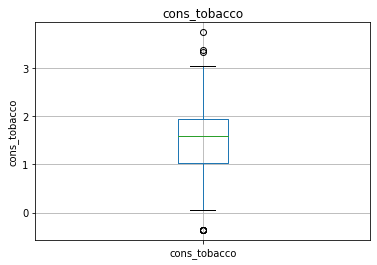

cons_tobacco
number of outliers: 9


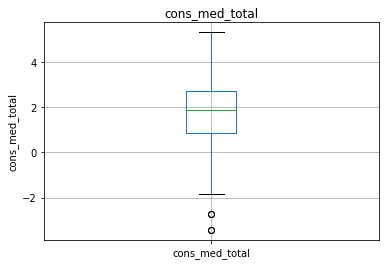

cons_med_total
number of outliers: 4


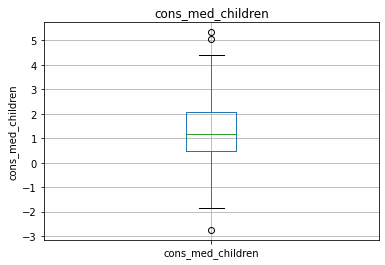

cons_med_children
number of outliers: 3


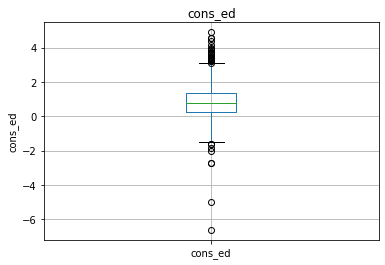

cons_ed
number of outliers: 33


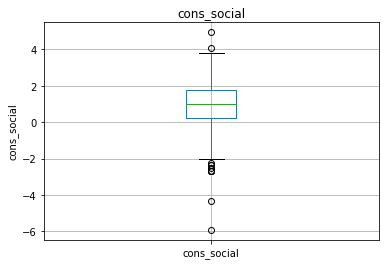

cons_social
number of outliers: 12


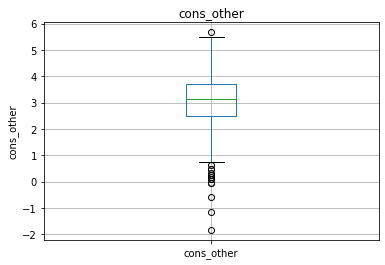

cons_other
number of outliers: 15


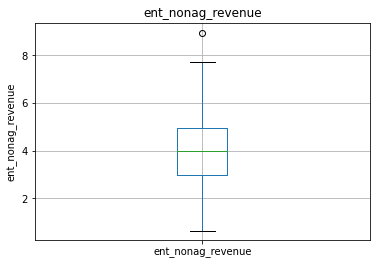

ent_nonag_revenue
number of outliers: 1


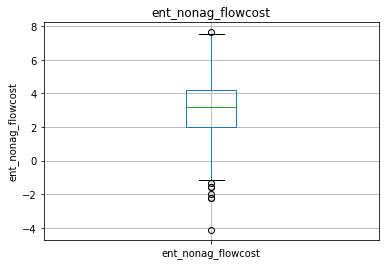

ent_nonag_flowcost
number of outliers: 8


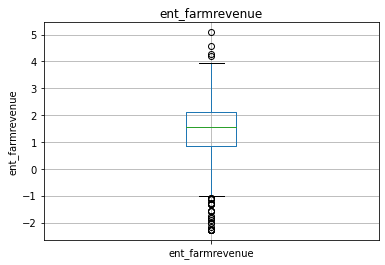

ent_farmrevenue
number of outliers: 34


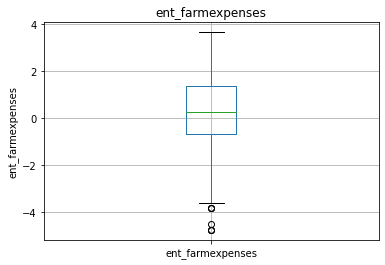

ent_farmexpenses
number of outliers: 7


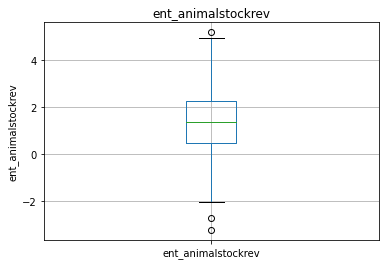

ent_animalstockrev
number of outliers: 3


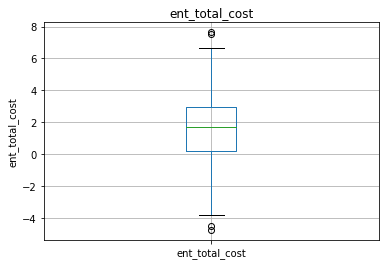

ent_total_cost
number of outliers: 4


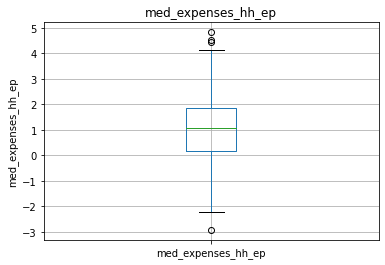

med_expenses_hh_ep
number of outliers: 4


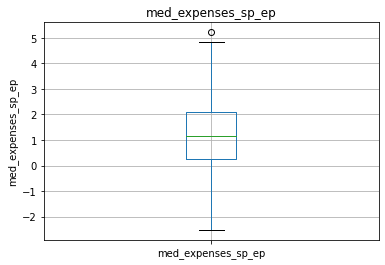

med_expenses_sp_ep
number of outliers: 1


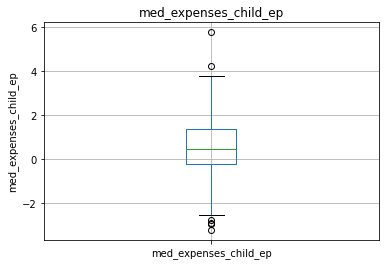

med_expenses_child_ep
number of outliers: 6


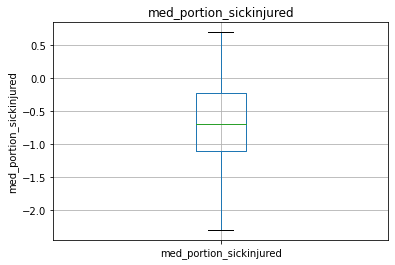

med_portion_sickinjured
number of outliers: 0


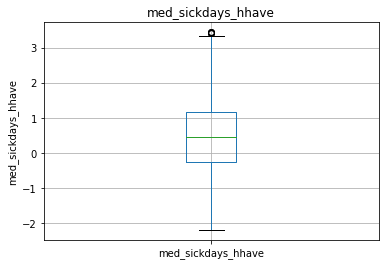

med_sickdays_hhave
number of outliers: 5


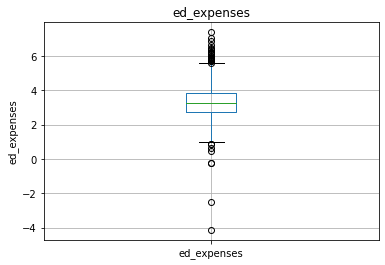

ed_expenses
number of outliers: 31


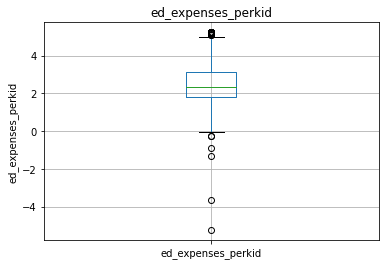

ed_expenses_perkid
number of outliers: 21


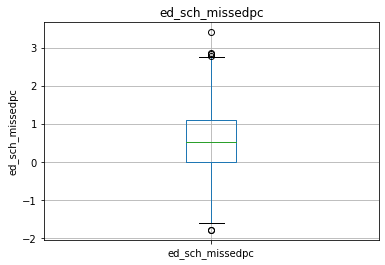

ed_sch_missedpc
number of outliers: 6


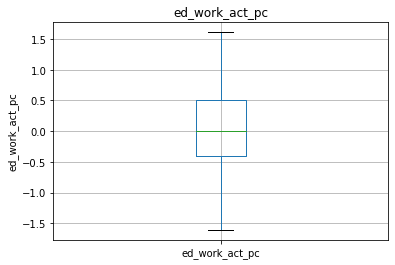

ed_work_act_pc
number of outliers: 0


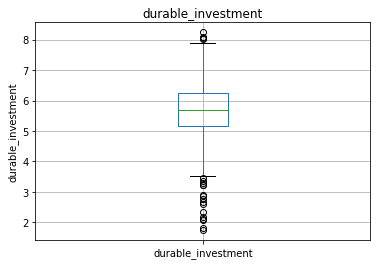

durable_investment
number of outliers: 20


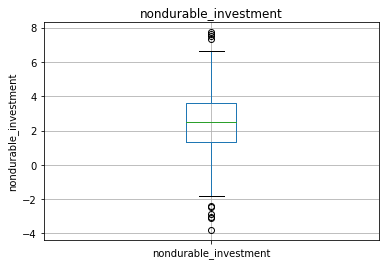

nondurable_investment
number of outliers: 10


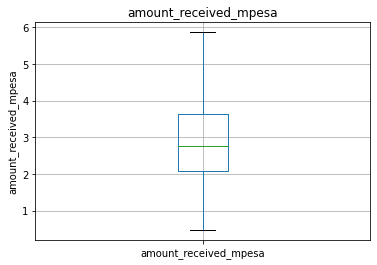

amount_received_mpesa
number of outliers: 0


invalid value encountered in log


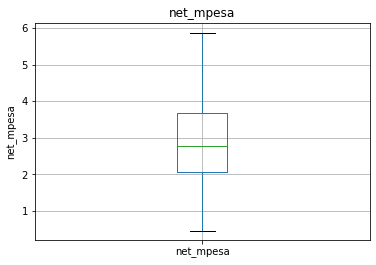

net_mpesa
number of outliers: 0


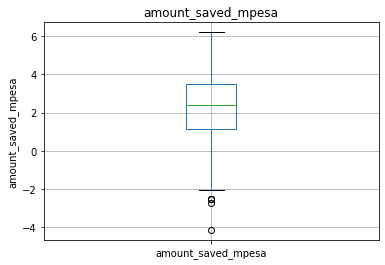

amount_saved_mpesa
number of outliers: 5


In [ ]:
#@title
for feature in continuous_features:
    data=train.copy()
    data = data.mask(data == 0)
    data[feature]=np.log(data[feature])
    data.boxplot(column=feature)
    plt.ylabel(feature)
    plt.title(feature)
    plt.show()
    count = 0
    print(feature)
    q1 = data[feature].quantile(0.25)
    q3 = data[feature].quantile(0.75)
    iqr = q3 - q1
    Lower_tail = q1 - 1.5 * iqr
    Upper_tail = q3 + 1.5 * iqr
    for i in data[feature]:
      if i > Upper_tail or i < Lower_tail:
        count += 1
    print('number of outliers:', count)

29 of the continuous variables contain outliers. They are: cons_nondurable, asset_durable, asset_phone, asset_savings, asset_land_owned_total, cons_allfood, cons_ownfood, cons_tobacco, cons_med_total, cons_med_children, cons_ed, cons_social, cons_other, ent_nonag_revenue, ent_nonag_flowcost, ent_farmrevenue, ent_farmexpenses, ent_animalstockrev, ent_total_cost, med_expenses_hh_ep, med_expenses_sp_ep, med_expenses_child_ep, med_sickdays_hhave, ed_expenses, ed_expenses_perkid, ed_sch_missedpc, durable_investment, nondurable_investment, amount_saved_mpesa.

Outliers increases the error and can cause bias and/or influence estimates. As such, we should handle the outliers during data processing

## Categorical variables

In [ ]:
#@title
categorical_features = [feature for feature in train.columns if train[feature].dtypes=='O']

categorical_features

[]

This dataset does not contain any categorical features.

## Correlation analysis



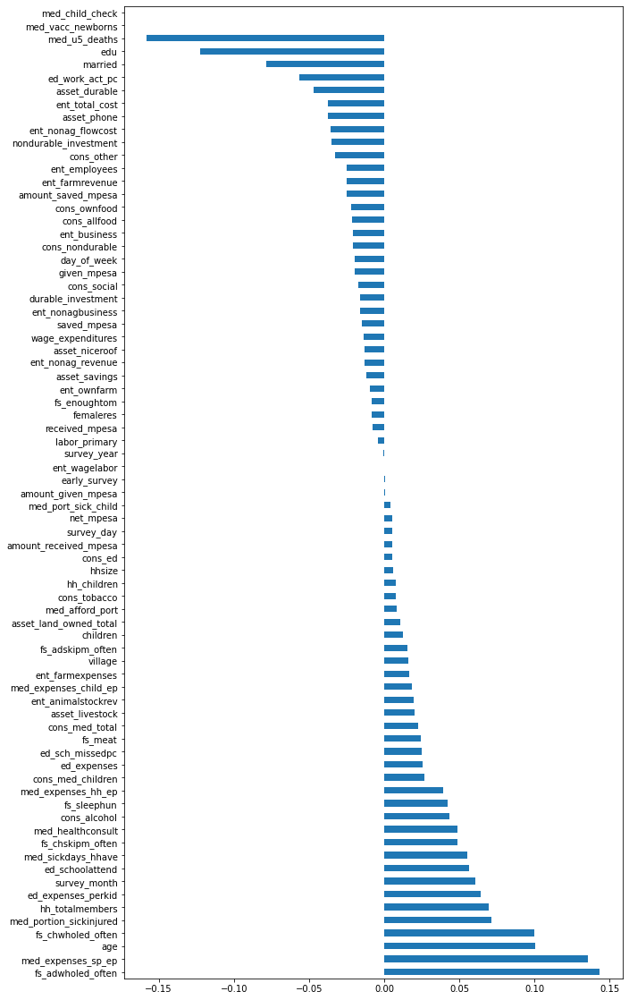

In [ ]:
#@title
plt.figure(figsize=(10, 20))

train.corr().depressed.drop('depressed').sort_values(ascending=False).plot.barh()

Generally, none of the features have strong correlation with the target feature.



<Figure size 1152x1152 with 0 Axes>

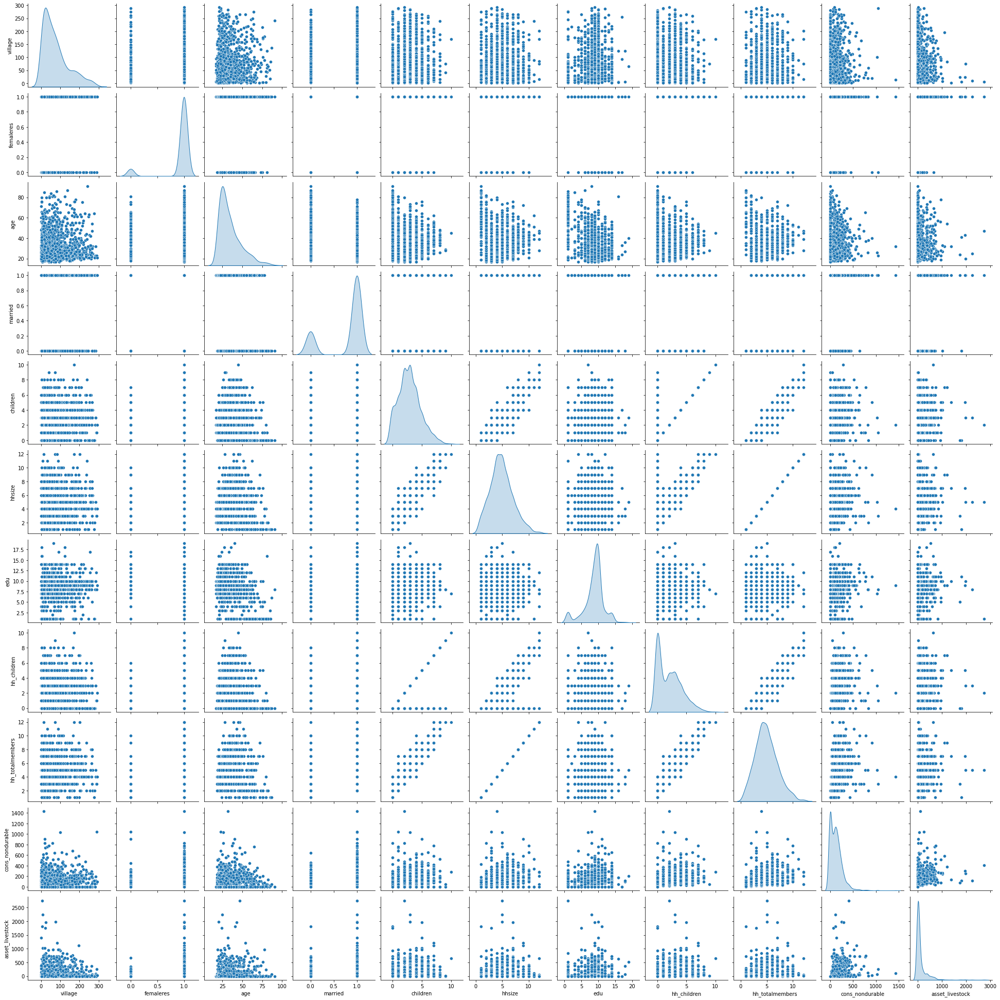

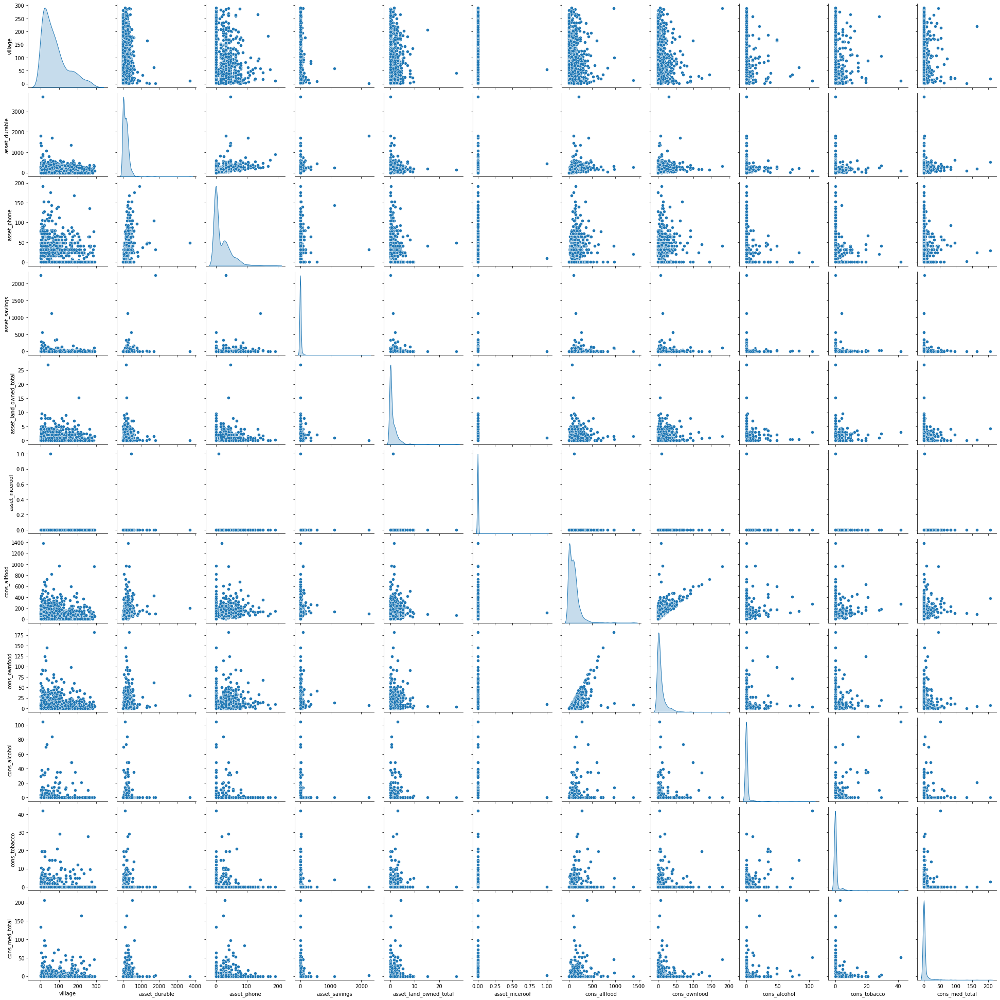

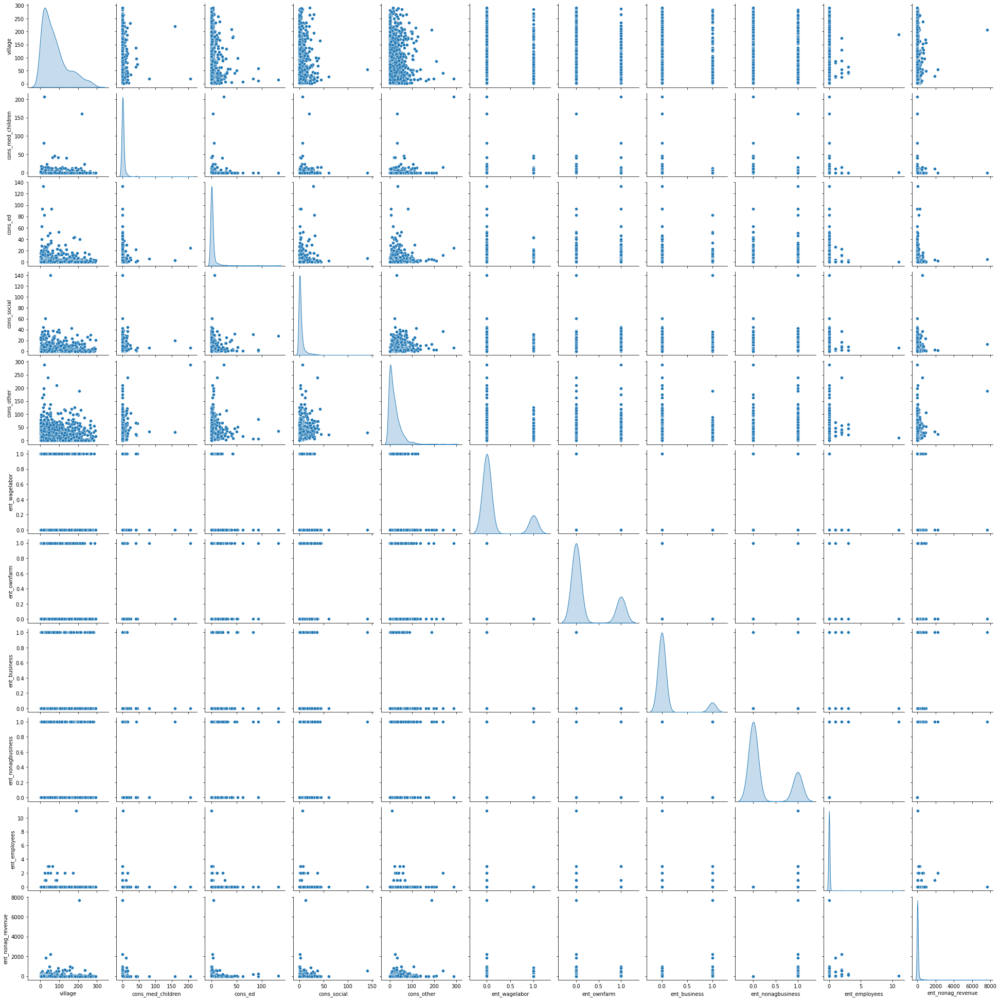

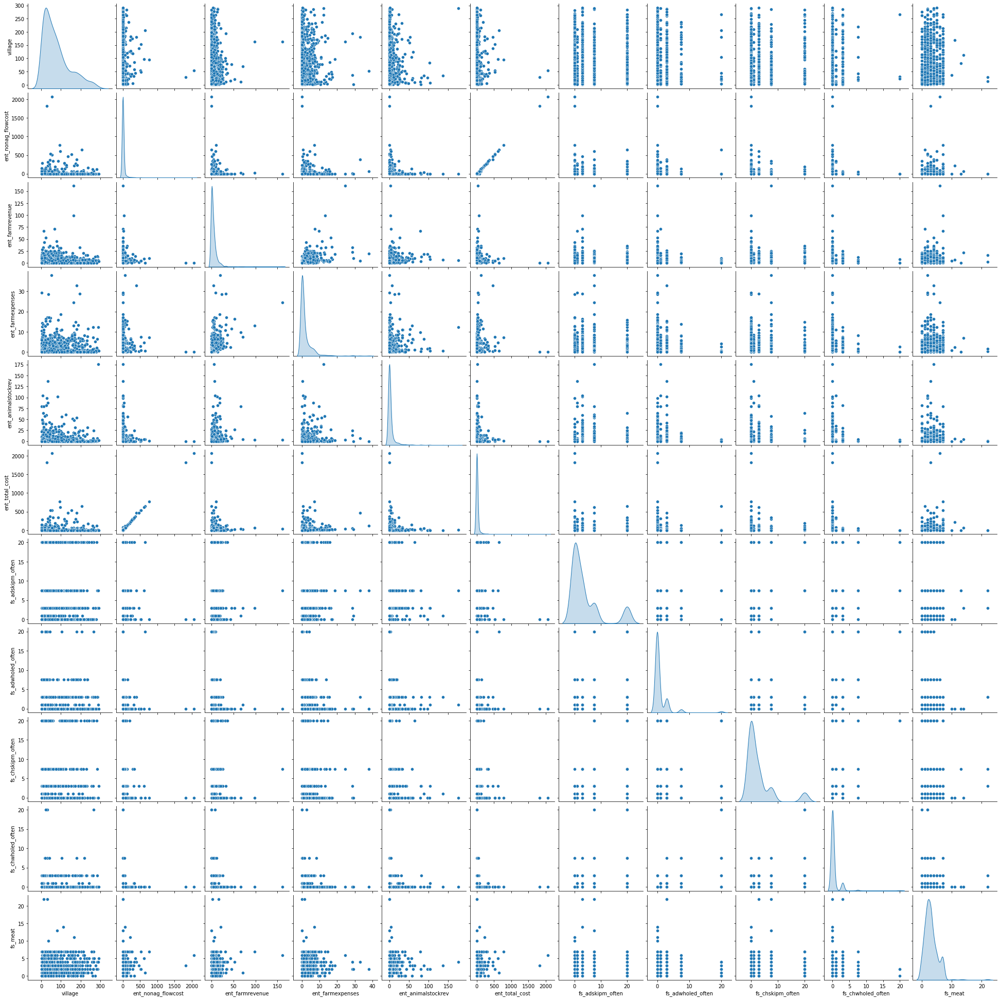

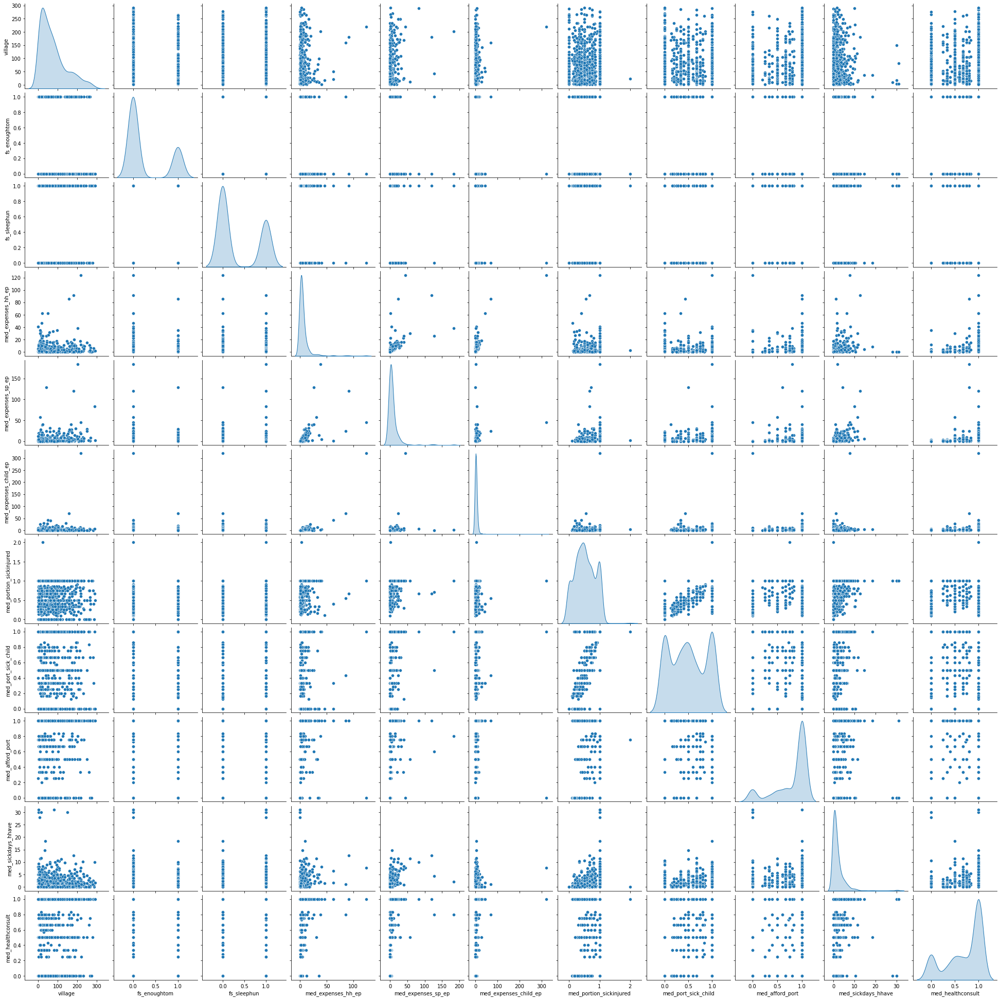

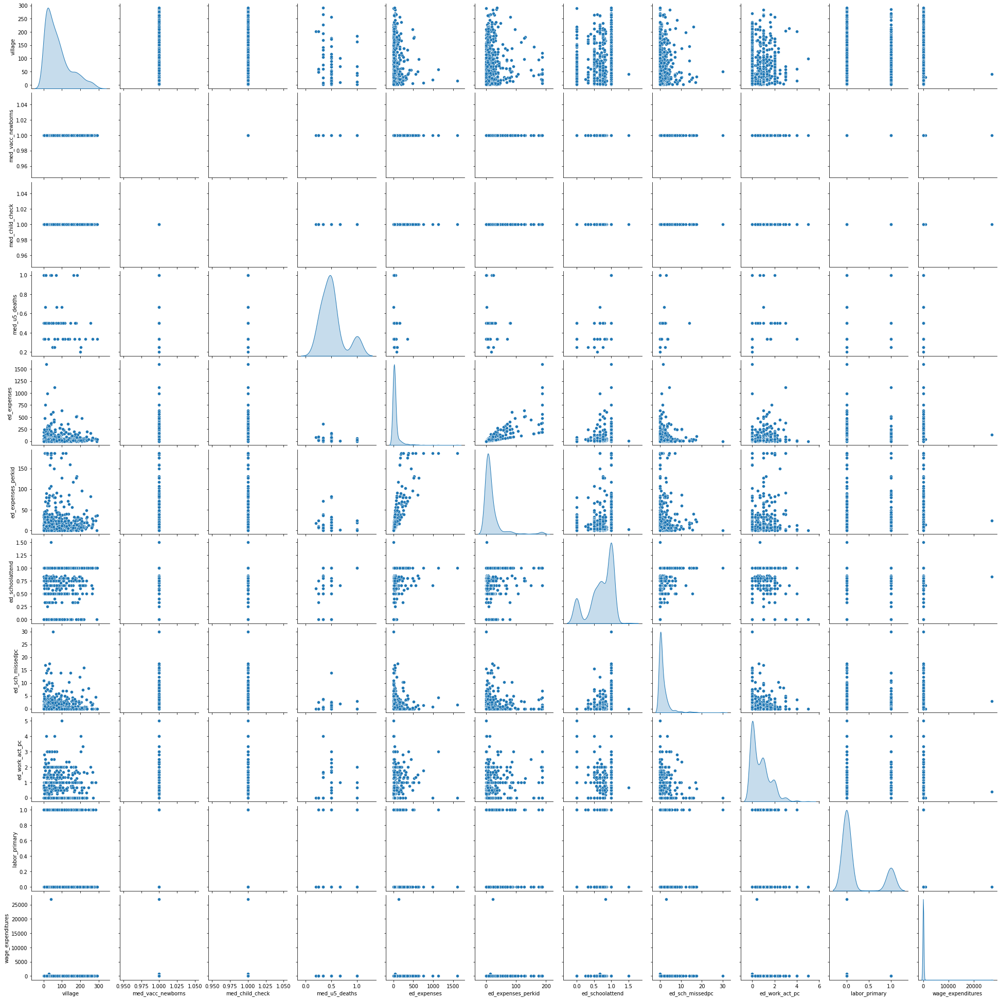

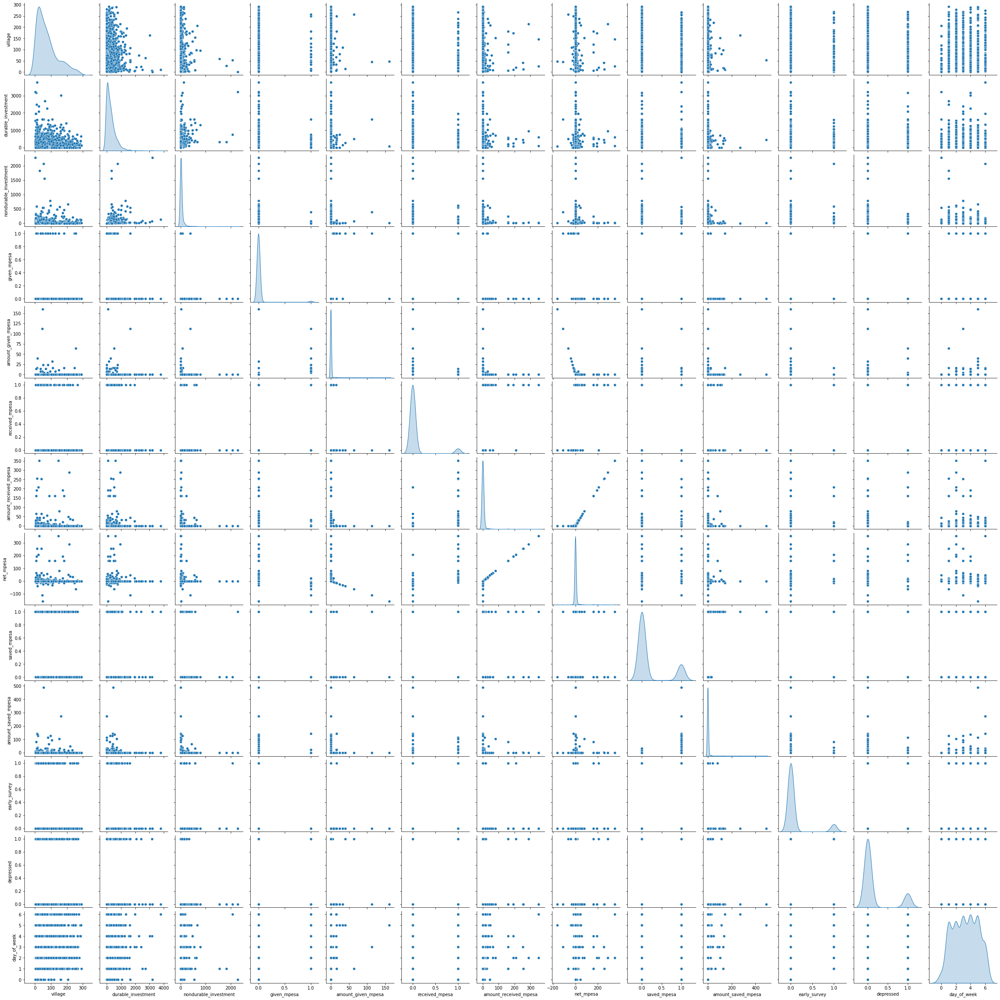

In [ ]:
#@title

plt.figure(figsize=(16,16));
sns.pairplot(train.iloc[:,np.hstack(([0],range(1,11)))],diag_kind='kde',palette='Set1');
sns.pairplot(train.iloc[:,np.hstack(([0],range(11,21)))],diag_kind='kde',palette='Set1');
sns.pairplot(train.iloc[:,np.hstack(([0],range(21,31)))],diag_kind='kde',palette='Set1');
sns.pairplot(train.iloc[:,np.hstack(([0],range(31,41)))],diag_kind='kde',palette='Set1');
sns.pairplot(train.iloc[:,np.hstack(([0],range(41,51)))],diag_kind='kde',palette='Set1');
sns.pairplot(train.iloc[:,np.hstack(([0],range(51,61)))],diag_kind='kde',palette='Set1');
sns.pairplot(train.iloc[:,np.hstack(([0],range(61,73)))],diag_kind='kde',palette='Set1');

From the preliminary analysis, there is a strong correlation between some of the features.

For example, hhsize and hh_totalmembers appear to have a strong correlation because there is a linear relationship. Another example is the ent_wagelabor and labor_primary graph.

,village,femaleres,age,married,children,hhsize,edu,hh_children,hh_totalmembers,cons_nondurable,asset_livestock,asset_durable,asset_phone,asset_savings,asset_land_owned_total,asset_niceroof,cons_allfood,cons_ownfood,cons_alcohol,cons_tobacco,cons_med_total,cons_med_children,cons_ed,cons_social,cons_other,ent_wagelabor,ent_ownfarm,ent_business,ent_nonagbusiness,ent_employees,ent_nonag_revenue,ent_nonag_flowcost,ent_farmrevenue,ent_farmexpenses,ent_animalstockrev,ent_total_cost,fs_adskipm_often,fs_adwholed_often,fs_chskipm_often,fs_chwholed_often,fs_meat,fs_enoughtom,fs_sleephun,med_expenses_hh_ep,med_expenses_sp_ep,med_expenses_child_ep,med_portion_sickinjured,med_port_sick_child,med_afford_port,med_sickdays_hhave,med_healthconsult,med_vacc_newborns,med_child_check,med_u5_deaths,ed_expenses,ed_expenses_perkid,ed_schoolattend,ed_sch_missedpc,ed_work_act_pc,labor_primary,wage_expenditures,durable_investment,nondurable_investment,given_mpesa,amount_given_mpesa,received_mpesa,amount_received_mpesa,net_mpesa,saved_mpesa,amount_saved_mpesa,early_survey,depressed,day_of_week,survey_day,survey_month,survey_year
village,1.000000,-0.008408,0.001868,0.022867,0.039394,0.034232,-0.009572,-0.041124,0.027366,-0.031669,-0.050219,-0.054560,-0.067570,-0.046493,-0.009431,-0.009933,-0.041462,-0.014526,-0.025399,0.006415,0.040353,0.034579,-0.037069,-0.007843,0.012139,-0.002801,-0.121024,-0.010630,-0.037663,0.032475,0.051357,0.012112,-0.016747,0.042311,0.001256,0.014106,0.012395,-0.006142,0.107393,0.060516,0.079872,-0.027095,-0.050861,0.083985,0.204137,0.115641,0.058448,-0.001026,0.030334,0.015346,-0.002229,NaN,NaN,-0.231295,-0.007371,0.019127,0.037320,-0.010500,-0.012941,-0.022936,-0.016342,-0.063352,-0.019314,0.027330,0.006922,-0.039510,0.008756,0.006716,0.063153,0.001042,-0.069818,0.015881,-0.028304,0.022165,0.312741,0.069818
femaleres,-0.008408,1.000000,-0.137133,0.275119,0.224375,0.256443,-0.075308,0.197696,0.257334,0.075143,0.098825,0.080056,0.146438,0.004836,-0.011430,0.008909,0.077114,0.053062,-0.036424,-0.017309,-0.104665,-0.247580,0.045501,0.068426,0.083794,-0.026831,0.077257,0.084098,0.097141,0.024851,0.037984,0.046245,0.038787,0.054697,-0.009101,0.051203,-0.026612,-0.025686,-0.029205,0.014885,-0.025927,0.048226,-0.051339,-0.096915,-0.120128,-0.240522,-0.019778,0.049900,0.030189,-0.050969,0.003771,NaN,NaN,0.079676,-0.001703,-0.065245,0.020551,-0.014369,-0.143568,-0.015054,0.009182,0.109791,0.044431,0.012628,0.018648,-0.034134,-0.034100,-0.037609,0.007713,-0.008594,0.003292,-0.008112,0.003938,-0.001679,-0.051520,-0.003292
age,0.001868,-0.137133,1.000000,-0.400452,-0.111424,-0.068531,-0.393277,-0.070510,-0.047794,-0.028535,0.059959,-0.089134,-0.182611,-0.013263,0.255802,-0.007620,-0.024760,0.001672,0.017133,0.063398,0.016852,0.074042,0.136876,-0.033437,-0.090097,-0.069262,0.121044,-0.014610,-0.079885,-0.021629,-0.018880,-0.022457,-0.004174,-0.011996,0.005912,-0.021126,0.069274,0.175732,0.134216,0.176515,-0.057786,-0.069473,0.173012,-0.041924,-0.035655,0.030921,0.022976,-0.056751,-0.150296,0.188521,-0.165621,NaN,NaN,-0.219646,0.236062,0.281209,0.351955,0.016688,0.296957,-0.071606,0.005267,-0.008344,-0.015366,-0.026741,-0.025685,0.046239,0.016848,0.022718,-0.095900,-0.018136,-0.063066,0.100159,0.028122,-0.033861,0.024129,0.063066
married,0.022867,0.275119,-0.400452,1.000000,0.220000,0.322867,0.197570,0.152999,0.295652,0.152086,0.087219,0.130177,0.183254,0.030777,-0.059359,-0.054533,0.135823,0.098973,0.065428,0.057169,0.080820,0.046998,0.031813,0.064763,0.122417,0.029219,0.025988,-0.040550,0.056735,0.012859,-0.051447,-0.051998,0.051820,0.085054,0.091809,-0.043534,-0.058782,-0.116943,-0.136237,-0.060233,0.064554,0.057248,-0.128141,0.074000,-0.004465,0.031849,-0.031734,-0.030182,0.113584,-0.124841,0.070290,NaN,NaN,0.063747,-0.005090,-0.070316,-0.162185,-0.077342,-0.162426,0.017848,0.016549,0.132931,-0.012625,0.051875,0.041664,-0.022720,0.007061,-0.003645,0.070017,0.034929,0.003347,-0.078541,-0.057146,0.041876,-0.027315,-0.003347
children,0.039394

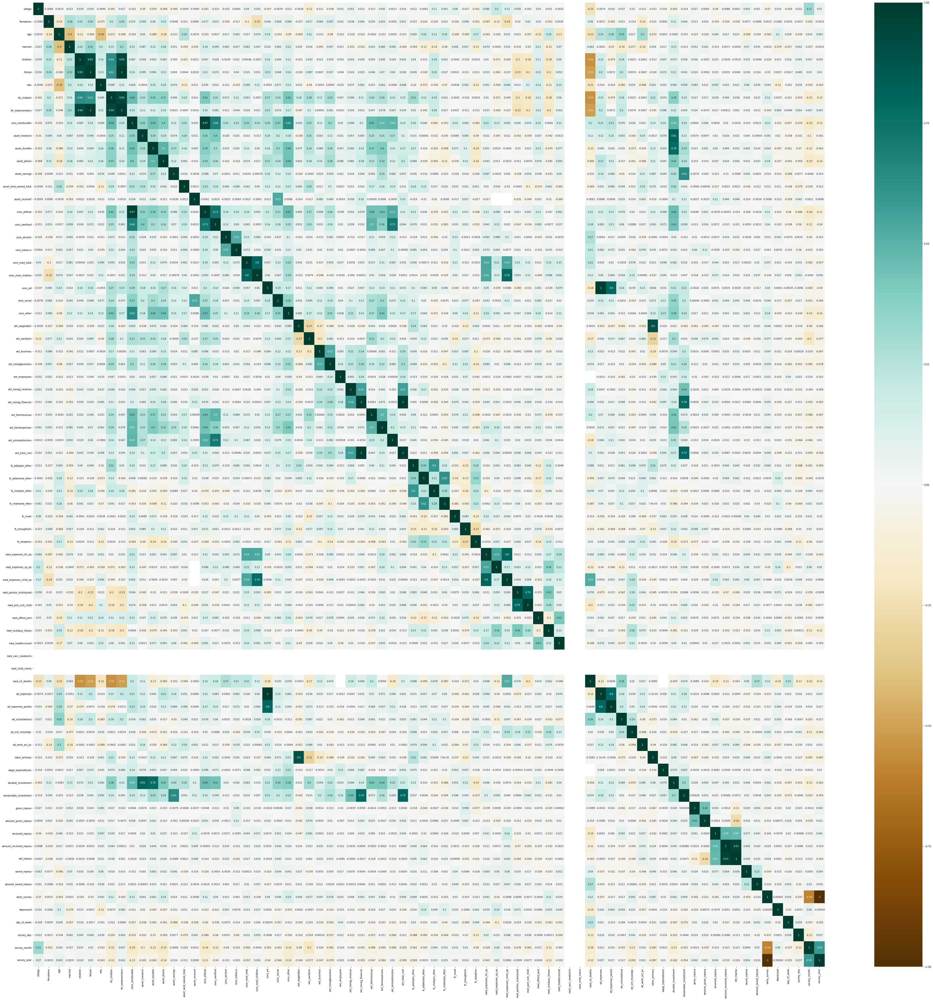

In [ ]:
#@title
# Heat Maps is a type of plot which is necessary when we need to find the dependent variables. 
# One of the best way to find the relationship between the features can be done using heat maps. 
plt.figure(figsize = (74,74))
c= train.corr()
sns.heatmap(c,cmap="BrBG",annot=True)
c

The features with strong correlation (correlation >= 0.60) are:
- children with:
  - hh_totalmembers: 0.94
  - hhsize: 0.93
  - hh_children: 0.63
- hhsize with:
  - hh_totalmembers: 1
  - hh_children: 0.62
- hh_children with:
  - hh_totalmembers: 0.94
- cons_nondurable with:
  - cons_allfood: 0.97
  - cons_ownfood: 0.68
  - cons_other: 0.65
- asset_livestock with:
  - durable_investment: 0.81
- asset_durable with:
  - durable_investment: 0.78
- asset_savings with:
  - nondurable_investment: 0.65
- cons_allfood with:
  - cons_ownfood: 0.73
- cons_ownfood with:
  - ent_animalstockrev: 0.72
- cons_med_total with:
  - cons_med_children: 0.8
- cons_med_children with:
  - med_expenses_child_ep: 0.78
- cons_ed with:
  - ed_expenses: 1
  - ed_expenses_perkid: 0.8
- ent_wagelabor with:
  - labor_primary: 0.9
- ent_nonag_flowcost with:
  - ent_total_cost: 1
  - nondurable_investment: 0.78
- ent_total_cost with:
  - nondurable_investment: 0.79
- fsadskipm_often with:
  - fschskipm_often: 0.6
- fsadwholed_often with:
  - fschwholed_often: 0.62
- med_expenses_hh_ep with:
  - med_expenses_child_ep: 0.8
- med_portion_sickinjured with:
  - med_port_sick_child: 0.79
- ed_expenses with:
  - ed_expenses_perkid: 0.8
- amount_received_mpesa with:
  - net_mpesa: 0.97

## Hypothesis testing

In this section, we came up with several hypotheses that we would like to test. This will assit in exploring novel aspects of the dataset and aid in feature engineering.

In [ ]:
#@title
# create a copy of training data to explore
train_copy = train.copy()

### Total asset vs depression

We want to test if an individual has less assets, depression will occur more often. This is done by first summing up all features related to assets.

We have identified the following features related to assets: 
- asset_livestock
- asset_durable
- asset_phone
- asset_savings
- asset_land_owned_total
- ent_nonag_revenue
- ent_farmrevenue
- ent_animalstockrev
- durable_investment
- nondurable_investment
- received_mpesa
- saved_mpesa
- amount_saved_mpesa

In [ ]:
#@title
train_copy["total_asset"] = train["asset_livestock"] + train["asset_durable"] + train["asset_phone"] + train["asset_savings"] + train["asset_land_owned_total"] + train["ent_nonag_revenue"] + train["ent_farmrevenue"] + train["ent_animalstockrev"] + train["durable_investment"] + train["nondurable_investment"] + train["received_mpesa"] + train["saved_mpesa"] + train["amount_saved_mpesa"]

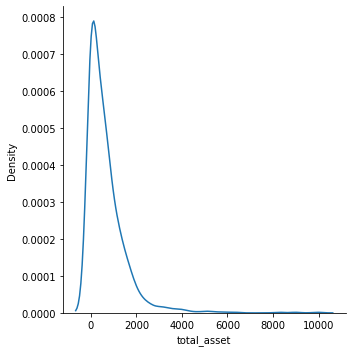

In [ ]:
#@title
sns.displot(train_copy["total_asset"], kind="kde")

The total asset is positively skewed, with majority of the data points having total asset between the 0 and 2000 range. We can plot pearson correlation to see if there is any pattern with target variable.

In [ ]:
#@title
train_copy["total_asset"].corr(train_copy["depressed"], method="pearson")

-0.023412290404330727

There is a weak correlation between depressed and total_asset. However, we note that there is an inverse relationship, which indicates that as total asset increase, depression tend to decreases, although the correlation is weak.

We will explore further by creating a new feature poor, which maps the values in total_asset that fall in the <= 50 percentile as 1 for poor, and the rest as 0 for not poor.

In [ ]:
#@title
train_copy["poor"] = train_copy["total_asset"].apply(lambda x: 1 if x <= train_copy['total_asset'].quantile(0.5) else 0)

Find correlation between poor and depressed

In [ ]:
#@title
train_copy["poor"].corr(train["depressed"])

0.0626612325537023

There is still a weak correlation between wealthy and depressed. We note that the relationship is positive, which is as expected. We can plot a histogram for number of depressed for each poor group.

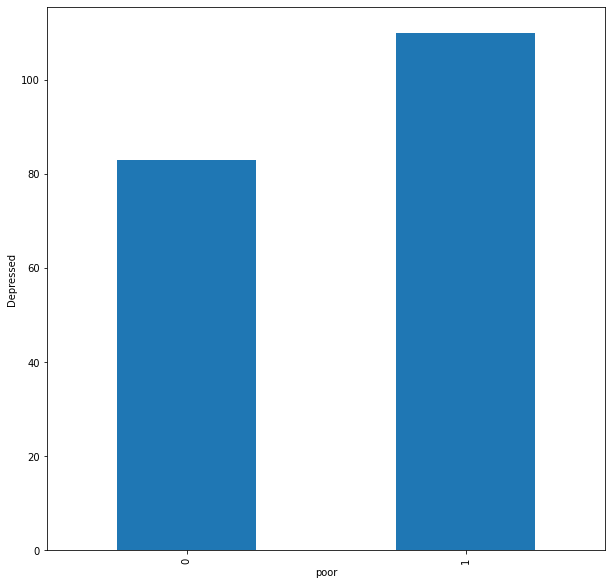

In [ ]:
#@title
poor_group = train_copy.groupby(['poor'])['depressed'].sum()

poor_group.plot(kind='bar', ylabel='Depressed',
         xlabel='poor', figsize=(10,10))

There is no observable pattern as the distribution per class is quite even. We can explore different threshold for classying a respondent as poor, and print the correlation for each threshold.

In [ ]:
#@title
thresholds = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in thresholds:
  temp = train_copy["total_asset"].apply(lambda x: 1 if x <= train_copy['total_asset'].quantile(i) else 0)
  print(f'threshold: {i}, corr: {temp.corr(train["depressed"])}')

threshold: 0.1, corr: 0.04611788449855
threshold: 0.2, corr: 0.04611788449855
threshold: 0.3, corr: 0.04628587880698708
threshold: 0.4, corr: 0.05164939727755064
threshold: 0.5, corr: 0.0626612325537023
threshold: 0.6, corr: 0.07707159516228525
threshold: 0.7, corr: 0.040342989532308464
threshold: 0.8, corr: 0.009729524144040056
threshold: 0.9, corr: -0.020043948344447286


We can see that there is a weak correlation across the different values. We can conclude that for this training dataset, total asset does not has a significant relationship with depression.

### Total expenses vs depression

We want to test if an individual has more spending, depression will occur more often. This is done by first summing up all features related to expenses.

We have identified the following features related to expenses:
- cons_med_total
- cons_ed
- cons_social
- cons_other
- cons_med_children
- ent_total_cost
- ed_expenses
- ed_expenses_perkid
- wage_expenditures (ignored as values are invalid)
- given_mpesa

In [ ]:
#@title
train_copy["total_expense"] = train["cons_med_total"] + train["cons_ed"] + train["cons_social"] + train["cons_other"] + train["cons_med_children"] + train["ent_total_cost"] + train["ed_expenses"] + train["ed_expenses_perkid"] + train["given_mpesa"]

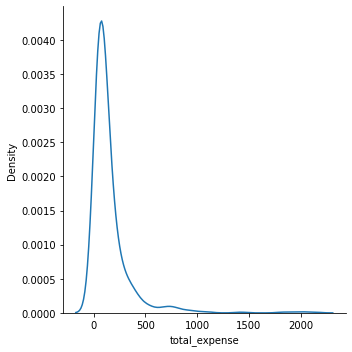

In [ ]:
#@title
sns.displot(train_copy["total_expense"], kind="kde")

Similar to total_assets, the values are positively skewed, with majority of the data points having total expenses falling between 0 and 500. We can compute pearson correlation with depression.

In [ ]:
#@title
train_copy["total_expense"].corr(train_copy["depressed"], method="pearson")

-0.00442917845685186

The correlation is weak. We note that there is an inverse relationship which is unexpected. However, given the extremely small value, the correlation can be approximated as 0.

We will explore further by creating a new feature high_expense, which maps the values in total_expense that fall in the > 50 percentile as 1 for high_expense, and the rest as 0 for low expense.

In [ ]:
#@title
train_copy["high_expense"] = train_copy["total_expense"].apply(lambda x: 1 if x > train_copy['total_expense'].quantile(0.5) else 0)

Compute correlation between high_expense and depression

In [ ]:
#@title
train_copy["high_expense"].corr(train_copy["depressed"], method="pearson")

0.020098000742355397

There is still a weak correlation. However, the relationship is positive, which is as expected. Higher expense might be correlated with depression. We can plot a histogram to see the number of depression per high_expense group.

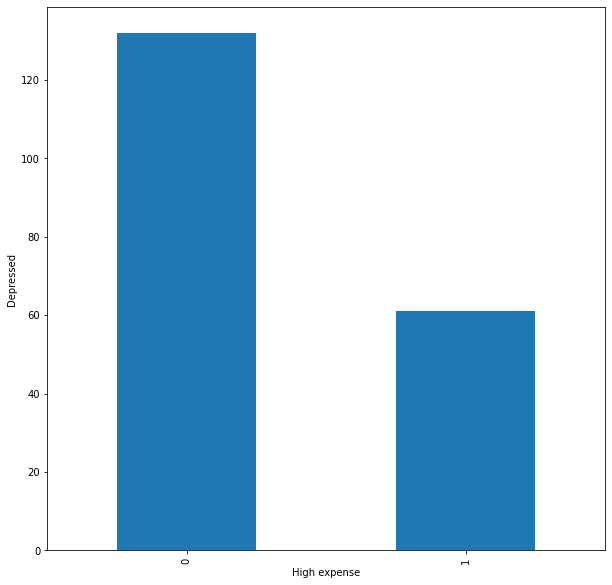

In [ ]:
#@title
expense_group = train_copy.groupby(['high_expense'])['depressed'].sum()

expense_group.plot(kind='bar', ylabel='Depressed',
         xlabel='High expense', figsize=(10,10))

We can see that the class is quite imbalanced, with number of data points that have low_expense 1.5x of number of high expense. We can explore different threshold for classying a respondent as high_expense, and print the correlation for each threshold.

In [ ]:
#@title
thresholds = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in thresholds:
  temp = train_copy["total_expense"].apply(lambda x: 1 if x > train_copy['total_expense'].quantile(i) else 0)
  print(f'threshold: {i}, corr: {temp.corr(train["depressed"])}')

threshold: 0.1, corr: 0.0007862877266682128
threshold: 0.2, corr: 0.007717992515339858
threshold: 0.3, corr: 0.01404664186632353
threshold: 0.4, corr: 0.007052982806159437
threshold: 0.5, corr: 0.020098000742355397
threshold: 0.6, corr: 0.023285720198702908
threshold: 0.7, corr: 0.028858946782514463
threshold: 0.8, corr: 0.007471831265633538
threshold: 0.9, corr: 0.024859457330226653


We can see that there is a weak correlation across the different values. We can conclude that for this training dataset, total expense does not has a significant relationship with depression.

### Asset/Expense ratio vs depression

We want to test if having a high asset-expense ratio, depression will occur less often

In [ ]:
#@title
train_copy["asset_expense_ratio"] = train_copy["total_asset"] / train_copy["total_expense"]

In [ ]:
#@title
train_copy["asset_expense_ratio"].describe()

count    677.000000
mean      12.038490
std       15.966923
min        0.399079
25%        4.225399
50%        7.006020
75%       13.195755
max      171.850422
Name: asset_expense_ratio, dtype: float64

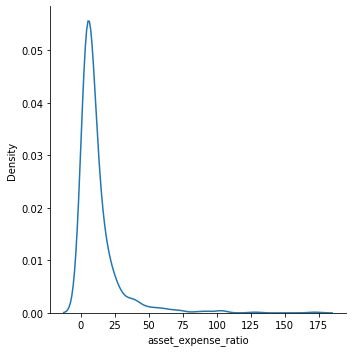

In [ ]:
#@title
sns.displot(train_copy["asset_expense_ratio"], kind="kde")

The ratio is positively skewed, with majority of the data points falling between 0 and 25. We will compute the pearson correlation with depression.

In [ ]:
#@title
train_copy["asset_expense_ratio"].corr(train["depressed"], method="pearson")

-0.09168966701061129

There is a weak correlation. However, there is an inverse relationship which means that with higher asset-expense ratio, depression is lower. This is as expected. 

We will explore further by creating a new feature high_ratio, which maps the values in asset_expense_ratio that fall in the > 50 percentile as 1 for high, and the rest as 0 for low.

In [ ]:
#@title
train_copy["high_ratio"] = train_copy["asset_expense_ratio"].apply(lambda x: 1 if x > train_copy['asset_expense_ratio'].quantile(0.5) else 0)

In [ ]:
#@title
train_copy["high_ratio"].corr(train["depressed"], method="pearson")

-0.08225002709686101

The correlation is still weak. We can plot the histogram to view the number of depression per group in high_ratio

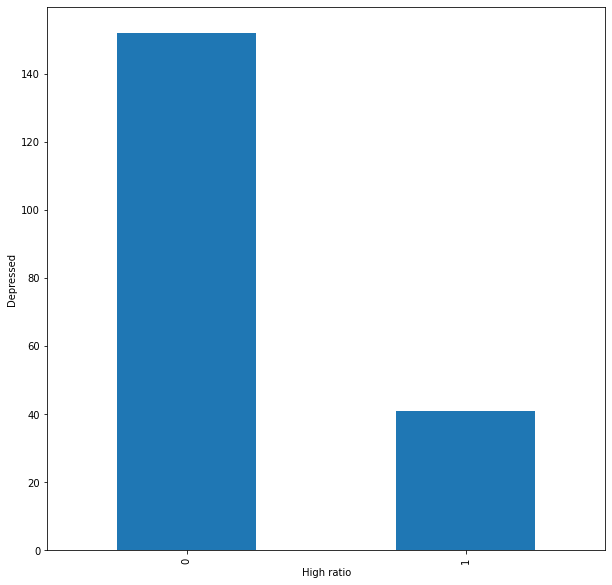

In [ ]:
#@title
ratio_group = train_copy.groupby(['high_ratio'])['depressed'].sum()

ratio_group.plot(kind='bar', ylabel='Depressed',
         xlabel='High ratio', figsize=(10,10))

We can see that the class is quite imbalanced, with numebr of data points that have low ratio being much more. We can explore different threshold for classying a respondent as high ratio, and print the correlation for each threshold.

In [ ]:
#@title
thresholds = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in thresholds:
  temp =  train_copy["asset_expense_ratio"].apply(lambda x: 1 if x > train_copy['asset_expense_ratio'].quantile(i) else 0)
  print(f'threshold: {i}, corr: {temp.corr(train["depressed"])}')

threshold: 0.1, corr: -0.03666066525590322
threshold: 0.2, corr: -0.03905647962163493
threshold: 0.3, corr: -0.06179775921171765
threshold: 0.4, corr: -0.046625681129580133
threshold: 0.5, corr: -0.08225002709686101
threshold: 0.6, corr: -0.0865371730842239
threshold: 0.7, corr: -0.09335585933980454
threshold: 0.8, corr: -0.06465910738824288
threshold: 0.9, corr: -0.04425121608851634


We can see that there is a weak correlation across the different values. We can conclude that for this training dataset, asset-expense ratio does not has a significant relationship with depression.

### Food condition vs depression

We want to test if lack of food has relevance with depression.

The features used are:
- fs_adwholed_often
- fs_adskipm_often
- fs_chskipm_often
- fs_chwholed_often
- fs_sleephun

We obtained a new feature, total_insufficient_meals, by summing up these features.

In [ ]:
#@title
train_copy['total_insufficient_meals'] = train['fs_adwholed_often'] + train['fs_adskipm_often'] + train['fs_chskipm_often'] + train['fs_chwholed_often'] + train['fs_sleephun']

In [ ]:
#@title
train_copy[['total_insufficient_meals']].apply(lambda x: x.corr(train['depressed']))

total_insufficient_meals    0.107792
dtype: float64

There is a weak correlation between total insufficient meals and depression.

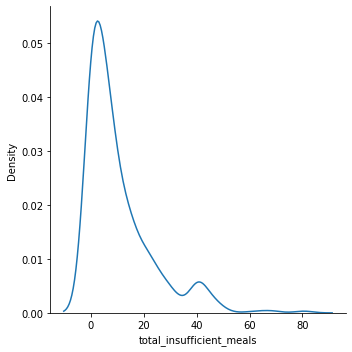

In [ ]:
#@title
sns.displot(train_copy["total_insufficient_meals"], kind="kde")

There is a positive skew for total insufficient meals.

In [ ]:
#@title
train_copy["total_insufficient_meals_high"] = train_copy["total_insufficient_meals"].apply(lambda x: 1 if x > train_copy['total_insufficient_meals'].quantile(0.5) else 0)
train_copy["total_insufficient_meals_high"].corr(train["depressed"], method="pearson")

0.038898283836986465

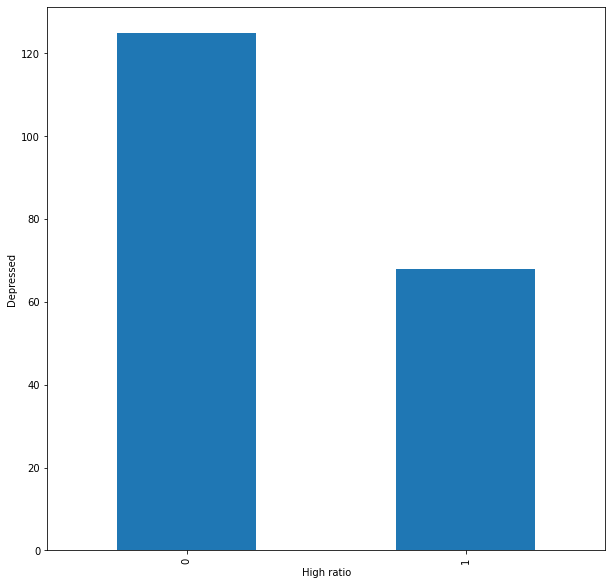

In [ ]:
#@title
ratio_group = train_copy.groupby(['total_insufficient_meals_high'])['depressed'].sum()

ratio_group.plot(kind='bar', ylabel='Depressed',
         xlabel='High ratio', figsize=(10,10))

We can see that the class is quite imbalanced, with number of data points that have low insufficient meals about twice of number of high insufficient meals. We can explore different threshold for classying a respondent as high insufficient meals, and print the correlation for each threshold.

In [ ]:
#@title
thresholds = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in thresholds:
  temp =  train_copy["total_insufficient_meals"].apply(lambda x: 1 if x > train_copy['total_insufficient_meals'].quantile(i) else 0)
  print(f'threshold: {i}, corr: {temp.corr(train["depressed"])}')

threshold: 0.1, corr: -0.014376173272466387
threshold: 0.2, corr: -0.014376173272466387
threshold: 0.3, corr: 0.0009478008609905131
threshold: 0.4, corr: 0.02475382966917118
threshold: 0.5, corr: 0.038898283836986465
threshold: 0.6, corr: 0.03774279256384736
threshold: 0.7, corr: 0.05087023761991699
threshold: 0.8, corr: 0.03870752134938097
threshold: 0.9, corr: 0.058163820347747204


We can see that there is a weak correlation across the different values. We can conclude that for this training dataset, total insufficient meals do not have a significant relationship with depression.

### Health vs depression

Our hypothesis is that if medical expenses is higher, there is a higher probability of depression.

The features used are:
- med_portion_sickinjured
- hh_totalmembers
- med_healthconsult
- med_expenses_hh_ep

We obtained a new feature, hh_total_med_expenses by multiplying the 4 features mentioned above.

In [ ]:
#@title
train_copy['hh_total_med_expenses'] = train['med_portion_sickinjured'] * train['hh_totalmembers'] * train['med_healthconsult'] * train['med_expenses_hh_ep']

In [ ]:
#@title
train_copy[['hh_total_med_expenses']].apply(lambda x: x.corr(train['depressed']))

hh_total_med_expenses    0.082349
dtype: float64

Thee is a weak positive correlation between household total medical expenses and depression. This is an expected result and aligns with our hypothesis.

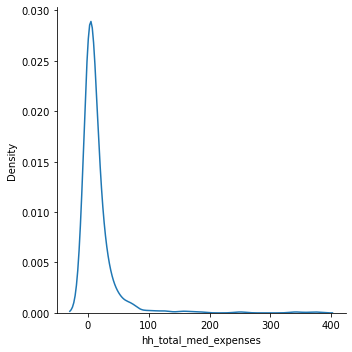

In [ ]:
#@title
sns.displot(train_copy["hh_total_med_expenses"], kind="kde")

There is a positive skew for the household total medical expenses.

In [ ]:
#@title
train_copy["hh_total_med_expenses_high"] = train_copy["hh_total_med_expenses"].apply(lambda x: 1 if x > train_copy['hh_total_med_expenses'].quantile(0.5) else 0)
train_copy["hh_total_med_expenses_high"].corr(train["depressed"], method="pearson")

0.07640107962096486

The correlation is still weak. We can plot the histogram to view the number of depression per group in low medical expenses and high medical expenses.

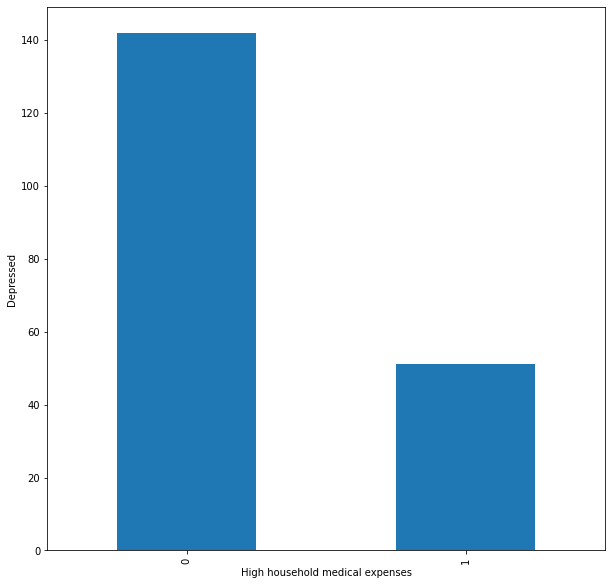

In [ ]:
#@title
ratio_group = train_copy.groupby(['hh_total_med_expenses_high'])['depressed'].sum()

ratio_group.plot(kind='bar', ylabel='Depressed',
         xlabel='High household medical expenses', figsize=(10,10))

We can see that the class is quite imbalanced, with number of data points that have low medical expenses almost 3x of number of high medical expenses. We can explore different threshold for classying a respondent as high medical expenses, and print the correlation for each threshold.

In [ ]:
#@title
thresholds = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]
for i in thresholds:
  temp =  train_copy["hh_total_med_expenses"].apply(lambda x: 1 if x > train_copy['hh_total_med_expenses'].quantile(i) else 0)
  print(f'threshold: {i}, corr: {temp.corr(train["depressed"])}')

threshold: 0.1, corr: 0.03322556236203145
threshold: 0.2, corr: 0.04129088860962494
threshold: 0.3, corr: 0.046053399470793156
threshold: 0.4, corr: 0.06273088778392932
threshold: 0.5, corr: 0.07640107962096486
threshold: 0.6, corr: 0.08723613066509876
threshold: 0.7, corr: 0.10278776790150639
threshold: 0.8, corr: 0.041648220204038786
threshold: 0.9, corr: 0.04084871245226306


We can see that there is a weak correlation across the different values. We can conclude that for this training dataset, total household medical expenses do not have a significant relationship with depression.

# Data Processing

### Train - Test Split

In [ ]:
#@title
train = pd.read_csv("train.csv")
X, y = train.drop('depressed', axis=1), train['depressed']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

We check the class distribution of the training dataset

(array([657.,   0.,   0.,   0.,   0.,   0.,   0.,   0.,   0., 143.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

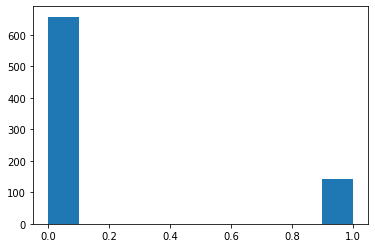

In [ ]:
plt.hist(y_train)

Training dataset is imbalanced, with a higher proportion of true negatives than true positives. Accuracy will not be a good performance metric. Certain models such as linear models do not perform well with imbalanced datasets, hence we should attempt to handle this in the pipeline

### Transforming to numerical features

In [ ]:
#@title
def monthToNum(month):
    return {
            'Jan': 1,
            'Feb': 2,
            'Mar': 3,
            'Apr': 4,
            'May': 5,
            'Jun': 6,
            'Jul': 7,
            'Aug': 8,
            'Sep': 9, 
            'Oct': 10,
            'Nov': 11,
            'Dec': 12
    }[month]

class TransformerSurveyDate():
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        X_copy = X.copy()
        X_copy[["survey_day", "survey_month", "survey_year"]] = X_copy["survey_date"].str.split("-", expand = True)
        X_copy["survey_day"] = X_copy["survey_day"].astype(int)
        X_copy["survey_month"] = X_copy["survey_month"].apply(lambda x: monthToNum(x))
        X_copy["survey_year"] = X_copy["survey_year"].astype(int)
        X_copy.drop('survey_date', axis=1, inplace=True)
        return X_copy

pp_survey_date = TransformerSurveyDate()
piped_X_train = pp_survey_date.transform(X_train)
piped_X_train.head()

,surveyid,village,femaleres,age,married,children,hhsize,edu,hh_children,hh_totalmembers,cons_nondurable,asset_livestock,asset_durable,asset_phone,asset_savings,asset_land_owned_total,asset_niceroof,cons_allfood,cons_ownfood,cons_alcohol,cons_tobacco,cons_med_total,cons_med_children,cons_ed,cons_social,cons_other,ent_wagelabor,ent_ownfarm,ent_business,ent_nonagbusiness,ent_employees,ent_nonag_revenue,ent_nonag_flowcost,ent_farmrevenue,ent_farmexpenses,ent_animalstockrev,ent_total_cost,fs_adskipm_often,fs_adwholed_often,fs_chskipm_often,fs_chwholed_often,fs_meat,fs_enoughtom,fs_sleephun,med_expenses_hh_ep,med_expenses_sp_ep,med_expenses_child_ep,med_portion_sickinjured,med_port_sick_child,med_afford_port,med_sickdays_hhave,med_healthconsult,med_vacc_newborns,med_child_check,med_u5_deaths,ed_expenses,ed_expenses_perkid,ed_schoolattend,ed_sch_missedpc,ed_work_act_pc,labor_primary,wage_expenditures,durable_investment,nondurable_investment,given_mpesa,amount_given_mpesa,received_mpesa,amount_received_mpesa,net_mpesa,saved_mpesa,amount_saved_mpesa,early_survey,day_of_week,survey_day,survey_month,survey_year
1043,5,1,1,23.0,1,4,6,10,4,6.0,470.46863,270.908420,305.57327,0.000000,0.000000,0.0,0,380.889310,59.630558,0.0,0.0,0.0,0.0,0.800768,21.353827,67.424706,1,0,0,0,0,0.000000,0.000000,2.135383,6.050251,2.001921,20.464085,20.0,3.0,0.0,0.0,2.0,0.0,0.0,4.964765,12.011527,3.042920,1.00,1.000000,1.0,2.833333,1.000000,1,1,NaN,9.609222,3.203074,1.0,11.0,0.0,1,0,642.46497,21.264853,0,0.0,0,0.0,0.0,0,0.000000,0,1,29,10,61
318,479,94,1,25.0,1,2,4,9,2,4.0,161.63837,45.433456,258.32791,24.023054,28.827665,1.0,0,94.704788,2.549113,NaN,NaN,0.0,0.0,1.681614,17.750368,47.501587,0,0,0,1,0,24.343363,0.480461,3.042920,0.466003,1.601537,3.348769,7.5,0.0,0.0,0.0,2.0,0.0,0.0,3.042920,2.882766,1.121076,0.75,0.500000,1.0,2.500000,0.333333,1,1,NaN,20.179367,10.089684,0.5,0.0,0.0,0,0,311.60889,33.858047,0,0.0,0,0.0,0.0,0,0.000000,0,5,9,11,61
312,538,53,1,24.0,1,3,5,11,3,5.0,370.68338,16.521257,321.90894,38.436890,64.061478,0.0,0,253.771150,19.485367,0.0,0.0,0.0,0.0,0.000000,16.015369,100.896830,0,1,0,1,0,80.076851,66.196869,19.485367,38.058746,0.000000,120.270990,7.5,0.0,7.5,0.0,2.0,0.0,0.0,NaN,NaN,5.124918,0.60,0.333333,1.0,0.400000,0.666667,1,1,NaN,0.000000,0.000000,1.0,0.0,0.0,0,0,400.89014,184.332460,0,0.0,0,0.0,0.0,0,0.000000,0,3,12,9,61
255,782,153,1,38.0,1,0,2,7,0,2.0,183.87172,380.026250,325.11200,0.000000,1.601537,1.5,0,156.658920,0.000000,0.0,0.0,0.0,NaN,0.000000,0.467115,26.745668,0,0,1,1,0,0.000000,72.069168,0.000000,0.000000,0.000000,72.069168,0.0,0.0,NaN,NaN,7.0,0.0,0.0,0.000000,0.000000,NaN,1.00,NaN,0.5,3.000000,0.500000,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,733.96594,73.670708,0,0.0,0,0.0,0.0,1,6.406148,0,4,8,11,61
740,345,73,0,22.0,1,2,4,11,0,NaN,0.00000,0.000000,0.00000,0.000000,0.000000,0.0,0,0.000000,0.000000,0.0,0.0,0.0,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,0,0.0,0.0,0,0.000000,0,4,13,12,61


### Outlier imputation

To handle outliers, we will remove the values and transform them into missing data. Subsequently during imputation, we will impute an estimate as replacement. This is because single value imputation such as mean will be less accurate, as such values are affected by the values of the outlier in the first place. Furthermore, multi-value imputation takes into account other features, and thus the estimate will be more accurate

Outliers are removed before imputation as model-based imputation such as KNNImputer is sensitive to outliers, and could thus produce inaccurate estimates

In [ ]:

class TransformerHandleOutliers():
    def __init__(self):
        pass

    def fit(self, X, y=None):
        return self

    def transform(self, X, y=None):
        X_copy = X.copy()
        temporal_features = [feature for feature in X if 'day' in feature or 'month' in feature or 'year' in feature or 'week' in feature]
        discrete_features = [feature for feature in X if (len(X[feature].unique()) < 25 and feature not in ['depressed'] + temporal_features) or feature in ['village', 'age']]
        continuous_features = [feature for feature in X if feature not in discrete_features + ['depressed'] + temporal_features]
        for feature in continuous_features:
          f = X_copy[feature]
          q1 = f.quantile(0.25)
          q3 = f.quantile(0.75)
          iqr = q3 - q1
          Lower_tail = q1 - 1.5 * iqr
          Upper_tail = q3 + 1.5 * iqr
          # feature_mean = np.mean(f)
          for i in f:
            if i > Upper_tail or i < Lower_tail:
              X_copy[feature] = f.replace(i, np.nan)
        return X_copy


pp_handle_outliers = TransformerHandleOutliers()
piped_X_train = pp_handle_outliers.transform(piped_X_train)
piped_X_train.head()

,surveyid,village,femaleres,age,married,children,hhsize,edu,hh_children,hh_totalmembers,cons_nondurable,asset_livestock,asset_durable,asset_phone,asset_savings,asset_land_owned_total,asset_niceroof,cons_allfood,cons_ownfood,cons_alcohol,cons_tobacco,cons_med_total,cons_med_children,cons_ed,cons_social,cons_other,ent_wagelabor,ent_ownfarm,ent_business,ent_nonagbusiness,ent_employees,ent_nonag_revenue,ent_nonag_flowcost,ent_farmrevenue,ent_farmexpenses,ent_animalstockrev,ent_total_cost,fs_adskipm_often,fs_adwholed_often,fs_chskipm_often,fs_chwholed_often,fs_meat,fs_enoughtom,fs_sleephun,med_expenses_hh_ep,med_expenses_sp_ep,med_expenses_child_ep,med_portion_sickinjured,med_port_sick_child,med_afford_port,med_sickdays_hhave,med_healthconsult,med_vacc_newborns,med_child_check,med_u5_deaths,ed_expenses,ed_expenses_perkid,ed_schoolattend,ed_sch_missedpc,ed_work_act_pc,labor_primary,wage_expenditures,durable_investment,nondurable_investment,given_mpesa,amount_given_mpesa,received_mpesa,amount_received_mpesa,net_mpesa,saved_mpesa,amount_saved_mpesa,early_survey,day_of_week,survey_day,survey_month,survey_year
1043,5,1,1,23.0,1,4,6,10,4,6.0,NaN,NaN,305.57327,0.000000,0.0,0.0,0,NaN,NaN,0.0,0.0,0.0,0.0,0.800768,NaN,67.424706,1,0,0,0,0,0.0,0.0,2.135383,NaN,2.001921,20.464085,20.0,3.0,0.0,0.0,2.0,0.0,0.0,4.964765,12.011527,3.042920,1.00,1.000000,1.0,2.833333,1.000000,1,1,NaN,9.609222,3.203074,1.0,NaN,0.0,1,0,642.46497,21.264853,0,0.0,0,0.0,0.0,0,0.0,0,1,29,10,61
318,479,94,1,25.0,1,2,4,9,2,4.0,161.63837,45.433456,258.32791,24.023054,NaN,1.0,0,94.704788,2.549113,NaN,NaN,0.0,0.0,1.681614,NaN,47.501587,0,0,0,1,0,NaN,NaN,3.042920,0.466003,1.601537,3.348769,7.5,0.0,0.0,0.0,2.0,0.0,0.0,3.042920,2.882766,1.121076,0.75,0.500000,1.0,2.500000,0.333333,1,1,NaN,20.179367,10.089684,0.5,0.0,0.0,0,0,311.60889,33.858047,0,0.0,0,0.0,0.0,0,0.0,0,5,9,11,61
312,538,53,1,24.0,1,3,5,11,3,5.0,370.68338,16.521257,321.90894,38.436890,NaN,0.0,0,253.771150,19.485367,0.0,0.0,0.0,0.0,0.000000,NaN,NaN,0,1,0,1,0,NaN,NaN,NaN,NaN,0.000000,NaN,7.5,0.0,7.5,0.0,2.0,0.0,0.0,NaN,NaN,5.124918,0.60,0.333333,1.0,0.400000,0.666667,1,1,NaN,0.000000,0.000000,1.0,0.0,0.0,0,0,400.89014,NaN,0,0.0,0,0.0,0.0,0,0.0,0,3,12,9,61
255,782,153,1,38.0,1,0,2,7,0,2.0,183.87172,NaN,325.11200,0.000000,NaN,1.5,0,156.658920,0.000000,0.0,0.0,0.0,NaN,0.000000,0.467115,26.745668,0,0,1,1,0,0.0,NaN,0.000000,0.000000,0.000000,NaN,0.0,0.0,NaN,NaN,7.0,0.0,0.0,0.000000,0.000000,NaN,1.00,NaN,0.5,3.000000,0.500000,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,733.96594,NaN,0,0.0,0,0.0,0.0,1,NaN,0,4,8,11,61
740,345,73,0,22.0,1,2,4,11,0,NaN,0.00000,0.000000,0.00000,0.000000,0.0,0.0,0,0.000000,0.000000,0.0,0.0,0.0,NaN,0.000000,0.000000,0.000000,0,0,0,0,0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,1,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0.00000,0.000000,0,0.0,0,0.0,0.0,0,0.0,0,4,13,12,61


### Dropping correlated and unused features

Highly correlated features and unused features are dropped at this component of the pipeline. This is to reduce the feature space. Features whose data points all have the same value will not be useful in the prediction as it can negatively reflect poorly by creating biasness in the data

In [ ]:
#@title

columns_drop_eda = ['med_vacc_newborns', 'med_child_check', 'wage_expenditures', 'asset_niceroof', 'hh_totalmembers', 'hhsize', 
                    'hh_children', 'cons_allfood', 'cons_ownfood', 'cons_other', 'durable_investment', 'asset_savings', 'cons_ownfood', 
                    'cons_med_children', 'ed_expenses', 'labor_primary', 'ent_total_cost', 'fs_adskipm_often', 
                    'fs_chwholed_often', 'med_portion_sickinjured', 'net_mpesa']
columns_to_drop = columns_drop_eda + ['surveyid']
columns_to_drop

['med_vacc_newborns',
 'med_child_check',
 'wage_expenditures',
 'asset_niceroof',
 'hh_totalmembers',
 'hhsize',
 'hh_children',
 'cons_allfood',
 'cons_ownfood',
 'cons_other',
 'durable_investment',
 'asset_savings',
 'cons_ownfood',
 'cons_med_children',
 'ed_expenses',
 'labor_primary',
 'ent_total_cost',
 'fs_adskipm_often',
 'fs_chwholed_often',
 'med_portion_sickinjured',
 'net_mpesa',
 'surveyid']

In [ ]:
#@title
class TransformerDropColumns():
    def __init__(self,columns):
        self.columns=columns

    def fit(self, X, y=None):
        return self

    def transform(self,X,y=None):
      global X_clone
      X_clone = X.drop(self.columns,axis=1, errors='ignore')
      return X_clone

pp_drop_columns = TransformerDropColumns(columns_to_drop)
piped_X_train = pp_drop_columns.transform(piped_X_train)

piped_X_train.head()

,village,femaleres,age,married,children,edu,cons_nondurable,asset_livestock,asset_durable,asset_phone,asset_land_owned_total,cons_alcohol,cons_tobacco,cons_med_total,cons_ed,cons_social,ent_wagelabor,ent_ownfarm,ent_business,ent_nonagbusiness,ent_employees,ent_nonag_revenue,ent_nonag_flowcost,ent_farmrevenue,ent_farmexpenses,ent_animalstockrev,fs_adwholed_often,fs_chskipm_often,fs_meat,fs_enoughtom,fs_sleephun,med_expenses_hh_ep,med_expenses_sp_ep,med_expenses_child_ep,med_port_sick_child,med_afford_port,med_sickdays_hhave,med_healthconsult,med_u5_deaths,ed_expenses_perkid,ed_schoolattend,ed_sch_missedpc,ed_work_act_pc,nondurable_investment,given_mpesa,amount_given_mpesa,received_mpesa,amount_received_mpesa,saved_mpesa,amount_saved_mpesa,early_survey,day_of_week,survey_day,survey_month,survey_year
1043,1,1,23.0,1,4,10,NaN,NaN,305.57327,0.000000,0.0,0.0,0.0,0.0,0.800768,NaN,1,0,0,0,0,0.0,0.0,2.135383,NaN,2.001921,3.0,0.0,2.0,0.0,0.0,4.964765,12.011527,3.042920,1.000000,1.0,2.833333,1.000000,NaN,3.203074,1.0,NaN,0.0,21.264853,0,0.0,0,0.0,0,0.0,0,1,29,10,61
318,94,1,25.0,1,2,9,161.63837,45.433456,258.32791,24.023054,1.0,NaN,NaN,0.0,1.681614,NaN,0,0,0,1,0,NaN,NaN,3.042920,0.466003,1.601537,0.0,0.0,2.0,0.0,0.0,3.042920,2.882766,1.121076,0.500000,1.0,2.500000,0.333333,NaN,10.089684,0.5,0.0,0.0,33.858047,0,0.0,0,0.0,0,0.0,0,5,9,11,61
312,53,1,24.0,1,3,11,370.68338,16.521257,321.90894,38.436890,0.0,0.0,0.0,0.0,0.000000,NaN,0,1,0,1,0,NaN,NaN,NaN,NaN,0.000000,0.0,7.5,2.0,0.0,0.0,NaN,NaN,5.124918,0.333333,1.0,0.400000,0.666667,NaN,0.000000,1.0,0.0,0.0,NaN,0,0.0,0,0.0,0,0.0,0,3,12,9,61
255,153,1,38.0,1,0,7,183.87172,NaN,325.11200,0.000000,1.5,0.0,0.0,0.0,0.000000,0.467115,0,0,1,1,0,0.0,NaN,0.000000,0.000000,0.000000,0.0,NaN,7.0,0.0,0.0,0.000000,0.000000,NaN,NaN,0.5,3.000000,0.500000,NaN,NaN,NaN,NaN,NaN,NaN,0,0.0,0,0.0,1,NaN,0,4,8,11,61
740,73,0,22.0,1,2,11,0.00000,0.000000,0.00000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0,0,0,0,0,0.0,0.0,0.000000,0.000000,0.000000,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0,0.0,0,0.0,0,0.0,0,4,13,12,61


### Feature scaling

Scaling our data using the [`MinMaxScaler`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html) operator in sklearn. This transform features by scaling each feature to a given range. It scales and translates each feature individually such that it is in the given range on the training set, e.g. between zero and one.

For this dataset, we decided to go with MinMaxScaler and scale the values between 0 and 1. This is also because certain machine learning models, such as Navie Bayes, are unable to handle data points with negative values.

Scaling is done before imputation so that the values can converge faster.

In [ ]:
norm_scaler = MinMaxScaler()
X_std = norm_scaler.fit_transform(piped_X_train)

pd.DataFrame(X_std, columns=piped_X_train.columns).head()

,village,femaleres,age,married,children,edu,cons_nondurable,asset_livestock,asset_durable,asset_phone,asset_land_owned_total,cons_alcohol,cons_tobacco,cons_med_total,cons_ed,cons_social,ent_wagelabor,ent_ownfarm,ent_business,ent_nonagbusiness,ent_employees,ent_nonag_revenue,ent_nonag_flowcost,ent_farmrevenue,ent_farmexpenses,ent_animalstockrev,fs_adwholed_often,fs_chskipm_often,fs_meat,fs_enoughtom,fs_sleephun,med_expenses_hh_ep,med_expenses_sp_ep,med_expenses_child_ep,med_port_sick_child,med_afford_port,med_sickdays_hhave,med_healthconsult,med_u5_deaths,ed_expenses_perkid,ed_schoolattend,ed_sch_missedpc,ed_work_act_pc,nondurable_investment,given_mpesa,amount_given_mpesa,received_mpesa,amount_received_mpesa,saved_mpesa,amount_saved_mpesa,early_survey,day_of_week,survey_day,survey_month,survey_year
0,0.000000,1.0,0.081081,1.0,0.4,0.500000,NaN,NaN,0.570012,0.0000,0.00000,0.0,0.0,0.0,0.150,NaN,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.152381,NaN,0.255973,0.15,0.000,0.090909,0.0,0.0,0.406114,0.75,0.335294,1.000000,1.0,0.091398,1.000000,NaN,0.078431,0.666667,NaN,0.0,0.426824,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.166667,0.933333,0.750,1.0
1,0.319588,1.0,0.108108,1.0,0.2,0.444444,0.352905,0.207854,0.481881,0.3125,0.31746,NaN,NaN,0.0,0.315,NaN,0.0,0.0,0.0,1.0,0.0,NaN,NaN,0.217143,0.093423,0.204778,0.00,0.000,0.090909,0.0,0.0,0.248908,0.18,0.123529,0.500000,1.0,0.080645,0.333333,NaN,0.247059,0.333333,0.0,0.0,0.679592,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.833333,0.266667,0.875,1.0
2,0.178694,1.0,0.094595,1.0,0.3,0.555556,0.809312,0.075583,0.600484,0.5000,0.00000,0.0,0.0,0.0,0.000,NaN,0.0,1.0,0.0,1.0,0.0,NaN,NaN,NaN,NaN,0.000000,0.00,0.375,0.090909,0.0,0.0,NaN,NaN,0.564706,0.333333,1.0,0.012903,0.666667,NaN,0.000000,0.666667,0.0,0.0,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.500000,0.366667,0.625,1.0
3,0.522337,1.0,0.283784,1.0,0.0,0.333333,0.401447,NaN,0.606459,0.0000,0.47619,0.0,0.0,0.0,0.000,0.053435,0.0,0.0,1.0,1.0,0.0,0.0,NaN,0.000000,0.000000,0.000000,0.00,NaN,0.318182,0.0,0.0,0.000000,0.00,NaN,NaN,0.5,0.096774,0.500000,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,1.0,NaN,0.0,0.666667,0.233333,0.875,1.0
4,0.247423,0.0,0.067568,1.0,0.2,0.555556,0.000000,0.000000,0.000000,0.0000,0.00000,0.0,0.0,0.0,0.000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.666667,0.400000,1.000,1.0


### Missing data imputation

First we identify features with missing values. This will include data points that were initially missing, as well as data points that were initial outliers

In [ ]:
#@title
def columns_with_missing_data(df, threshold):
  results = []
  for i in df.columns:
    col = df[i]
    if np.sum(col.isnull())/len(col) >= threshold:
      results.append(i)
  return results

data_missing_cols = columns_with_missing_data(X_train,0.01)
data_missing_cols

['hh_totalmembers',
 'cons_alcohol',
 'cons_tobacco',
 'cons_med_children',
 'fs_chskipm_often',
 'fs_chwholed_often',
 'fs_meat',
 'fs_enoughtom',
 'fs_sleephun',
 'med_expenses_hh_ep',
 'med_expenses_sp_ep',
 'med_expenses_child_ep',
 'med_portion_sickinjured',
 'med_port_sick_child',
 'med_afford_port',
 'med_sickdays_hhave',
 'med_healthconsult',
 'med_u5_deaths',
 'ed_expenses',
 'ed_expenses_perkid',
 'ed_schoolattend',
 'ed_sch_missedpc',
 'ed_work_act_pc']

**Data with missing data + outlier**
- cons_tabacco 
- fs_meat 
- med_expenses_child_ep 
- med_afford_port 
- med_sickdays_hhave 
- med_healthconsult 
- ed_expenses_perkid 
- ed_schoolattend 
- ed_sch_missedpc 

In [ ]:
#@title
def print_evaluation(df):
  print('%25s' % 'Feature ', '%8s |' % 'Type',
                '%8s |' % 'Values',
                '%8s |' % 'Unique',
                '%8s |' % 'Null',
                '%10s |' % '% missing')
  print('=' * 90)
  for i in df.columns:
    col = df[i]
    print('%23s: ' % i,
          '%8s |' % col.dtypes,
          '%8s |' % col.count(),
          '%8s |' % col.nunique(),
          '%8s |' % np.sum(col.isnull()),
          '%8s %% |' % ('%.2f' % (np.sum(col.isnull())/len(col)*100)))  

display_columns = piped_X_train.columns
pp_knn_imputer = KNNImputer(n_neighbors=5)
piped_X_train = pp_knn_imputer.fit_transform(piped_X_train)
print_evaluation(pd.DataFrame(piped_X_train, columns=display_columns))

                 Feature      Type |   Values |   Unique |     Null |  % missing |
                village:   float64 |      800 |      215 |        0 |     0.00 % |
              femaleres:   float64 |      800 |        2 |        0 |     0.00 % |
                    age:   float64 |      800 |       90 |        0 |     0.00 % |
                married:   float64 |      800 |        2 |        0 |     0.00 % |
               children:   float64 |      800 |       11 |        0 |     0.00 % |
                    edu:   float64 |      800 |       18 |        0 |     0.00 % |
        cons_nondurable:   float64 |      800 |      558 |        0 |     0.00 % |
        asset_livestock:   float64 |      800 |      226 |        0 |     0.00 % |
          asset_durable:   float64 |      800 |      437 |        0 |     0.00 % |
            asset_phone:   float64 |      800 |       79 |        0 |     0.00 % |
 asset_land_owned_total:   float64 |      800 |       66 |        0 |     0.00 % |
    

### Feature selection

#### Variance threshold

From EDA, we observed that med_vacc_newborns and med_child_check have 0 variance. Features with 0 variance should be removed as they cannot be used for finding any interesting patterns. The removal will not have an impact on target variable as they are constants.

In [ ]:
fs_variance_threshold = VarianceThreshold()
fs_variance_threshold.fit(piped_X_train, y_train)

mask = fs_variance_threshold.get_support(indices=True)
new_features = display_columns[mask]
print(new_features)
len(new_features)

Index(['village', 'femaleres', 'age', 'married', 'children', 'edu',
       'cons_nondurable', 'asset_livestock', 'asset_durable', 'asset_phone',
       'asset_land_owned_total', 'cons_ed', 'cons_social', 'ent_wagelabor',
       'ent_ownfarm', 'ent_business', 'ent_nonagbusiness', 'ent_employees',
       'ent_farmrevenue', 'ent_farmexpenses', 'ent_animalstockrev',
       'fs_adwholed_often', 'fs_chskipm_often', 'fs_meat', 'fs_enoughtom',
       'fs_sleephun', 'med_expenses_hh_ep', 'med_expenses_sp_ep',
       'med_expenses_child_ep', 'med_port_sick_child', 'med_afford_port',
       'med_sickdays_hhave', 'med_healthconsult', 'med_u5_deaths',
       'ed_expenses_perkid', 'ed_schoolattend', 'ed_sch_missedpc',
       'ed_work_act_pc', 'nondurable_investment', 'given_mpesa',
       'amount_given_mpesa', 'received_mpesa', 'amount_received_mpesa',
       'saved_mpesa', 'early_survey', 'day_of_week', 'survey_day',
       'survey_month', 'survey_year'],
      dtype='object')


49

#### Select k-best

Using the [`SelectKBest`](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html#sklearn.feature_selection.SelectKBest) feature selector, we select the 10 best features. This algorithm selects features according to high score for the feature for classification task. The default parameters work only for classification, and thus we used the default parameters.

In [ ]:
#@title
fs_select_k_best = SelectKBest()
fs_select_k_best.fit(piped_X_train, y_train)

# obtain the featuures that were selected
mask = fs_select_k_best.get_support(indices=True)
new_features = display_columns[mask]
new_features

Features [11 12 13 21 22 49] are constant.
invalid value encountered in true_divide


Index(['age', 'married', 'edu', 'cons_ed', 'cons_social', 'fs_adwholed_often',
       'fs_sleephun', 'med_sickdays_hhave', 'nondurable_investment',
       'survey_month'],
      dtype='object')

In [ ]:
piped_X_train = fs_select_k_best.transform(piped_X_train)

pd.DataFrame(piped_X_train, columns=new_features).head()

,age,married,edu,cons_ed,cons_social,fs_adwholed_often,fs_sleephun,med_sickdays_hhave,nondurable_investment,survey_month
0,23.0,1.0,10.0,0.800768,2.055306,3.0,0.0,2.833333,21.264853,10.0
1,25.0,1.0,9.0,1.681614,3.870381,0.0,0.0,2.500000,33.858047,11.0
2,24.0,1.0,11.0,0.000000,3.313046,0.0,0.0,0.400000,15.708186,9.0
3,38.0,1.0,7.0,0.000000,0.467115,0.0,0.0,3.000000,14.199849,11.0
4,22.0,1.0,11.0,0.000000,0.000000,0.0,0.2,2.271429,0.000000,12.0


# Baseline Logistic Regression Model

## Baseline with default parameters

In [ ]:
#@title

X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('scaler', MinMaxScaler()),
    ('impute', pp_knn_imputer),
    ('variance_threshold', VarianceThreshold()),
    ('select_k_best', SelectKBest()),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', LogisticRegression(random_state=0))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)

## Evaluation of baseline model

### Cross validation

we perform 5-fold validation to derive an more accurate estimate of performance of the model

In [ ]:
#@title
k = 5
kf = KFold(n_splits=k, shuffle=True, random_state=0)
clf = cross_val_score(estimator_pipeline, X_train, y_train, cv = kf, scoring = 'f1')

print(f"Mean score of classifier over 5 folds: {clf.mean()}")

### Evaluation metrics

In [ ]:
#@title
def evaluation(y_test, y_pred, y_pred_prob):
    # Input: 
    # y_test: Ground Truth labels
    # y_pred: Predicted labels
    # y_pred_prob: Predicted probability
    print('==========')
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    roc_auc = auc(fpr, tpr)
    display = RocCurveDisplay(fpr=fpr, tpr=tpr, roc_auc=roc_auc)
    display.plot()
    plt.show()
    print('==========')
    precision, recall, thresholds = precision_recall_curve(y_test, y_pred_prob)
    auc_precision_recall = auc(recall, precision)
    display = PrecisionRecallDisplay(precision=precision, recall=recall)
    display.plot()
    plt.show()
    print("Accuracy:\t{}\nPrecision:\t{}\nRecall:\t{}\nF1:\t{}\nROC-AUC:\t{}\nPR-AUC:\t{}".format(accuracy_score(y_test, y_pred),
                                                                                 precision_score(y_test, y_pred),
                                                                                 recall_score(y_test, y_pred),
                                                                                 f1_score(y_test, y_pred),
                                                                                 auc(fpr, tpr), auc(recall, precision)))
    print('==========')
    def plot_confusion_matrix(cf_matrix):
      ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues', fmt='.0f')

      ax.set_title('Confusion Matrix\n\n');
      ax.set_xlabel('\nPredicted Values')
      ax.set_ylabel('Actual Values ');

      ## Ticket labels - List must be in alphabetical order
      ax.xaxis.set_ticklabels(['False','True'])
      ax.yaxis.set_ticklabels(['False','True'])

      ## Display the visualization of the Confusion Matrix.
      plt.show()
    cf_matrix = confusion_matrix(y_test, y_pred)
    plot_confusion_matrix(cf_matrix)

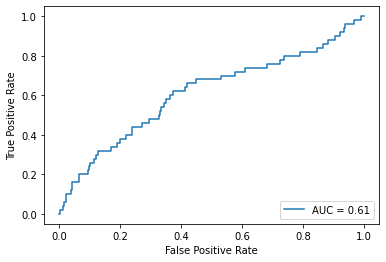

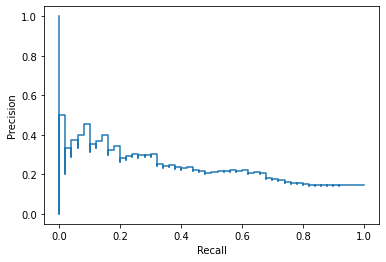

Accuracy:	0.6443148688046647
Precision:	0.20967741935483872
Recall:	0.52
F1:	0.29885057471264365
ROC-AUC:	0.6115358361774744
PR-AUC:	0.22971063812828385


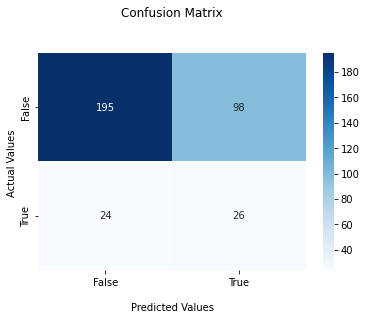

In [ ]:
#@title
evaluation(y_test, y_pred, y_pred_prob)

### Feature importance of baseline model

we will use SHAP values to measure feature importance given its consistency and accuracy.

We will first retrieve the training data after it has been processed by the pipeline.

In [ ]:
train = pd.read_csv("train.csv")
X, y = train.drop('depressed', axis=1), train['depressed']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

#split_survey_date
piped_X_train = pp_survey_date.transform(X_train)

#handle_outliers
piped_X_train = pp_handle_outliers.transform(piped_X_train)

#drop_columns
piped_X_train = pp_drop_columns.transform(piped_X_train)

#scaler
display_columns = piped_X_train.columns
piped_X_train = MinMaxScaler().fit_transform(piped_X_train)
piped_X_train = pd.DataFrame(piped_X_train, columns=display_columns)

#impute
display_columns = piped_X_train.columns
piped_X_train = KNNImputer(n_neighbors=5).fit_transform(piped_X_train)
piped_X_train = pd.DataFrame(piped_X_train, columns=display_columns)
imputed_x_train = piped_X_train.copy()

#variance threshold
X_copy = piped_X_train.copy()
display_cloumns = X_copy.columns
variance_threhold = VarianceThreshold() 
piped_X_train = variance_threhold.fit_transform(piped_X_train)
mask = variance_threhold.get_support(indices=True)
display_cloumns = X_copy[display_columns[mask]].columns
piped_X_train = X_copy.filter(display_cloumns)

# #select k best
X_copy = piped_X_train.copy()
display_cloumns = X_copy.columns
select_k_best = SelectKBest()
piped_X_train = select_k_best.fit_transform(piped_X_train, y_train)
mask = select_k_best.get_support(indices=True)
display_cloumns = imputed_x_train[display_columns[mask]].columns
piped_X_train = imputed_x_train.filter(display_cloumns)

# #resampling
rus = RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)
X_under, y_under = rus.fit_resample(piped_X_train, y_train)
X_under.head()

,age,married,edu,cons_tobacco,ent_nonag_revenue,ent_farmexpenses,fs_chskipm_often,med_expenses_hh_ep,med_healthconsult,amount_received_mpesa
0,0.310811,0.0,0.500000,0.0,0.0,0.289142,0.000,0.000000,1.000000,0.000000
1,0.324324,0.0,0.555556,0.0,0.0,0.699666,0.090,0.524018,1.000000,0.000000
2,0.229730,1.0,0.388889,0.0,0.0,0.000000,0.275,0.309825,0.553333,0.000000
3,0.743243,0.0,0.222222,0.0,0.0,0.401338,1.000,0.165284,0.316667,0.022727
4,0.121622,1.0,0.277778,0.0,0.0,0.254181,0.000,0.039301,0.000000,0.000000


We use the linear explainer provided to explain logistic regression model, as logistic regression is classified under the linear model.

In [ ]:
explainer = shap.LinearExplainer(estimator_pipeline['clf'], X_under)
shap_values = explainer.shap_values(X_under)

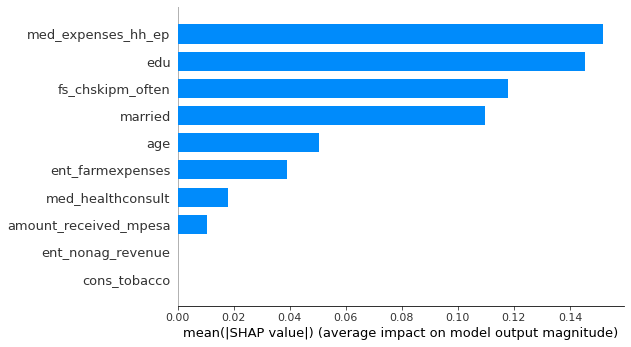

In [ ]:
shap.summary_plot(shap_values, X_under, plot_type='bar')

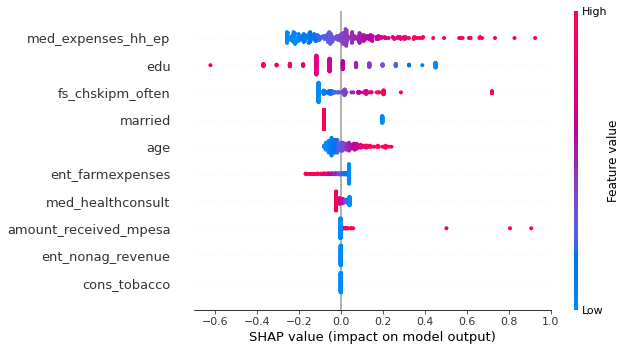

In [ ]:
shap.summary_plot(shap_values, X_under)

## Hyper-parameter tuning

We will be tuning using gridSearchCV to tune the model hyper-parameters as well as regularization thresh-holds.

For regularization, we will try both l2 and l1 regularization and compare their effects on model performance.

First, we check for available parameters in the pipeline

In [ ]:
estimator_pipeline.get_params()

#### Tuning model with GridSearchCV

In [ ]:
parameters = {
    'clf__penalty' : ['l2', 'l1'], 
    'clf__C'       : np.logspace(-4, 4, 20),
    'clf__solver'  : ['saga', 'liblinear'],
    'select_k_best__k': range(10, 40, 10),
}

clf = GridSearchCV(estimator_pipeline,                   
                   param_grid = parameters,   
                   scoring='f1',        
                   cv=5)       
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
y_pred_prob  = clf.predict_proba(X_test)[:,1]

In [ ]:
# best params after GridSearchCV
clf.best_params_

#### Retrain model with best params

Manually rerun the pipeline with best parameters so that we can extract the feature importance. Estimator object in GridSearchCV is not updated with best params

In [ ]:
X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('scaler', MinMaxScaler()),
    ('impute', pp_knn_imputer),
    ('variance_threshold', VarianceThreshold()),
    ('select_k_best', SelectKBest(k=30)),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', LogisticRegression(
        random_state=0, 
        solver='saga', 
        penalty='l1',
        C=206.913808111479
        )
    )
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
estimator_pipeline.fit(X, y)

The max_iter was reached which means the coef_ did not converge
The max_iter was reached which means the coef_ did not converge


Pipeline(steps=[('split_survey_date',
                 <__main__.TransformerSurveyDate object at 0x7fc19f372110>),
                ('handle_outliers',
                 <__main__.TransformerHandleOutliers object at 0x7fc19f22bfd0>),
                ('drop_columns',
                 <__main__.TransformerDropColumns object at 0x7fc19f8d8b50>),
                ('scaler', MinMaxScaler()), ('impute', KNNImputer()),
                ('variance_threshold', VarianceThreshold()),
                ('select_k_best', SelectKBest(k=30)),
                ('resampling',
                 RandomUnderSampler(random_state=0, replacement=True,
                                    sampling_strategy='majority')),
                ('clf',
                 LogisticRegression(C=206.913808111479, penalty='l1',
                                    random_state=0, solver='saga'))])

#### Evaluation of tuned model

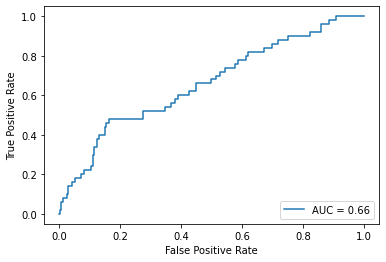

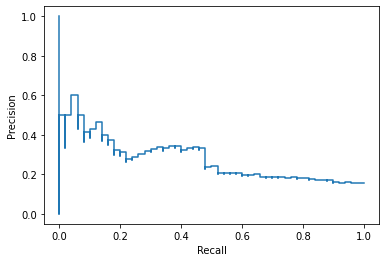

Accuracy:	0.5947521865889213
Precision:	0.20134228187919462
Recall:	0.6
F1:	0.3015075376884422
ROC-AUC:	0.6591808873720136
PR-AUC:	0.26465231202057077


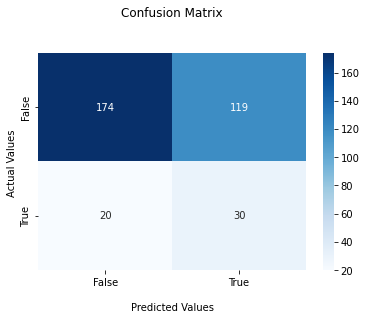

In [ ]:
evaluation(y_test, y_pred, y_pred_prob)

We then analyze the feature importance of the tuned model so that we can compare with the baseline model.

In [ ]:
train = pd.read_csv("train.csv")
X, y = train.drop('depressed', axis=1), train['depressed']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

#split_survey_date
piped_X_train = pp_survey_date.transform(X_train)

#handle_outliers
piped_X_train = pp_handle_outliers.transform(piped_X_train)

#drop_columns
piped_X_train = pp_drop_columns.transform(piped_X_train)

#scaler
display_columns = piped_X_train.columns
piped_X_train = MinMaxScaler().fit_transform(piped_X_train)
piped_X_train = pd.DataFrame(piped_X_train, columns=display_columns)

#impute
display_columns = piped_X_train.columns
piped_X_train = KNNImputer(n_neighbors=5).fit_transform(piped_X_train)
piped_X_train = pd.DataFrame(piped_X_train, columns=display_columns)
imputed_x_train = piped_X_train.copy()

#variance threshold
X_copy = piped_X_train.copy()
display_cloumns = X_copy.columns
variance_threhold = VarianceThreshold() 
piped_X_train = variance_threhold.fit_transform(piped_X_train)
mask = variance_threhold.get_support(indices=True)
display_cloumns = X_copy[display_columns[mask]].columns
piped_X_train = X_copy.filter(display_cloumns)

# #select k best
X_copy = piped_X_train.copy()
display_cloumns = X_copy.columns
select_k_best = SelectKBest(k=30)
piped_X_train = select_k_best.fit_transform(piped_X_train, y_train)
mask = select_k_best.get_support(indices=True)
display_cloumns = imputed_x_train[display_columns[mask]].columns
piped_X_train = imputed_x_train.filter(display_cloumns)
# #resampling
rus = RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)
X_under, y_under = rus.fit_resample(piped_X_train, y_train)
X_under.head()

,age,married,edu,asset_livestock,asset_durable,asset_phone,asset_land_owned_total,cons_alcohol,cons_tobacco,cons_social,ent_wagelabor,ent_business,ent_nonag_revenue,ent_nonag_flowcost,ent_farmexpenses,ent_animalstockrev,fs_chskipm_often,fs_meat,fs_sleephun,med_expenses_hh_ep,med_afford_port,med_sickdays_hhave,med_healthconsult,med_u5_deaths,ed_expenses_perkid,nondurable_investment,given_mpesa,amount_given_mpesa,amount_received_mpesa,saved_mpesa
0,0.310811,0.0,0.500000,0.264541,0.303827,0.208333,0.714286,0.0,0.0,0.076336,0.0,0.0,0.0,0.0,0.289142,0.921502,0.000,0.090909,0.0,0.000000,1.000000,0.016129,1.000000,0.312500,0.705882,0.618966,0.0,0.0,0.000000,1.0
1,0.324324,0.0,0.555556,0.182352,0.263496,0.000000,0.714286,0.0,0.0,0.229008,0.0,1.0,0.0,0.0,0.699666,0.000000,0.090,0.090909,0.0,0.524018,1.000000,0.225806,1.000000,0.541667,0.310065,0.214707,0.0,0.0,0.000000,0.0
2,0.229730,1.0,0.388889,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.275,0.163636,0.4,0.309825,0.613333,0.056774,0.553333,0.625000,0.147059,0.000000,0.0,0.0,0.000000,0.0
3,0.743243,0.0,0.222222,0.094479,0.411974,0.000000,0.015873,0.0,0.0,0.080153,0.0,0.0,0.0,0.0,0.401338,0.085324,1.000,0.090909,1.0,0.165284,0.550000,0.000000,0.316667,0.395833,0.041830,0.048754,0.0,0.0,0.022727,0.0
4,0.121622,1.0,0.277778,0.988989,0.324142,0.000000,0.000000,0.0,0.0,0.169466,1.0,0.0,0.0,0.0,0.254181,0.177474,0.000,0.090909,0.0,0.039301,0.000000,0.056452,0.000000,0.250000,0.235294,0.057594,0.0,0.0,0.000000,1.0


In [ ]:
explainer = shap.LinearExplainer(estimator_pipeline['clf'], X_under)
shap_values = explainer.shap_values(X_under)

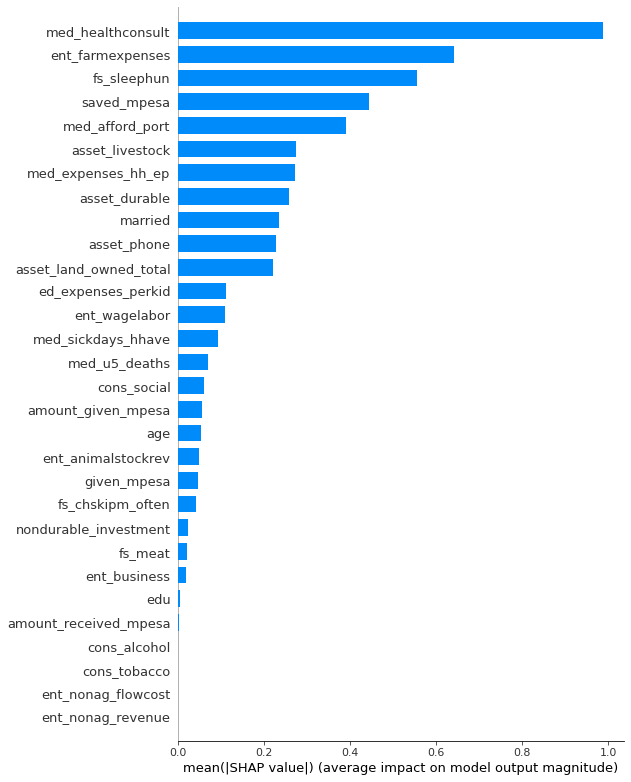

In [ ]:
shap.summary_plot(shap_values, X_under, plot_type='bar', max_display=30)

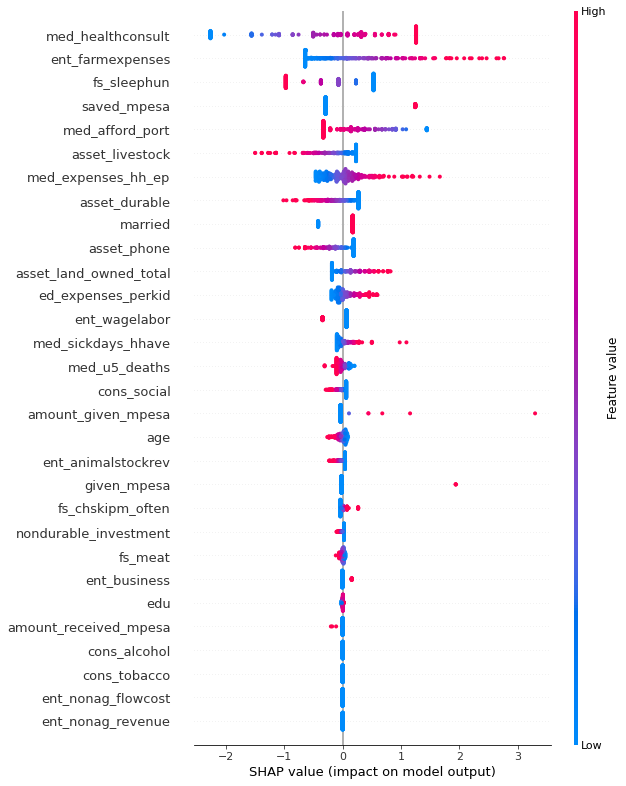

In [ ]:
shap.summary_plot(shap_values, X_under, max_display=30)

####Removal of least important features

From the feature importance, we observed that some features have 0 SHAP values, indicating that they do not have any contribution on model performance. We attempt to check if the performance of the model will improve if we remove these features from the training data.

First, we manually add features that have 0 SHAP values to the dropping features stage of the pipeline

In [ ]:
columns_drop_eda = ['med_vacc_newborns', 'med_child_check', 'wage_expenditures', 'asset_niceroof', 'hh_totalmembers', 'hhsize', 
                    'hh_children', 'cons_allfood', 'cons_ownfood', 'cons_other', 'durable_investment', 'asset_savings', 'cons_ownfood', 
                    'cons_med_children', 'ed_expenses', 'labor_primary', 'ent_total_cost', 'fs_adskipm_often', 
                    'fs_chwholed_often', 'med_portion_sickinjured', 'net_mpesa']
columns_to_drop = columns_drop_eda + ['surveyid', 'ent_nonag_revenue', 'ent_nonag_flowcost', 'cons_tobacco', 'cons_alcohol']
columns_to_drop

#@title
class TransformerDropColumns():
    def __init__(self,columns):
        self.columns=columns

    def fit(self, X, y=None):
        return self

    def transform(self,X,y=None):
      global X_clone
      X_clone = X.drop(self.columns,axis=1, errors='ignore')
      return X_clone

pp_drop_columns = TransformerDropColumns(columns_to_drop)

The max_iter was reached which means the coef_ did not converge


The max_iter was reached which means the coef_ did not converge


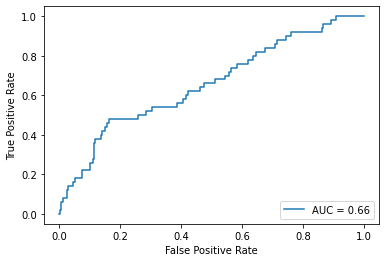

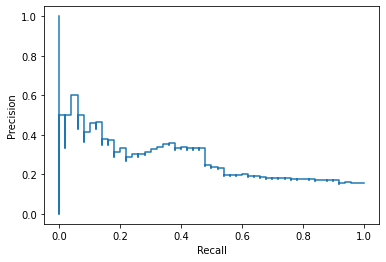

Accuracy:	0.5889212827988338
Precision:	0.19463087248322147
Recall:	0.58
F1:	0.29145728643216084
ROC-AUC:	0.6561092150170648
PR-AUC:	0.2650595804063293


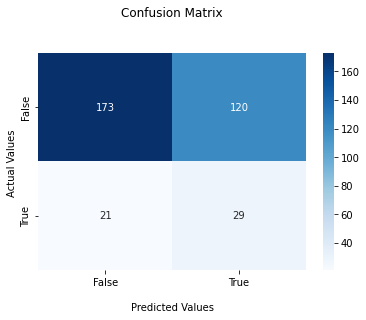

In [ ]:
X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('scaler', MinMaxScaler()),
    ('impute', pp_knn_imputer),
    ('variance_threshold', VarianceThreshold()),
    ('select_k_best', SelectKBest(k=30)),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', LogisticRegression(
        random_state=0, 
        solver='saga', 
        penalty='l1',
        C=206.913808111479
        )
    )
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
estimator_pipeline.fit(X, y)
evaluation(y_test, y_pred, y_pred_prob)

We can observe that the performance actually worsened with a slightly lower f1 score.

We generate the feature importance again in order to try to understand why the performance worsened

In [ ]:
train = pd.read_csv("train.csv")
X, y = train.drop('depressed', axis=1), train['depressed']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

#split_survey_date
piped_X_train = pp_survey_date.transform(X_train)

#handle_outliers
piped_X_train = pp_handle_outliers.transform(piped_X_train)

#drop_columns
piped_X_train = pp_drop_columns.transform(piped_X_train)

#scaler
display_columns = piped_X_train.columns
piped_X_train = MinMaxScaler().fit_transform(piped_X_train)
piped_X_train = pd.DataFrame(piped_X_train, columns=display_columns)

#impute
display_columns = piped_X_train.columns
piped_X_train = KNNImputer(n_neighbors=5).fit_transform(piped_X_train)
piped_X_train = pd.DataFrame(piped_X_train, columns=display_columns)
imputed_x_train = piped_X_train.copy()

#variance threshold
X_copy = piped_X_train.copy()
display_cloumns = X_copy.columns
variance_threhold = VarianceThreshold() 
piped_X_train = variance_threhold.fit_transform(piped_X_train)
mask = variance_threhold.get_support(indices=True)
display_cloumns = X_copy[display_columns[mask]].columns
piped_X_train = X_copy.filter(display_cloumns)

# #select k best
X_copy = piped_X_train.copy()
display_cloumns = X_copy.columns
select_k_best = SelectKBest(k=30)
piped_X_train = select_k_best.fit_transform(piped_X_train, y_train)
mask = select_k_best.get_support(indices=True)
display_cloumns = imputed_x_train[display_columns[mask]].columns
piped_X_train = imputed_x_train.filter(display_cloumns)
# #resampling
rus = RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)
X_under, y_under = rus.fit_resample(piped_X_train, y_train)
X_under.head()

,age,married,edu,asset_livestock,asset_durable,asset_phone,asset_land_owned_total,cons_med_total,cons_ed,ent_ownfarm,ent_business,ent_employees,ent_animalstockrev,fs_adwholed_often,fs_meat,fs_enoughtom,med_expenses_hh_ep,med_expenses_sp_ep,med_port_sick_child,med_afford_port,ed_expenses_perkid,ed_schoolattend,ed_sch_missedpc,ed_work_act_pc,nondurable_investment,amount_received_mpesa,saved_mpesa,amount_saved_mpesa,day_of_week,survey_day
0,0.310811,0.0,0.500000,0.264541,0.303827,0.208333,0.714286,0.0,0.45,1.0,0.0,0.0,0.921502,0.00,0.090909,0.0,0.000000,0.334,0.000000,1.000000,0.705882,0.666667,0.000000,0.80,0.618966,0.000000,1.0,0.0,0.833333,0.600000
1,0.324324,0.0,0.555556,0.182352,0.263496,0.000000,0.714286,0.0,0.00,0.0,1.0,0.0,0.000000,0.05,0.090909,0.0,0.524018,0.344,0.600000,1.000000,0.278431,0.533333,0.094118,0.36,0.214707,0.000000,0.0,0.0,1.000000,0.700000
2,0.229730,1.0,0.388889,0.000000,0.000000,0.000000,0.000000,0.0,0.00,0.0,0.0,0.0,0.000000,0.00,0.163636,0.4,0.309825,0.226,0.733333,0.613333,0.147059,0.466667,0.094118,0.30,0.000000,0.000000,0.0,0.0,0.333333,0.800000
3,0.743243,0.0,0.222222,0.094479,0.411974,0.000000,0.047619,0.0,0.08,1.0,0.0,0.0,0.085324,0.00,0.090909,1.0,0.165284,0.075,0.000000,0.550000,0.041830,0.444444,0.000000,0.40,0.048754,0.022727,0.0,0.0,0.666667,0.700000
4,0.121622,1.0,0.277778,0.988989,0.324142,0.000000,0.000000,0.0,0.30,0.0,0.0,0.0,0.177474,0.00,0.090909,0.0,0.039301,0.048,0.500000,0.000000,0.235294,0.333333,0.000000,0.00,0.057594,0.000000,1.0,0.0,0.833333,0.366667


In [ ]:
explainer = shap.LinearExplainer(estimator_pipeline['clf'], X_under)
shap_values = explainer.shap_values(X_under)

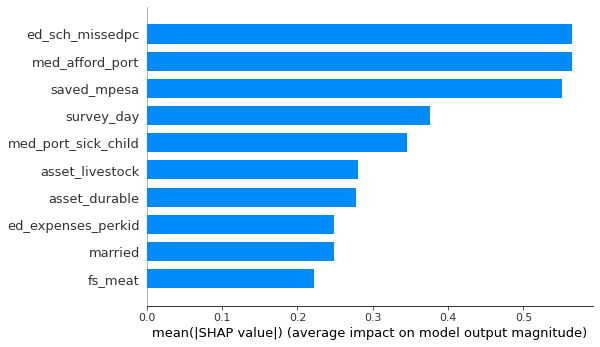

In [ ]:
shap.summary_plot(shap_values, X_under, plot_type='bar', max_display=10)

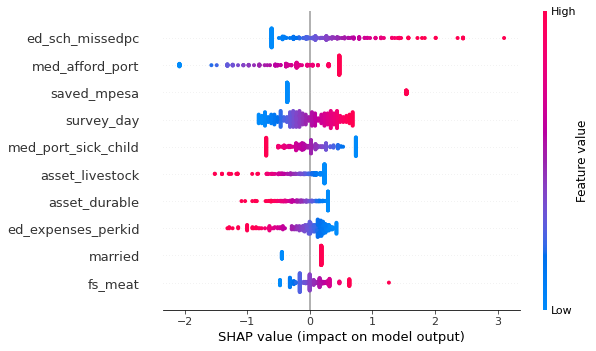

In [ ]:
shap.summary_plot(shap_values, X_under, max_display=10)

#Advanced XGBClassifier

## Baseline XGBClassifier

For the pipeline, it contains the same processing components as the baseline model. XGBClassifier is a boosting model and thus sensitve to outliers and thus outlier imputation is still necessary. At the same time, although XGBClassifier performs implicit feature selection, we still included selectKBest to reduce the likelihood of overfitting. Afterall, we can tune SelectKBest to choose the optimal number of features to retain as well.  

In [ ]:
#@title
X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('variance_threshold', VarianceThreshold()),
    ('select_k_best', SelectKBest()),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', XGBClassifier(
        random_state=0
        ))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
estimator_pipeline.fit(X, y)

Pipeline(steps=[('split_survey_date',
                 <__main__.TransformerSurveyDate object at 0x7fc19f208310>),
                ('handle_outliers',
                 <__main__.TransformerHandleOutliers object at 0x7fc19f208490>),
                ('drop_columns',
                 <__main__.TransformerDropColumns object at 0x7fc19eddd390>),
                ('impute', KNNImputer()),
                ('variance_threshold', VarianceThreshold()),
                ('select_k_best', SelectKBest()),
                ('resampling',
                 RandomUnderSampler(random_state=0, replacement=True,
                                    sampling_strategy='majority')),
                ('clf', XGBClassifier())])

### Evaluation of baseline

#### Metric

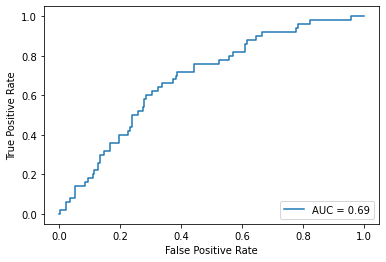

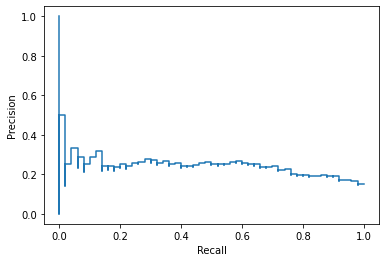

Accuracy:	0.5743440233236151
Precision:	0.22093023255813954
Recall:	0.76
F1:	0.3423423423423424
ROC-AUC:	0.6856655290102388
PR-AUC:	0.2326542279299168


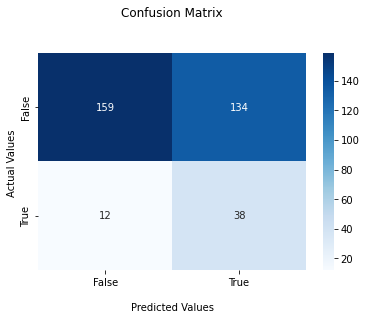

In [ ]:
evaluation(y_test, y_pred, y_pred_prob)

####Feature importance

XGBboost provides the plot_importance method that allows us to view the importance of each feature in our dataset based on 3 metrics:

1. Weight. The number of times a feature is used to split the data across all trees.
2. Cover. The number of times a feature is used to split the data across all trees weighted by the number of training data points that go through those splits.
3. Gain. The average training loss reduction gained when using a feature for splitting.

However, we cannot rely on these metrics as they tend to produce drastically different importance, and there is no universal one in determining which metric is the best.

To visualize feature importance, we have to use the training data after processing. Hence, we manually perform the same steps to derive the processed training data.

In [ ]:
train = pd.read_csv("train.csv")
X, y = train.drop('depressed', axis=1), train['depressed']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=0)

#split_survey_date
piped_X_train = pp_survey_date.transform(X_train)

#handle_outliers
piped_X_train = pp_handle_outliers.transform(piped_X_train)

#drop_columns
piped_X_train = pp_drop_columns.transform(piped_X_train)

#impute
display_columns = piped_X_train.columns
piped_X_train = KNNImputer(n_neighbors=5).fit_transform(piped_X_train)
piped_X_train = pd.DataFrame(piped_X_train, columns=display_columns)
imputed_x_train = piped_X_train.copy()

#variance_threshold
X_copy = piped_X_train.copy()
display_cloumns = X_copy.columns
variance_threhold = VarianceThreshold() 
piped_X_train = variance_threhold.fit_transform(piped_X_train)
mask = variance_threhold.get_support(indices=True)
display_cloumns = X_copy[display_columns[mask]].columns
piped_X_train = X_copy.filter(display_cloumns)

#select_k_best
X_copy = piped_X_train.copy()
display_cloumns = X_copy.columns
select_k_best = SelectKBest()
piped_X_train = select_k_best.fit_transform(piped_X_train, y_train)
mask = select_k_best.get_support(indices=True)
display_cloumns = imputed_x_train[display_columns[mask]].columns
piped_X_train = imputed_x_train.filter(display_cloumns)

#resampling
rus = RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)
X_under, y_under = rus.fit_resample(piped_X_train, y_train)
X_under.head()

,age,married,edu,cons_alcohol,cons_tobacco,ent_nonag_revenue,ent_animalstockrev,med_expenses_hh_ep,med_u5_deaths,amount_received_mpesa
0,40.0,0.0,10.0,0.0,0.0,0.0,7.206916,0.000000,0.600000,0.000000
1,41.0,0.0,11.0,0.0,0.0,0.0,0.000000,6.406148,0.666667,0.000000
2,34.0,1.0,8.0,0.0,0.0,0.0,0.000000,3.090966,0.766667,0.000000
3,72.0,0.0,5.0,0.0,0.0,0.0,0.667307,6.467007,0.450000,8.007685
4,26.0,1.0,6.0,0.0,0.0,0.0,3.491351,0.480461,0.566667,0.000000


We use the Tree explainer as XGBoost is tree-based

In [ ]:
explainer = shap.TreeExplainer(estimator_pipeline['clf'])
shap_values = explainer.shap_values(X_under)

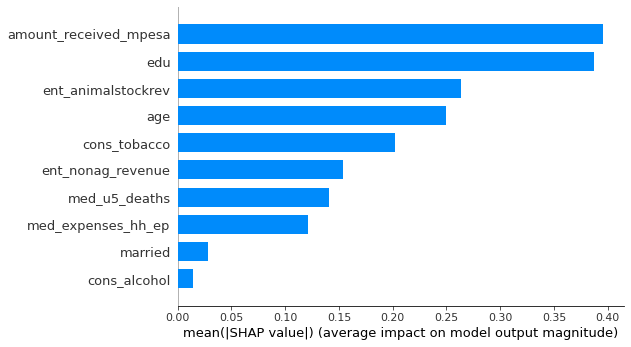

In [ ]:
shap.summary_plot(shap_values, X_under, plot_type='bar')

The features are ordered by how much they influenced the model’s prediction. The x-axis stands for the average of the absolute SHAP value of each feature. edu is the most important feature

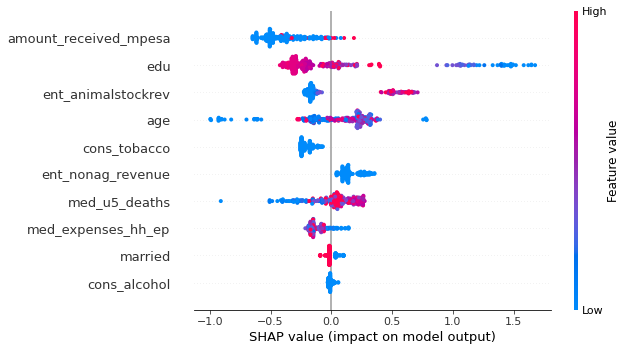

In [ ]:
shap.summary_plot(shap_values, X_under)

In this chart, the x-axis stands for SHAP value, and the y-axis has all the features. Each point on the chart is one SHAP value for a prediction and feature. Red color means higher value of a feature. Blue means lower value of a feature. We can get the general sense of features’ directionality impact based on the distribution of the red and blue dots.

For example, low level of education leads to high chance of depression, and low level of med_sickdays_hhave lead to low chance of depression


## Hyper-parameter tuning

We tuned parameters that affect overfitting in XGBoost based on the documentation.

There are in general two ways that you can control overfitting in XGBoost:
1. The first way is to directly control model complexity.
- This includes max_depth, min_child_weight and gamma.
2. The second way is to add randomness to make training robust to noise.
- This includes subsample and colsample_bytree.
3. You can also reduce stepsize eta. Remember to increase num_round when you do so.

In [ ]:
parameters = {
    'clf__n_estimators' : [100, 200, 400],
    'clf__learning_rate' : [0.01, 0.05, 0.1, 0.2],
    'clf__max_depth': [3, 6, 10, 20],
    'clf__colsample_bytree': [0.3, 0.7, 1],
    'clf__reg_alpha' : [0.0, 0.1, 0.5,1.0],
    'clf__reg_lambda' : [0.0, 0.1, 0.5, 1.0],
    'select_k_best__k': range(10, 40, 10)
}

clf = GridSearchCV(estimator_pipeline,                   
                   param_grid = parameters,   
                   scoring='f1',        
                   cv=5)

clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
y_pred_prob  = clf.predict_proba(X_test)[:,1]

In [ ]:
estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('variance_threshold', VarianceThreshold()),
    ('select_k_best', SelectKBest()),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', XGBClassifier(
          random_state=0,
          learning_rate=0.2,
          max_depth=6,
          colsample_bytree=1,
          reg_alpha=0.5,
          reg_lambda=1
        ))
])

estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
estimator_pipeline.fit(X, y)

Pipeline(steps=[('split_survey_date',
                 <__main__.TransformerSurveyDate object at 0x7fc19f22f090>),
                ('handle_outliers',
                 <__main__.TransformerHandleOutliers object at 0x7fc19fbd7110>),
                ('drop_columns',
                 <__main__.TransformerDropColumns object at 0x7fc19fb757d0>),
                ('impute', KNNImputer()),
                ('variance_threshold', VarianceThreshold()),
                ('select_k_best', SelectKBest()),
                ('resampling',
                 RandomUnderSampler(random_state=0, replacement=True,
                                    sampling_strategy='majority')),
                ('clf',
                 XGBClassifier(learning_rate=0.2, max_depth=6, reg_alpha=0.5))])

###Evaluation of tuned classifier

####Metric

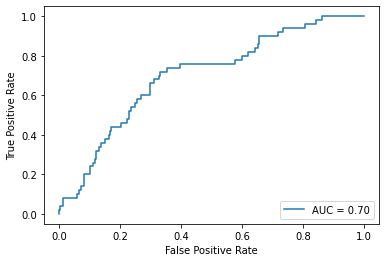

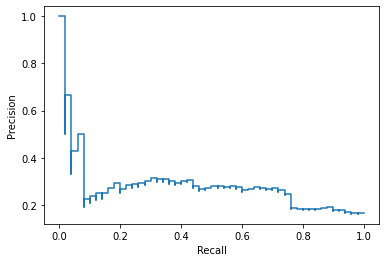

Accuracy:	0.5801749271137027
Precision:	0.2235294117647059
Recall:	0.76
F1:	0.34545454545454546
ROC-AUC:	0.7013651877133106
PR-AUC:	0.27582109216954687


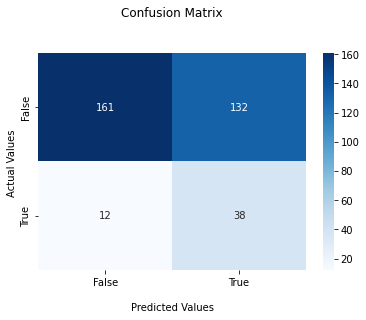

In [ ]:
evaluation(y_test, y_pred, y_pred_prob)

####Feature importance

In [ ]:
explainer = shap.TreeExplainer(estimator_pipeline['clf'])
shap_values = explainer.shap_values(X_under)

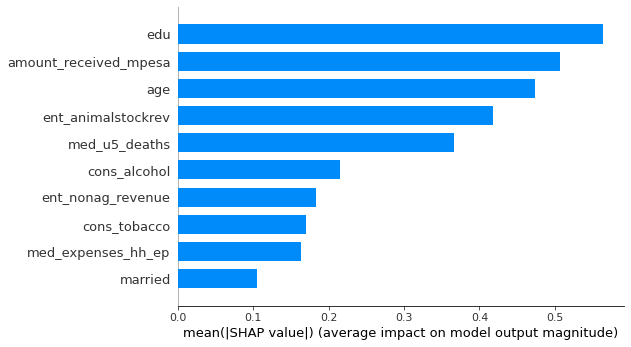

In [ ]:
shap.summary_plot(shap_values, X_under, plot_type='bar')

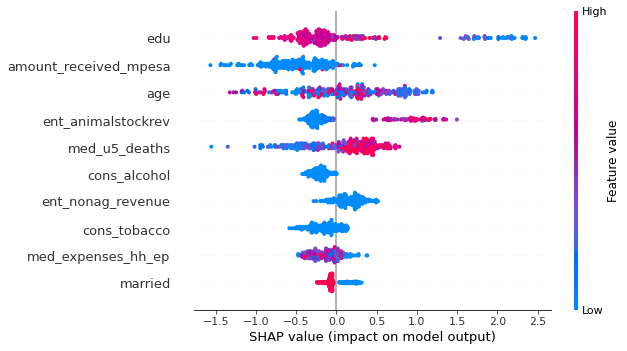

In [ ]:
shap.summary_plot(shap_values, X_under)

#### Local feature importance for a specific observation (Report)

In [ ]:
# plotting local feature importance for a specific observation
shap.initjs()
# shap.force_plot(explainer.expected_value, shap_values)
shap.force_plot(
    explainer.expected_value,
    shap_values[1, :],
    X_under.iloc[1, :],
)

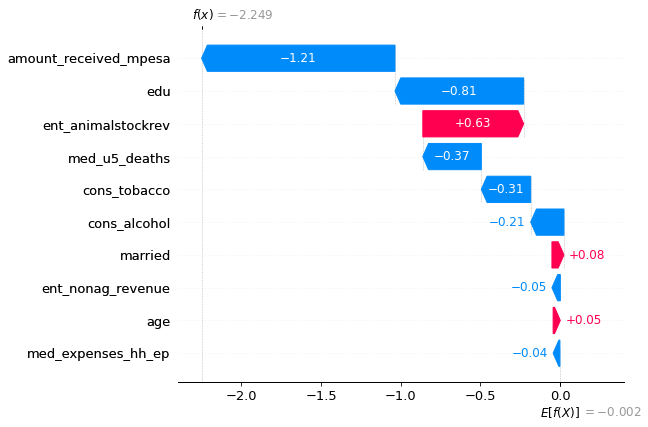

In [ ]:
shap.plots._waterfall.waterfall_legacy(
    explainer.expected_value, 
    shap_values[0],
    feature_names=X_under.columns.tolist()
    )

#Attempted Advanced Models

We tried different models ranging from various ensemble models to non-distance based models

##Decision Tree

###Baseline decision tree

During the induction of decision trees, the optimal feature is selected to split the data based on metrics like information gain, so we do not include the selectKBest component in this pipeline. At the same time, since decision tree is not a distanced based model, scaling is not necessary. 

However, dropping features with high correlation and 0 variance are still useful. As decision tree is also affected by outliers and imbalanced datasets, these components are kept in the pipeline.

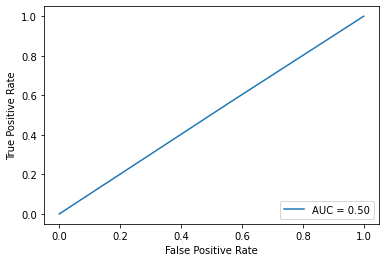

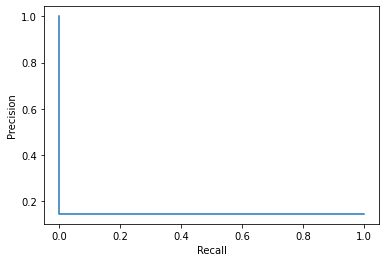

Accuracy:	0.4606413994169096
Precision:	0.14659685863874344
Recall:	0.56
F1:	0.2323651452282158
ROC-AUC:	0.5018430034129693
PR-AUC:	0.3853684001648528


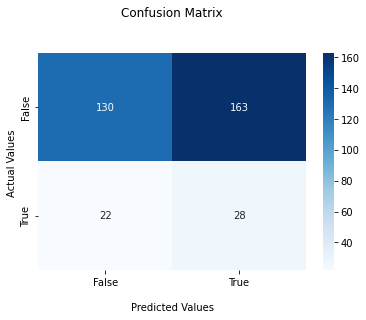

In [ ]:
#@title

X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('variance_threshold', VarianceThreshold()),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', DecisionTreeClassifier(random_state=0))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
evaluation(y_test, y_pred, y_pred_prob)

###Hyper-parameter tuning

We tuned parameters that affect the complexity of the decision tree, as it affects overfitting.

In [ ]:
# Hyper-parameter tuning

parameters = {
    'clf__min_samples_leaf': range(1, 5, 1),
    'clf__min_samples_split': range(2, 6, 1),
    'clf__max_features': ['sqrt', 'log2', None]
}

clf = GridSearchCV(estimator_pipeline,                   
                   param_grid = parameters,   
                   scoring='f1',        
                   cv=5)       
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
y_pred_prob  = clf.predict_proba(X_test)[:,1]

In [ ]:
clf.best_params_

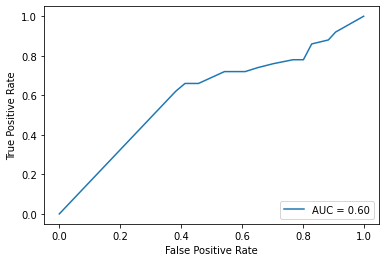

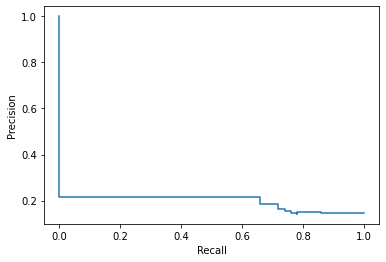

Accuracy:	0.6180758017492711
Precision:	0.21678321678321677
Recall:	0.62
F1:	0.3212435233160622
ROC-AUC:	0.6001706484641638
PR-AUC:	0.4390472469948069


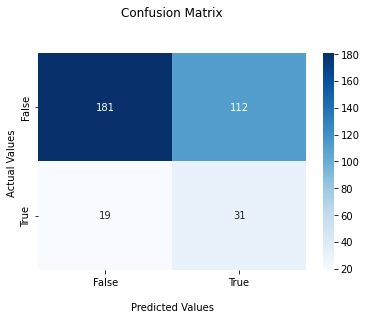

In [ ]:
#@title

X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('variance_threshold', VarianceThreshold()),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', DecisionTreeClassifier(random_state=0, class_weight={0: 0.99, 1: 0.01}, min_samples_leaf=1, min_samples_split=24, max_features='sqrt'))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
evaluation(y_test, y_pred, y_pred_prob)

##Naive Bayesian Models

Scaling is removed from the pipeline as NB is not a distance based model and thus not necessary to include scaling. Also, feature selection is not required due to the class independence assumption. Naive Bayes classifiers can quickly learn to use high dimensional features with limited training data.

NB models also have limited hyperparameters to tune and we can mainly only tune alpha. The performance is largely dependent on the training data quality and processing.

###Multinomial Naive Bayes classifier

#### Baseline MultinomialNB

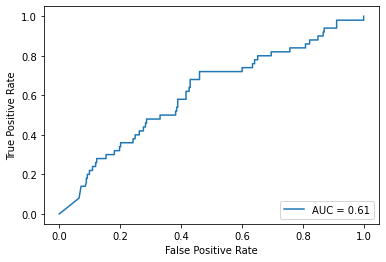

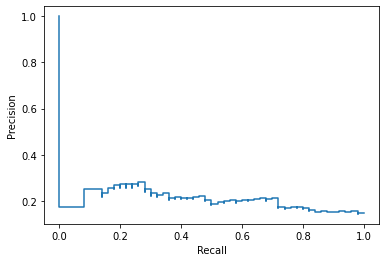

Accuracy:	0.5189504373177842
Precision:	0.1925133689839572
Recall:	0.72
F1:	0.3037974683544304
ROC-AUC:	0.6134129692832765
PR-AUC:	0.23164462746801714


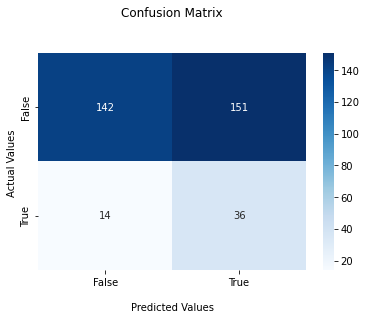

In [ ]:
X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', MultinomialNB())
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
estimator_pipeline.fit(X, y)
evaluation(y_test, y_pred, y_pred_prob)

#### Hyper-parameter tuning

In [ ]:
# Hyper-parameter tuning

parameters = {
    "clf__alpha" : [0.5, 0.6, 0.7, 0.8, 0.9, 1.0]
}

clf = GridSearchCV(estimator_pipeline,                   
                   param_grid = parameters,   
                   scoring='f1',        
                   cv=5)       
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
y_pred_prob  = clf.predict_proba(X_test)[:,1]

In [ ]:
clf.best_params_

{'clf__alpha': 0.5}

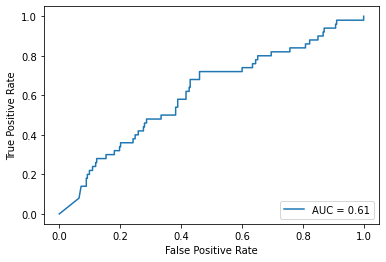

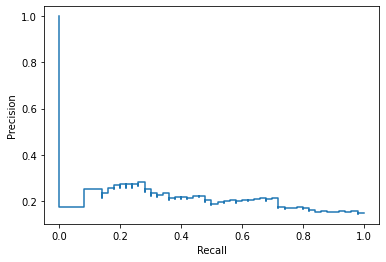

Accuracy:	0.5189504373177842
Precision:	0.1925133689839572
Recall:	0.72
F1:	0.3037974683544304
ROC-AUC:	0.6135153583617748
PR-AUC:	0.23165192355646086


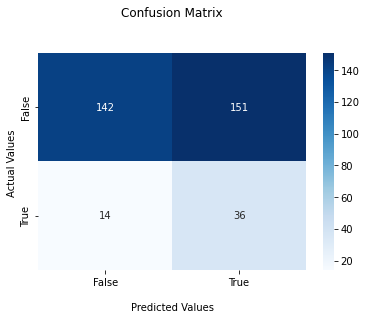

In [ ]:
X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', MultinomialNB(alpha=0.5))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
estimator_pipeline.fit(X, y)
evaluation(y_test, y_pred, y_pred_prob)

### Complement Naive Bayes classifier

Complement NB is targetted for imbalanced datasets as it computes the complement probability. As such, undersampling component is removed from the pipeline.

#### Baseline ComplementNB

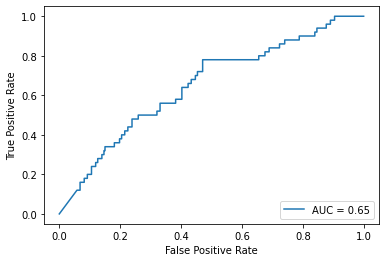

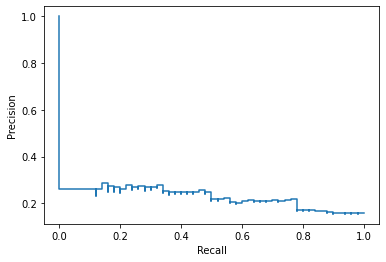

Accuracy:	0.5451895043731778
Precision:	0.21195652173913043
Recall:	0.78
F1:	0.3333333333333333
ROC-AUC:	0.6496928327645052
PR-AUC:	0.2674681159951779


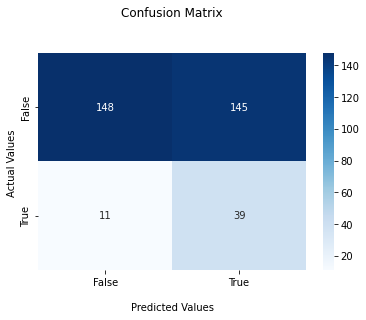

In [ ]:
X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('clf', ComplementNB())
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
estimator_pipeline.fit(X, y)
evaluation(y_test, y_pred, y_pred_prob)

#### Hyper-parameter tuning

In [ ]:
# Hyper-parameter tuning

parameters = {
    "clf__alpha" : [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    "clf__norm": [True, False]
}

clf = GridSearchCV(estimator_pipeline,                   
                   param_grid = parameters,   
                   scoring='f1',        
                   cv=5)       
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
y_pred_prob  = clf.predict_proba(X_test)[:,1]

In [ ]:
clf.best_params_

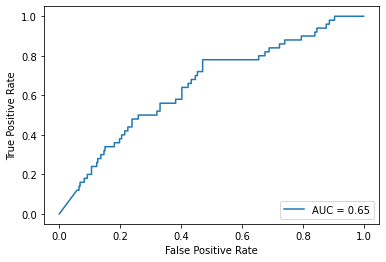

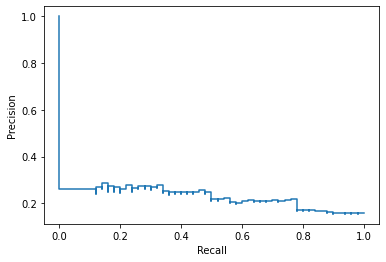

Accuracy:	0.5451895043731778
Precision:	0.21195652173913043
Recall:	0.78
F1:	0.3333333333333333
ROC-AUC:	0.6496928327645052
PR-AUC:	0.2676343912983251


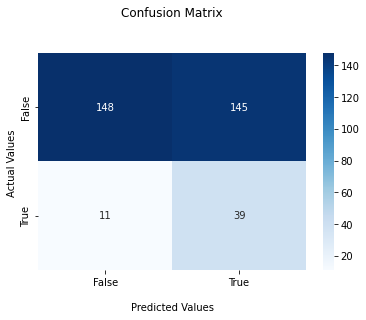

In [ ]:
X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('clf', ComplementNB(alpha=0.5, norm=False))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
estimator_pipeline.fit(X, y)
evaluation(y_test, y_pred, y_pred_prob)

## Boosting Models

###Gradient Boosting

####Baseline gradient boosting

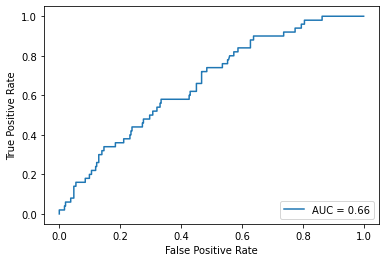

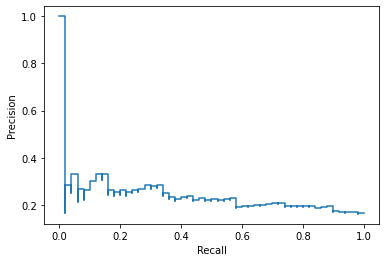

Accuracy:	0.8279883381924198
Precision:	0.32
Recall:	0.16
F1:	0.21333333333333335
ROC-AUC:	0.6616723549488055
PR-AUC:	0.23896907994931416


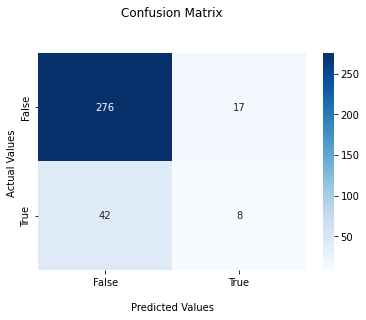

In [ ]:
#@title

X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('clf', GradientBoostingClassifier(random_state=0))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
evaluation(y_test, y_pred, y_pred_prob)

####Hyper-parameter tuning

We tuned parameters that mainly affect the complexity of the model to avoid overfitting

In [ ]:
parameters = {
    'clf__learning_rate': [0.01, 0.1, 0.5, 0.7],
    'clf__n_estimators': [100, 500, 1000],
    'clf__min_samples_leaf': range(1, 5, 1),
    'clf__min_samples_split': range(2, 6, 1),
    'clf__max_depth': range(2, 8, 1)
}

clf = GridSearchCV(estimator_pipeline,                   
                   param_grid = parameters,   
                   scoring='f1',        
                   cv=5)       
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
y_pred_prob  = clf.predict_proba(X_test)[:,1]

In [ ]:
clf.best_params_

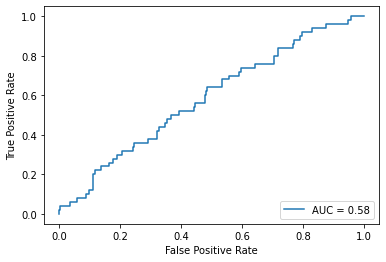

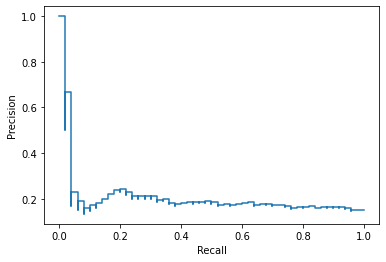

Accuracy:	0.7288629737609329
Precision:	0.2054794520547945
Recall:	0.3
F1:	0.24390243902439024
ROC-AUC:	0.5842320819112627
PR-AUC:	0.20288543808541715


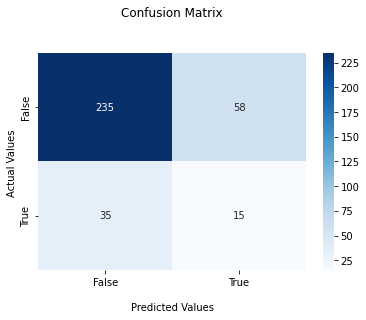

In [ ]:
#@title

X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('clf', GradientBoostingClassifier(
        random_state=0, 
        learning_rate=0.7, 
        min_samples_split=4, 
        min_samples_leaf=1, 
        max_depth=2, 
        n_estimators=500))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
evaluation(y_test, y_pred, y_pred_prob)

##Bagging Models

###Random Forest Classifier

#### Baseline RandomForestClassifier

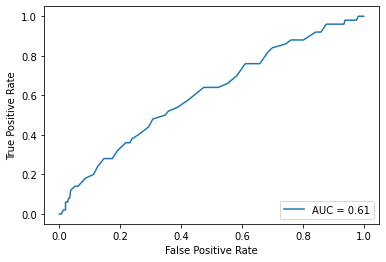

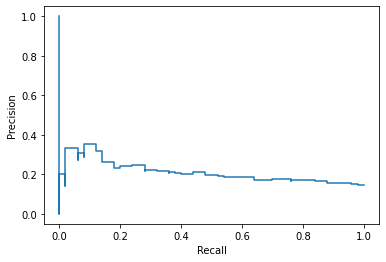

Accuracy:	0.5422740524781341
Precision:	0.1871345029239766
Recall:	0.64
F1:	0.28959276018099545
ROC-AUC:	0.609249146757679
PR-AUC:	0.20446730973755856


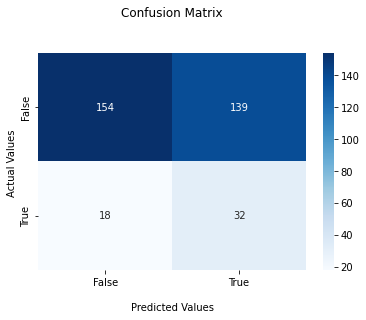

In [ ]:
#@title

X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', RandomForestClassifier(random_state=0))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
estimator_pipeline.fit(X, y)
evaluation(y_test, y_pred, y_pred_prob)

#### Hyper-parameter tuning

We tuned parameters that mainly affect the complexity of each decision tree to avoid overfitting



In [ ]:
# Hyper-parameter tuning

parameters = {
    "clf__max_depth" : [None, 1,3,5,7,9,11,12],
    "clf__min_samples_split": [0.01, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
}

clf = GridSearchCV(estimator_pipeline,                   
                   param_grid = parameters,   
                   scoring='f1',        
                   cv=5)       
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
y_pred_prob  = clf.predict_proba(X_test)[:,1]
evaluation(y_test, y_pred, y_pred_prob)

In [ ]:
clf.best_params_

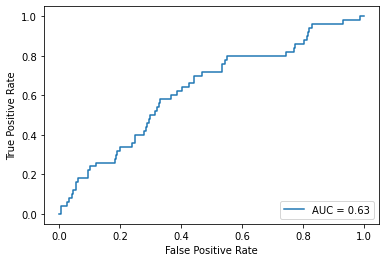

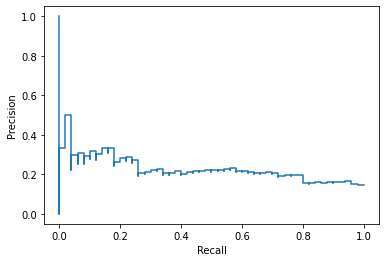

Accuracy:	0.5801749271137027
Precision:	0.20625
Recall:	0.66
F1:	0.3142857142857143
ROC-AUC:	0.6326962457337884
PR-AUC:	0.2177166373166478


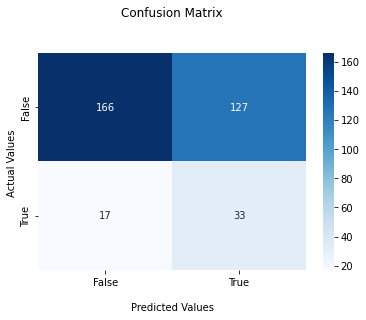

In [ ]:
# Retrain model with best parameter

# X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', RandomForestClassifier(
        random_state=0,
        max_depth=3,
        min_samples_split=0.2
        ))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
estimator_pipeline.fit(X, y)
evaluation(y_test, y_pred, y_pred_prob)

### Bagging with Decision Tree

#### Baseline Bagging with Decision Tree

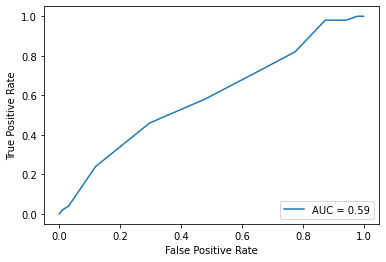

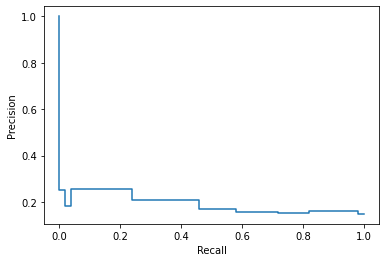

Accuracy:	0.5306122448979592
Precision:	0.17159763313609466
Recall:	0.58
F1:	0.2648401826484018
ROC-AUC:	0.5906825938566552
PR-AUC:	0.20123289568494873


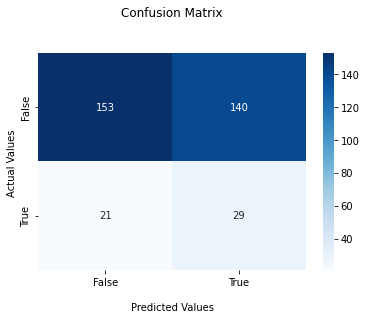

In [ ]:
#@title

X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=0), random_state=0))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
evaluation(y_test, y_pred, y_pred_prob)

#### Hyper-parameter tuning

In [ ]:
parameters = {
    'clf__base_estimator__min_samples_leaf': range(1, 5, 1),
    'clf__base_estimator__min_samples_split': range(2, 6, 1),
    'clf__n_estimators': [10, 50, 100],
}

clf = GridSearchCV(estimator_pipeline,                   
                   param_grid = parameters,   
                   scoring='f1',        
                   cv=5)       
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
y_pred_prob  = clf.predict_proba(X_test)[:,1]
evaluation(y_test, y_pred, y_pred_prob)

In [ ]:
clf.best_params_

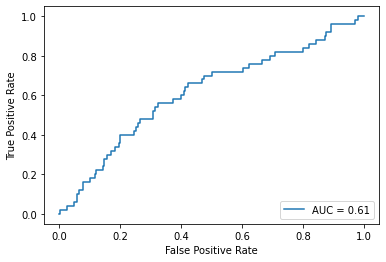

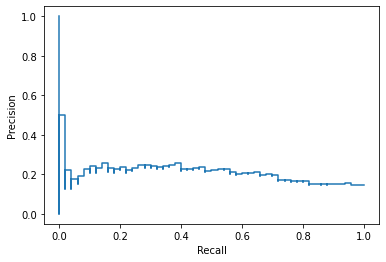

Accuracy:	0.5393586005830904
Precision:	0.19662921348314608
Recall:	0.7
F1:	0.30701754385964913
ROC-AUC:	0.6143344709897611
PR-AUC:	0.20023976211657352


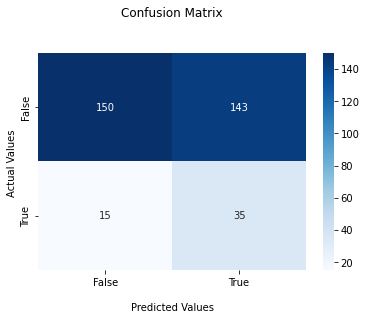

In [ ]:
#@title

X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('impute', pp_knn_imputer),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', BaggingClassifier(base_estimator=DecisionTreeClassifier(random_state=0, min_samples_leaf=4, min_samples_split=2), random_state=0, n_estimators=50))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
evaluation(y_test, y_pred, y_pred_prob)

### Bagging with Logistic Regression

While logistic regression is a model with high bias, and bagging is meant to reduce models with high variance, we still attempted bagging with logisitc regression to compare if the performance will improve.

#### Baseline Bagging with Logistic Regression

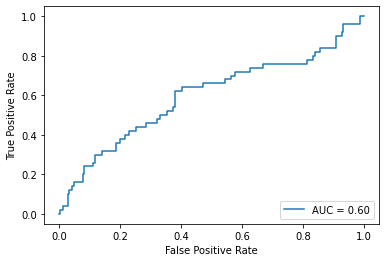

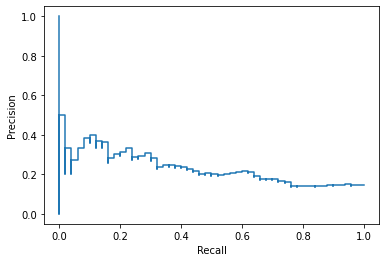

Accuracy:	0.6472303206997084
Precision:	0.20168067226890757
Recall:	0.48
F1:	0.28402366863905326
ROC-AUC:	0.5969283276450513
PR-AUC:	0.22047193601668016


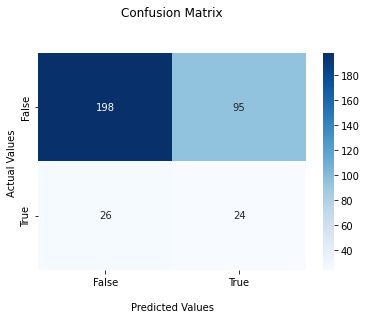

In [ ]:
#@title

X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('scaler', MinMaxScaler()),
    ('impute', pp_knn_imputer),
    ('variance_threshold', VarianceThreshold()),
    ('select_k_best', SelectKBest()),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', BaggingClassifier(base_estimator=LogisticRegression(random_state=0), random_state=0))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
evaluation(y_test, y_pred, y_pred_prob)

#### Hyper-parameter tuning

In [ ]:
parameters = {
    'clf__base_estimator__penalty': ['l2', 'l1'],
    'clf__base_estimator__C'       : np.logspace(-4, 4, 10),
    'clf__base_estimator__solver'  : ['saga', 'liblinear'],
    'clf__n_estimators': [10, 50, 100]
}

clf = GridSearchCV(estimator_pipeline,                   
                   param_grid = parameters,   
                   scoring='f1',        
                   cv=5)       
clf.fit(X_train, y_train)
y_pred = clf.predict(X_test)
y_pred_train = clf.predict(X_train)
y_pred_prob  = clf.predict_proba(X_test)[:,1]
evaluation(y_test, y_pred, y_pred_prob)

In [ ]:
clf.best_params_

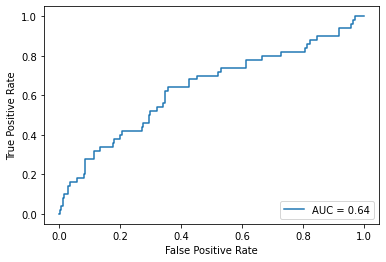

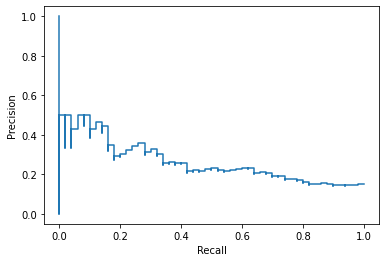

Accuracy:	0.6443148688046647
Precision:	0.21875
Recall:	0.56
F1:	0.3146067415730337
ROC-AUC:	0.6350170648464164
PR-AUC:	0.2512421682938083


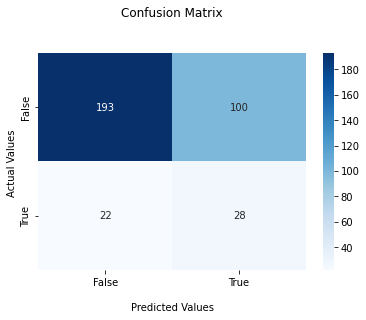

In [ ]:
#@title

X_clone

estimator_pipeline = Pipeline(steps=[
    ('split_survey_date', pp_survey_date),
    ('handle_outliers', pp_handle_outliers),
    ('drop_columns', pp_drop_columns),
    ('scaler', MinMaxScaler()),
    ('impute', pp_knn_imputer),
    ('variance_threshold', VarianceThreshold()),
    ('select_k_best', SelectKBest()),
    ('resampling', RandomUnderSampler(sampling_strategy='majority', replacement=True, random_state=0)),
    ('clf', BaggingClassifier(base_estimator=LogisticRegression(random_state=0, C=21.54434690031882, solver='saga', penalty='l2'), random_state=0, n_estimators=100))
])
estimator_pipeline.fit(X_train, y_train)
y_pred = estimator_pipeline.predict(X_test)
y_pred_prob  = estimator_pipeline.predict_proba(X_test)[:,1]
y_pred_train = estimator_pipeline.predict(X_train)
evaluation(y_test, y_pred, y_pred_prob)